# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
de_dir_path = '../results/DE/mammals/ANOVA_zscore/'

In [3]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']

In [4]:
os.listdir(de_dir_path)

['anova_zscore_human_sig_genes.csv',
 'anova_zscore_mamm.csv',
 'cluster_spectr_anova_6.csv',
 'cluster_spectr_anova_7.csv',
 'cluster_spectr_anova_8.csv',
 'cluster_spectr_anova_9.csv',
 'cluster_spectr_hs_6.csv',
 'cluster_spectr_hs_7.csv',
 'cluster_spectr_hs_8.csv',
 'cluster_spectr_hs_9.csv',
 'desktop.ini',
 'human_specific_genes_6.csv',
 'ssGSEA_human_sig_genes.csv',
 'ttest_human_sig_genes.csv',
 'ttest_sign_genes.csv',
 'ttest_zscore_human_monkeys.csv',
 'ttest_zscore_mamm.csv']

### DE results

In [5]:
anova_res = pd.read_csv(de_dir_path + 'anova_zscore_mamm.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
NOC2L,6.384890,12.0,0.813337,0.635908,0.716158
HES4,15.058197,12.0,1.878258,0.052758,0.121203
AGRN,15.583493,12.0,3.171660,0.001230,0.007732
SDF4,14.214074,12.0,1.574430,0.120231,0.220228
B3GALT6,12.113356,12.0,1.676662,0.091658,0.181660


In [6]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_zscore_mamm.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,AGRN,L1,human,chimp,0.334627,0.749294,0.871771
1,ANKRD65,L1,human,chimp,-0.558470,0.596733,0.772328
2,TMEM240,L1,human,chimp,2.100247,0.080450,0.274743
3,NADK,L1,human,chimp,-5.641027,0.001330,0.038326
4,GNB1,L1,human,chimp,0.164405,0.874811,0.941712


## Load normalized pseudobulks

In [7]:
pb_dir_path = '../data/pseudobulks/'

In [8]:
os.listdir(pb_dir_path)

['annotation_chimp.csv',
 'annotation_human.csv',
 'annotation_macaque.csv',
 'annotation_spatial_libd_human.csv',
 'expression_chimp.csv',
 'expression_human.csv',
 'expression_macaque.csv',
 'expression_mean_chimp.csv',
 'expression_mean_human.csv',
 'expression_mean_macaque.csv',
 'expression_mean_spatial_libd_human.csv',
 'expression_spatial_libd_human.csv',
 'expression_sum_chimp.csv',
 'expression_sum_human.csv',
 'expression_sum_macaque.csv',
 'expression_sum_spatial_libd_human.csv',
 'gene_sample_mean_chimp.csv',
 'gene_sample_mean_human.csv',
 'gene_sample_mean_macaque.csv',
 'gene_sample_mean_spatial_libd_human.csv',
 'pb_age.h5ad',
 'pb_age_sample_norm.h5ad',
 'pb_age_sample_norm_zscore.h5ad',
 'pb_mamm.h5ad',
 'pb_mamm_filtered.h5ad',
 'pb_mamm_laminar_filtered.h5ad',
 'pb_mamm_laminar_sample_zscore_filtered.h5ad',
 'pb_mamm_sample_norm.h5ad',
 'pb_mamm_sample_norm_filtered.h5ad',
 'pb_mamm_sample_norm_zscore.h5ad',
 'pb_mamm_sample_zscore_filtered.h5ad']

In [9]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mamm_sample_norm_filtered.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

# Calculate differencies

In [10]:
adata_pb_norm[(adata_pb_norm.obs.condition == 'human') & (adata_pb_norm.obs.layer == 'L1')].obs

,layer,sample_id,condition,lib_size,log_lib_size
L1.human_759,L1,human_759,human,1922.905518,7.561593
L1.human_j12,L1,human_j12,human,2501.380371,7.824598
L1.human_j3,L1,human_j3,human,3437.235840,8.142423
L1.human_j4,L1,human_j4,human,3236.211426,8.082159
L1.human_j6,L1,human_j6,human,1907.776001,7.553693


In [11]:
# calculate average expr for each layer of each specie
mean_norm_expr_dict = dict()
for specie in ['human', 'chimp', 'macaque']:
    mean_norm_expr = pd.DataFrame(index=adata_pb_norm.var_names, columns=layers)
    for layer in layers:
        mean_norm_expr[layer] = np.array(adata_pb_norm[(adata_pb_norm.obs.condition == specie) &
                                                       (adata_pb_norm.obs.layer == layer)].X.mean(axis=0))
    mean_norm_expr_dict[specie] = mean_norm_expr

In [12]:
# calculate diff
human_chimp_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['chimp']
human_macaque_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['macaque']
chimp_macaque_diff = mean_norm_expr_dict['chimp'] - mean_norm_expr_dict['macaque']

Text(0.5, 1.0, 'chimp vs macaque diff')

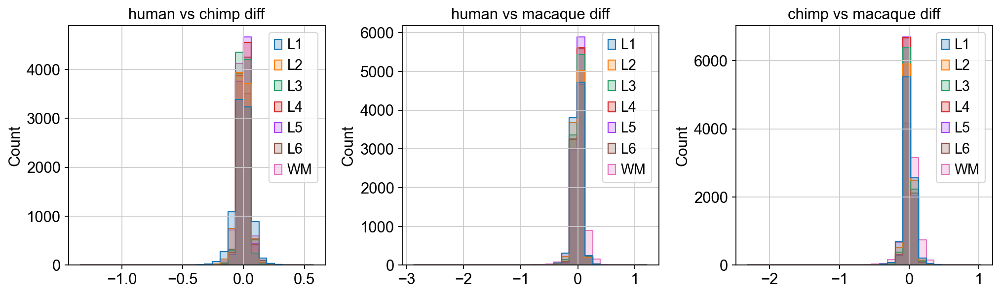

In [13]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), gridspec_kw={'wspace': 0.3})

sns.histplot(human_chimp_diff, bins=30, element="step", ax=ax[0])
ax[0].set_title('human vs chimp diff')

sns.histplot(human_macaque_diff, bins=30, element="step", ax=ax[1])
ax[1].set_title('human vs macaque diff')

sns.histplot(chimp_macaque_diff, bins=30, element="step", ax=ax[2])
ax[2].set_title('chimp vs macaque diff')

# Human-specific genes for each layer

## Calculate the ratio

Load human vs chimp and human vs macaque differecies to one dataframe

In [14]:
hum_stack = human_chimp_diff.stack().to_frame().swaplevel(1, 0)
hum_stack.columns = ['human_chimp_diff']
hum_stack['human_macaque_diff'] = human_macaque_diff.stack().swaplevel(1, 0)
hum_stack['ΔHC/ΔHM'] = hum_stack['human_chimp_diff'] / hum_stack['human_macaque_diff']
hum_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC/ΔHM
L1,NOC2L,0.005005,0.001646,3.040403
L2,NOC2L,-0.003285,-0.041400,0.079346
L3,NOC2L,-0.008007,-0.035306,0.226792
L4,NOC2L,-0.004902,0.006270,-0.781881
L5,NOC2L,0.060071,-0.012766,-4.705729


Add t-test results for ANOVA significant genes

In [15]:
hum_stack['hc_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'chimp')].set_index(['layer', 'gene']).p_val_adj
hum_stack['hm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack['cm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'chimp') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack.head()

#hum_stack['mult_diff'] = hum_stack['human_chimp_diff'] * hum_stack['human_macaque_diff']
#hum_spec_stack = hum_stack[hum_stack.mult_diff > 0].sort_index()
#hum_spec_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC/ΔHM,hc_p_val_adj,hm_p_val_adj,cm_p_val_adj
L1,NOC2L,0.005005,0.001646,3.040403,NaN,NaN,NaN
L2,NOC2L,-0.003285,-0.041400,0.079346,NaN,NaN,NaN
L3,NOC2L,-0.008007,-0.035306,0.226792,NaN,NaN,NaN
L4,NOC2L,-0.004902,0.006270,-0.781881,NaN,NaN,NaN
L5,NOC2L,0.060071,-0.012766,-4.705729,NaN,NaN,NaN


Text(0, 0.5, 'Number of genes')

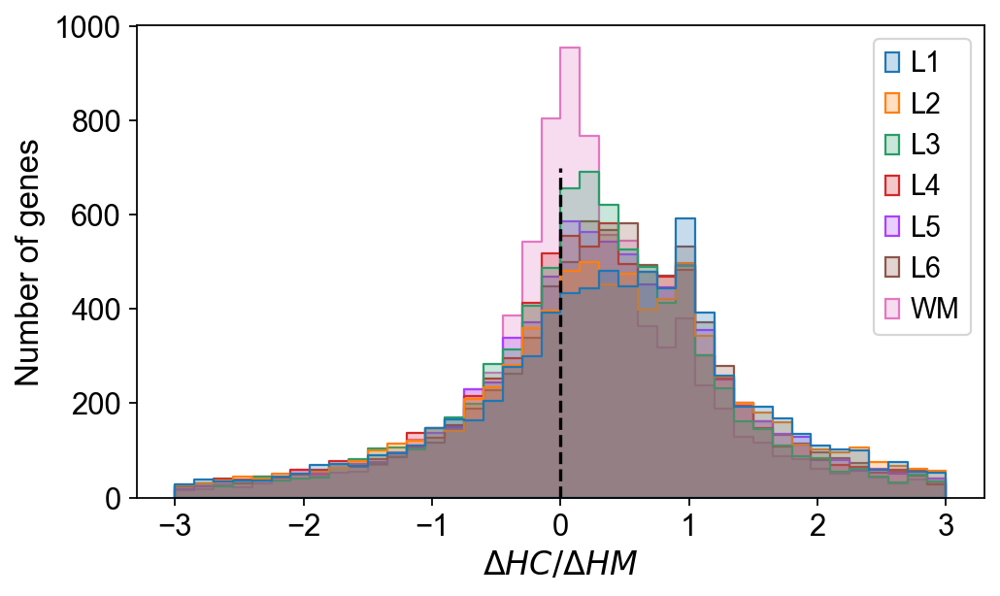

In [16]:
fig, ax = plt.subplots(figsize=(7, 4))
sns.histplot(hum_stack['ΔHC/ΔHM'].unstack().T, element="step", binrange=[-3, 3], bins=40)
plt.vlines(0, ymin=0, ymax=700, colors='black', linestyles='dashed')
ax.grid(False)
ax.set_xlabel('$\Delta HC / \Delta HM$', fontsize=15)
ax.set_ylabel('Number of genes', fontsize=15)

In [17]:
(hum_stack['ΔHC/ΔHM'] > 0).value_counts()

ΔHC/ΔHM
True     41575
False    22881
Name: count, dtype: int64

## Filter human-specific genes

 $$0.5 \le \frac{\Delta HC}{\Delta HM} \le 1 $$

In [18]:
hum_stack[hum_stack.hc_p_val_adj < 0.05]

human_chimp_diff  human_macaque_diff   ΔHC/ΔHM  hc_p_val_adj  \
L3 ANKRD65          0.068578            0.074507  0.920421      0.012686   
L1 NADK            -0.071748           -0.022086  3.248540      0.038326   
L2 SDHB             0.101011           -0.118561 -0.851973      0.036998   
   IGSF21          -0.267670           -0.316392  0.846008      0.027571   
WM ARID1A          -0.129536           -0.046357  2.794284      0.035675   
...                      ...                 ...       ...           ...   
   KCNJ4            0.029801            0.029595  1.006976      0.035218   
   NRIP1           -0.093327           -0.033478  2.787669      0.005447   
L1 JAM2            -0.243489           -0.383388  0.635098      0.044106   
L3 PAXBP1          -0.057709           -0.030276  1.906086      0.036245   
WM IFNAR1           0.094808            0.077065  1.230241      0.035481   

            hm_p_val_adj  cm_p_val_adj  
L3 ANKRD65      0.019659      0.859273  
L1 NADK         0.492308      0.424684  
L2 SDHB         0.098305      0.006456  
   IGSF21       0.055093      0.459414  
WM ARID1A       0.465121      0.459233  
...                  ...           ...  
   KCNJ4        0.033748      0.430670  
   NRIP1        0.873152      0.126502  
L1 JAM2         0.029377      0.905574  
L3 PAXBP1       0.372909      0.069156  
WM IFNAR1       0.229102      0.672939  

[426 rows x 6 columns]

In [19]:
hs_samples_diff = ((hum_stack['ΔHC/ΔHM'] >= 0.5) & (hum_stack['ΔHC/ΔHM'] <= 1))
hs_samples_pval = ((hum_stack['ΔHC/ΔHM'] >= 0) & (hum_stack['ΔHC/ΔHM'] <= 1) & (hum_stack.hc_p_val_adj < 0.05))
hum_spec = hum_stack[hs_samples_diff | hs_samples_pval].copy()
hum_spec

,,human_chimp_diff,human_macaque_diff,ΔHC/ΔHM,hc_p_val_adj,hm_p_val_adj,cm_p_val_adj
L4,HES4,-0.004372,-0.005072,0.861985,NaN,NaN,NaN
L5,HES4,-0.042364,-0.059311,0.714261,NaN,NaN,NaN
L6,HES4,-0.031234,-0.032113,0.972604,NaN,NaN,NaN
L5,AGRN,0.066722,0.085784,0.777794,0.310671,0.176731,0.616095
L6,AGRN,0.076883,0.137060,0.560941,0.296999,0.206336,0.575696
...,...,...,...,...,...,...,...
WM,POFUT2,0.012737,0.013246,0.961599,NaN,NaN,NaN
L2,COL18A1,0.074617,0.077333,0.964884,0.398328,0.285080,0.864234
L3,COL18A1,0.070503,0.088447,0.797118,0.396689,0.170678,0.401943
L1,YBEY,0.037067,0.045715,0.810831,NaN,NaN,NaN


In [20]:
hs_tr = [0.5, 0.6, 0.7, 0.8]
hs_genes_tr = []

for tr in hs_tr:
    hs_samples_diff = ((hum_stack['ΔHC/ΔHM'] >= tr) & (hum_stack['ΔHC/ΔHM'] <= 1))
    hs_samples_pval = ((hum_stack['ΔHC/ΔHM'] >= 0) & (hum_stack['ΔHC/ΔHM'] <= 1) & (hum_stack.hc_p_val_adj < 0.05))
    hs = hum_stack[hs_samples_diff | hs_samples_pval].copy()
    hs_genes_tr.append(hs['ΔHC/ΔHM'].unstack().notna().astype(int))

## Layer statistics

Count number of human-specific genes for each layer

In [21]:
hum_spec_onehot = hum_spec['ΔHC/ΔHM'].unstack().notna().astype(int)
hum_spec_onehot.sum().value_counts()

1    3205
2    1860
3     741
4     282
5      83
6      14
7       9
Name: count, dtype: int64

In [22]:
hum_spec_onehot.to_csv('results/hum_spec_onehot.csv')

Text(0.5, 1.0, 'Number of human-specific genes for each layer')

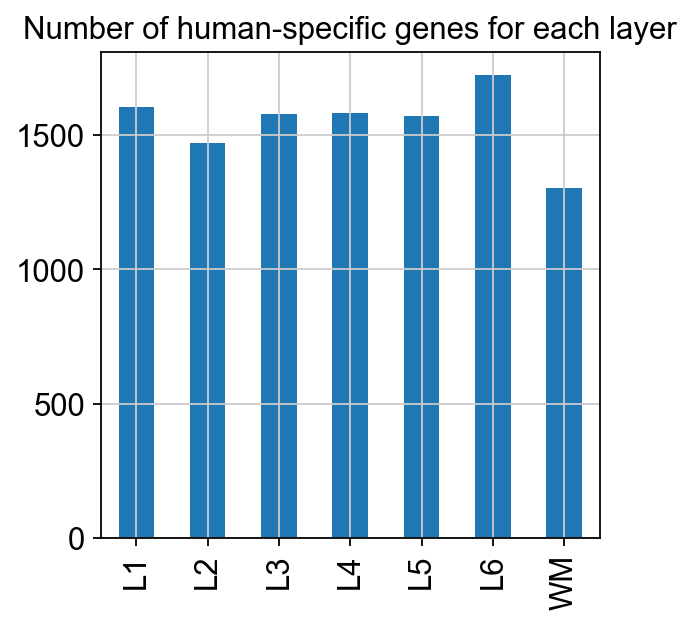

In [23]:
hum_spec_onehot.sum(axis=1).plot.bar()
plt.title('Number of human-specific genes for each layer')

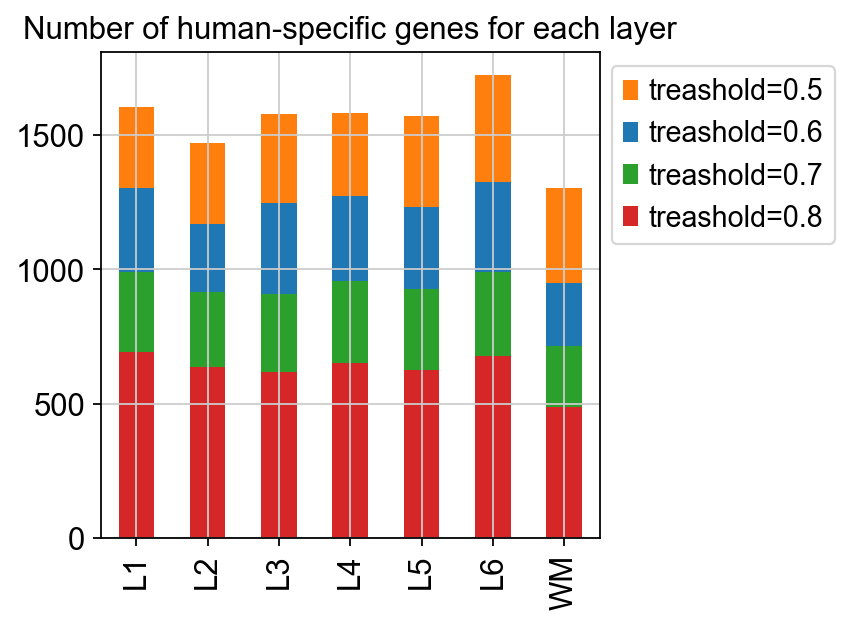

In [24]:
fig, ax = plt.subplots(figsize=(4, 4))

hs_genes_tr[0].sum(axis=1).plot.bar(ax=ax, color='tab:orange')
hs_genes_tr[1].sum(axis=1).plot.bar(ax=ax, color='tab:blue')
hs_genes_tr[2].sum(axis=1).plot.bar(ax=ax, color='tab:green')
hs_genes_tr[3].sum(axis=1).plot.bar(ax=ax, color='tab:red')
#ax.legend(ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
plt.title('Number of human-specific genes for each layer')
plt.legend([f'treashold={tr}' for tr in hs_tr], loc='upper right', bbox_to_anchor=(1.5, 1))

In [25]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(hum_spec_onehot), columns=hum_spec_onehot.index, index=hum_spec_onehot.index)
pairwise_jaccard

,L1,L2,L3,L4,L5,L6,WM
L1,1.000000,0.116068,0.120775,0.119775,0.122261,0.129623,0.102273
L2,0.116068,1.000000,0.126709,0.109699,0.122050,0.130527,0.105494
L3,0.120775,0.126709,1.000000,0.139510,0.122238,0.116295,0.136830
L4,0.119775,0.109699,0.139510,1.000000,0.123620,0.113093,0.119380
L5,0.122261,0.122050,0.122238,0.123620,1.000000,0.134642,0.117761
L6,0.129623,0.130527,0.116295,0.113093,0.134642,1.000000,0.104265
WM,0.102273,0.105494,0.136830,0.119380,0.117761,0.104265,1.000000


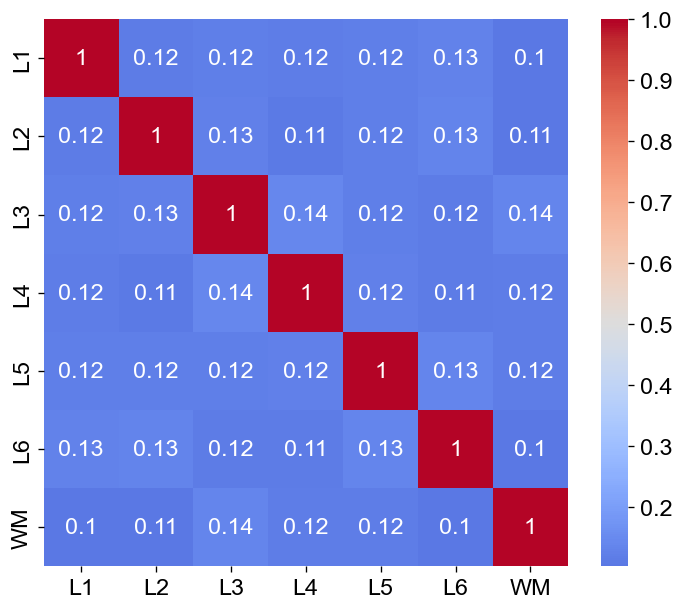

In [26]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(pairwise_jaccard, annot=True, cmap = 'coolwarm', center=0.5)
plt.grid(False)

In [27]:
from itertools import combinations
count_df = pd.DataFrame(columns=hum_spec_onehot.index, index=hum_spec_onehot.index)
for lay1, lay2 in combinations(layers, 2):
    count_num = (hum_spec_onehot.loc[lay1] * hum_spec_onehot.loc[lay2]).sum()
    count_df.loc[[lay1, lay2], [lay1, lay2]] = count_num
    count_df.loc[lay1, lay1] = hum_spec_onehot.loc[lay1].sum()
    count_df.loc[lay2, lay2] = hum_spec_onehot.loc[lay2].sum()
count_df = count_df.astype(int)
count_df

,L1,L2,L3,L4,L5,L6,WM
L1,1605,320,343,341,346,382,270
L2,320,1472,343,302,331,369,265
L3,343,343,1578,387,343,344,347
L4,341,302,387,1583,347,336,308
L5,346,331,343,347,1571,391,303
L6,382,369,344,336,391,1724,286
WM,270,265,347,308,303,286,1305


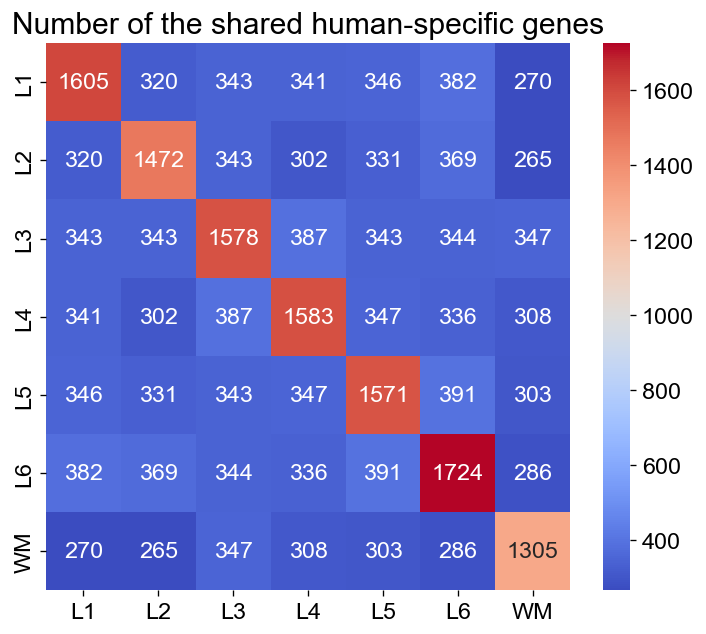

In [28]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(count_df, annot=True, cmap = 'coolwarm', fmt=".0f")
plt.title('Number of the shared human-specific genes', fontsize=18)
plt.grid(False)

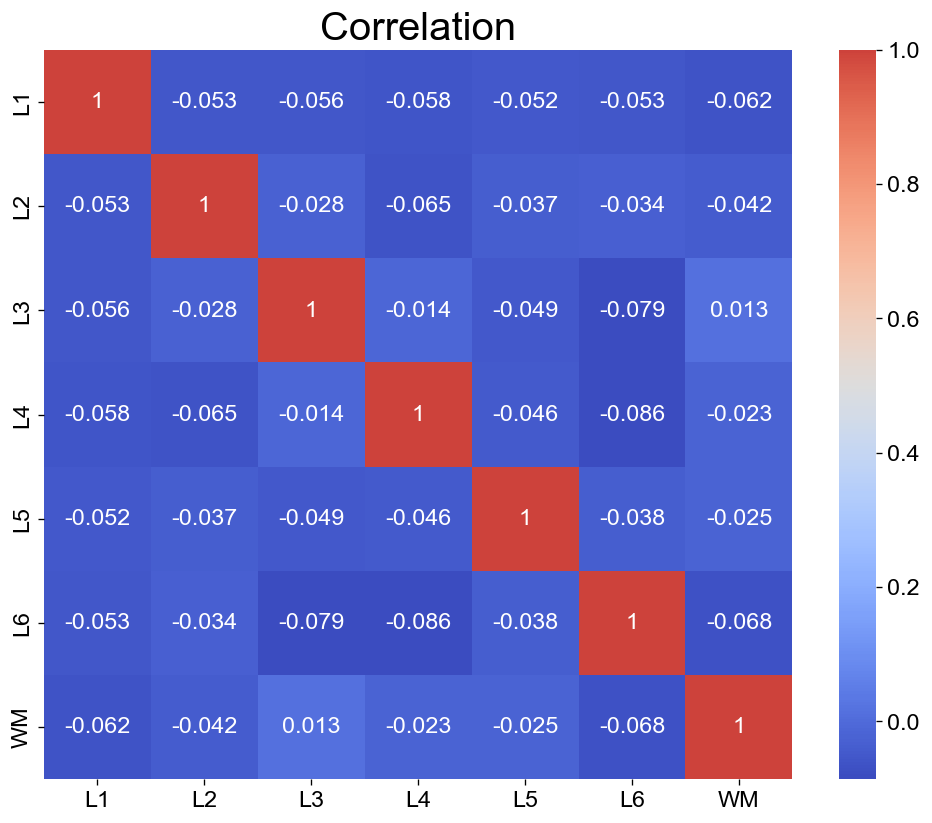

In [29]:
plt.figure(figsize=(10, 8), dpi=60)
sns.heatmap(hum_spec_onehot.T.corr(), annot=True, cmap = 'coolwarm', center=0.5, fmt='.2g')
plt.title('Correlation', fontsize=24)
plt.grid(False)

## Cluster human-specific genes

In [30]:
df = pd.DataFrame(adata_pb_norm.X, index=adata_pb_norm.obs_names, columns=adata_pb_norm.var_names)
df.head()

,NOC2L,HES4,AGRN,SDF4,B3GALT6,UBE2J2,SCNN1D,ACAP3,PUSL1,INTS11,...,SLC19A1,COL6A2,SPATC1L,LSS,MCM3AP,YBEY,PCNT,DIP2A,S100B,PRMT2
WM.human_759,-0.029434,0.000060,-0.043513,-0.047352,0.019730,0.073377,-0.025426,0.066394,-0.005994,0.083730,...,-0.024605,-0.030153,0.062796,0.006477,0.006101,-0.060417,0.043866,0.194249,-0.013059,0.086238
L5.human_759,0.041378,-0.070859,0.081056,-0.035505,0.081751,0.024801,-0.044137,-0.004835,0.042257,-0.097683,...,0.050453,0.024884,0.031172,-0.011941,0.004423,0.048610,0.010844,-0.003836,-0.163151,-0.036175
L2.human_759,0.003540,0.078116,-0.094614,0.048347,-0.015289,-0.041880,0.051197,-0.011478,-0.012885,0.011412,...,-0.101996,-0.067572,0.010210,-0.086683,-0.034970,0.014981,-0.022672,-0.073343,-0.099143,0.033223
L3.human_759,0.014209,0.003650,0.055936,-0.024306,-0.030928,-0.005821,-0.020386,-0.024487,0.006003,0.040760,...,0.006111,-0.036663,-0.056161,-0.006650,0.039214,-0.016340,-0.015449,-0.077759,-0.158493,-0.059132
L1.human_759,-0.084783,0.076086,-0.060492,0.055313,-0.022007,-0.051856,-0.003284,-0.015899,-0.068717,0.025030,...,0.063681,0.174612,-0.047302,0.132038,-0.019618,0.023529,0.050175,0.009793,0.679210,0.060245


In [31]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = samples.sort_values()
    order_laminar = order[order.str.contains('L')].tolist()
    order_wm = order[order.str.contains('WM')].tolist()
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]

### Иерархическая кластеризация

d:\projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


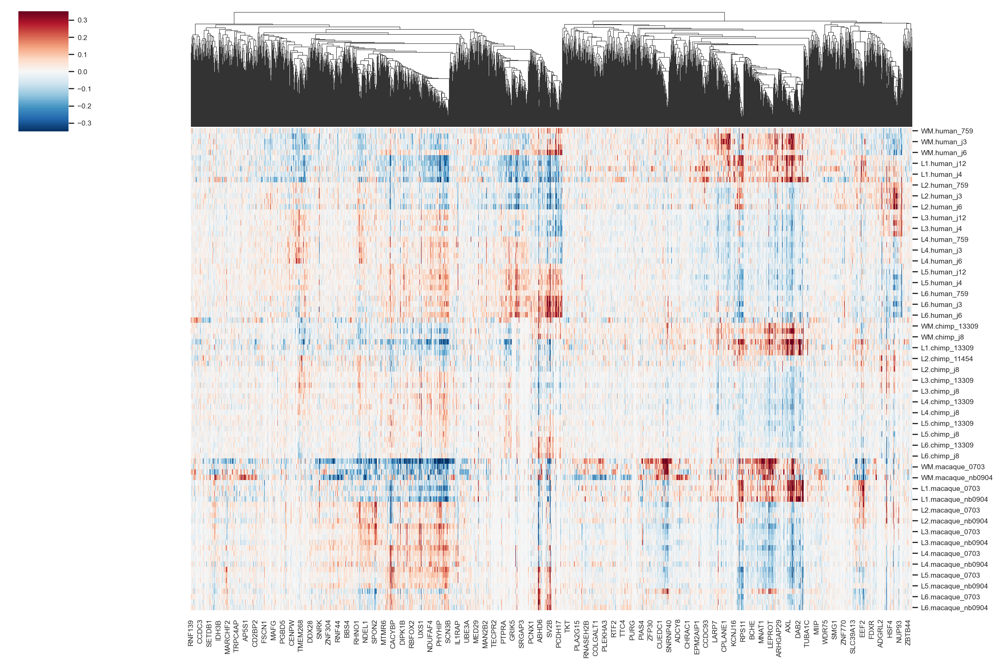

In [36]:
sns.set(font_scale=0.7)
sns.clustermap(df[hum_spec_onehot.columns], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.35, vmin=-0.35, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

### Спектральная кластеризация

In [37]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hum_spec_onehot.columns].T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [38]:
hs_labels = pd.Series(clustering.labels_, index=hum_spec_onehot.columns).sort_values()
order = hs_labels.sort_values().index

In [39]:
#hs_labels.to_csv('results/hs_layers.csv')

<Axes: >

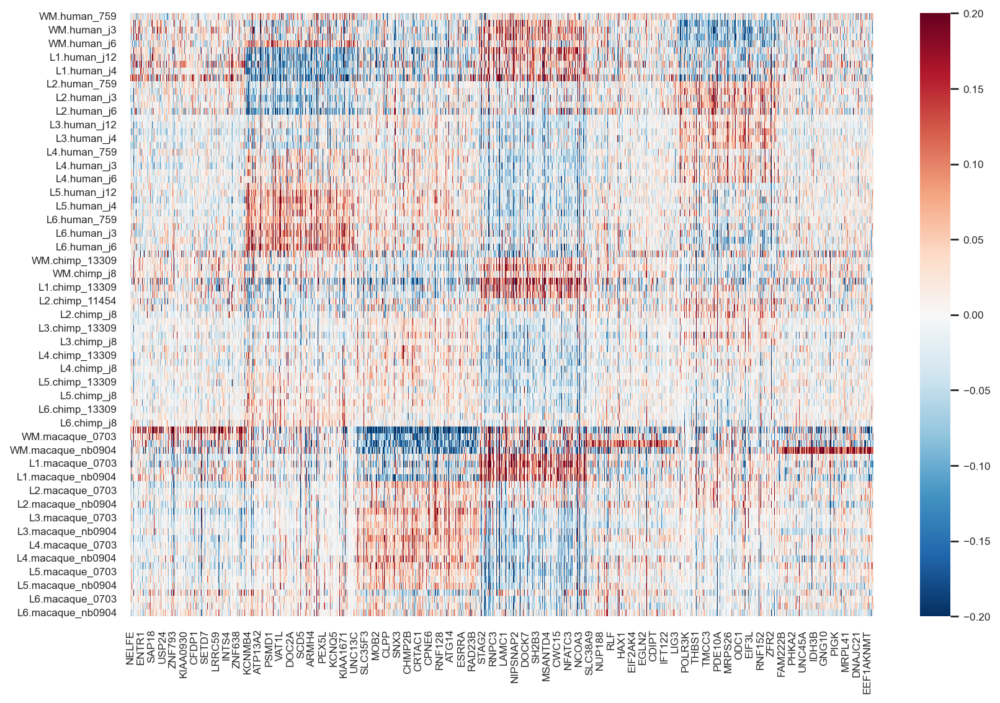

In [41]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.2, vmin=-0.2, center=0)
#plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

### Визуализация профилей

In [42]:
df_annotation = df[hum_spec_onehot.columns].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [43]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

HES4      AGRN      SDF4   B3GALT6    SCNN1D     PUSL1  \
condition layer                                                               
chimp     L1     0.013183 -0.119416  0.001954 -0.000567  0.000000 -0.035194   
          L2     0.001391 -0.099317 -0.007396 -0.000567  0.000000  0.015051   
          L3    -0.002804  0.012200  0.009598  0.001787 -0.000239  0.007281   
          L4    -0.003007  0.064229  0.004056 -0.001355 -0.000239 -0.000062   
          L5    -0.002850  0.047764 -0.004091  0.001175 -0.000239 -0.003973   

                   INTS11  AURKAIP1    MRPL20   ANKRD65  ...   CFAP410  \
condition layer                                          ...             
chimp     L1    -0.071463 -0.025760  0.000533  0.000000  ... -0.001887   
          L2     0.009732 -0.051677 -0.016354  0.000000  ...  0.005421   
          L3     0.030022  0.003874 -0.025064 -0.000239  ...  0.004798   
          L4     0.001210  0.014035 -0.035087 -0.000239  ...  0.017549   
          L5     0.020996  0.018701  0.006578 -0.000239  ... -0.002229   

                    TRPM2    UBE2G2   PTTG1IP   FAM207A    ADARB1    POFUT2  \
condition layer                                                               
chimp     L1    -0.001237  0.098782  0.324901  0.018740  0.001728  0.005772   
          L2    -0.001237  0.008055 -0.016619 -0.005634  0.000949 -0.003579   
          L3    -0.000599 -0.027983 -0.114869  0.005107  0.008570 -0.001690   
          L4    -0.000215 -0.020155 -0.113998 -0.009741 -0.010759  0.003162   
          L5    -0.001793 -0.033910 -0.114211  0.002289  0.007121 -0.002678   

                  COL18A1      YBEY     PRMT2  
condition layer                                
chimp     L1     0.489926 -0.005298 -0.043757  
          L2    -0.024116  0.007126  0.033880  
          L3    -0.056691 -0.006873 -0.089820  
          L4    -0.076944 -0.015197 -0.016910  
          L5    -0.056872  0.017860  0.003056  

[5 rows x 6194 columns]

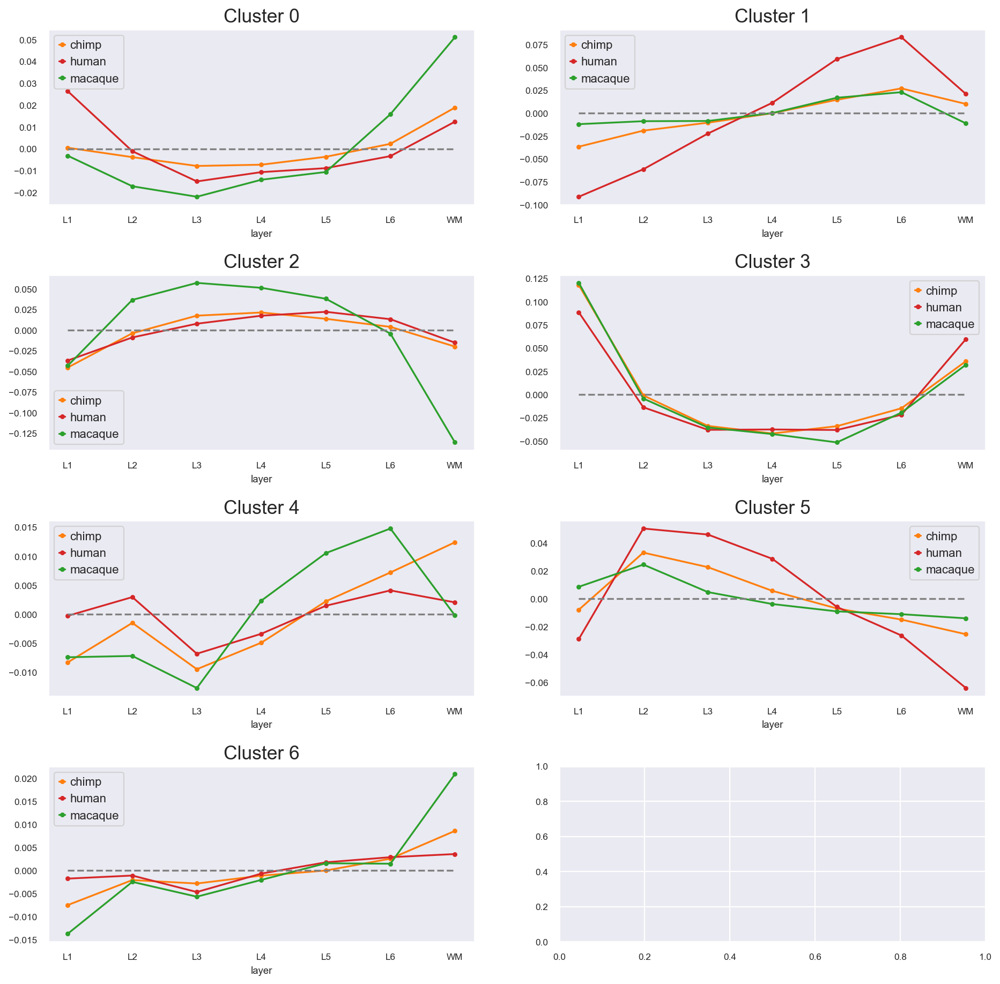

In [44]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 4 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(hs_labels.unique(), axes.flatten()):
    genes = hs_labels
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Intersection with ANOVA clusters

In [105]:
n_clusters = 7
anova_labels = pd.read_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv', index_col=0)['0'].sort_values()
anova_labels = anova_labels + 1
anova_labels.name = 'ANOVA_labels'

In [106]:
anova_labels.value_counts().sort_index()

ANOVA_labels
1    443
2    408
3    457
4    419
5    383
6    368
7    358
Name: count, dtype: int64

In [107]:
anova_dummies = anova_labels.astype(str).str.get_dummies()
anova_dummies.columns = 'ANOVA_' + anova_dummies.columns
anova_dummies.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7
PRMT2,1,0,0,0,0,0,0
CELF4,1,0,0,0,0,0,0
MRPL40,1,0,0,0,0,0,0
CDH2,1,0,0,0,0,0,0
BRINP2,1,0,0,0,0,0,0


In [108]:
hs_dummies = hs_labels.astype(str).str.get_dummies()
hs_dummies.columns = 'HS' + hs_dummies.columns
hs_dummies.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6
CDK4,1,0,0,0,0,0,0
ANP32B,1,0,0,0,0,0,0
FBXL5,1,0,0,0,0,0,0
ASCC3,1,0,0,0,0,0,0
GPN1,1,0,0,0,0,0,0


In [109]:
dummie_concat = pd.concat([anova_dummies, hs_dummies], axis=1).fillna(0)
dummie_concat.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7,HS0,HS1,HS2,HS3,HS4,HS5,HS6
PRMT2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
CELF4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
MRPL40,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
CDH2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
BRINP2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


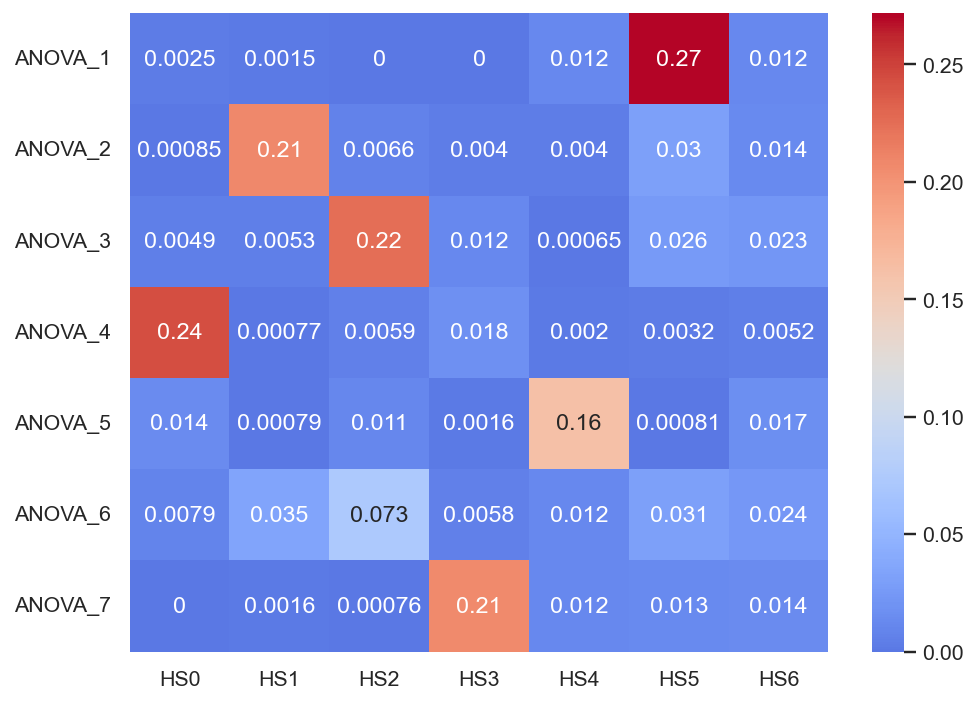

In [110]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(8, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[anova_dummies.columns, hs_dummies.columns], annot=True, cmap = 'coolwarm', center=0.12)
plt.grid(False)

In [111]:
gene_inter = hs_labels.index.intersection(anova_labels.index)
table_to_pivot = pd.concat([anova_labels.loc[gene_inter], hs_labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['ANOVA', 'HS']
pivot_labels_inter = table_to_pivot.groupby('ANOVA').value_counts().unstack().fillna(0)
pivot_labels_inter

HS,0,1,2,3,4,5,6
ANOVA,,,,,,,
1,3.0,2.0,0.0,0.0,18.0,277.0,17.0
2,1.0,222.0,9.0,5.0,6.0,37.0,18.0
3,6.0,7.0,259.0,16.0,1.0,33.0,31.0
4,234.0,1.0,8.0,22.0,3.0,4.0,7.0
5,16.0,1.0,15.0,2.0,206.0,1.0,22.0
6,9.0,42.0,90.0,7.0,17.0,37.0,30.0
7,0.0,2.0,1.0,208.0,17.0,16.0,18.0


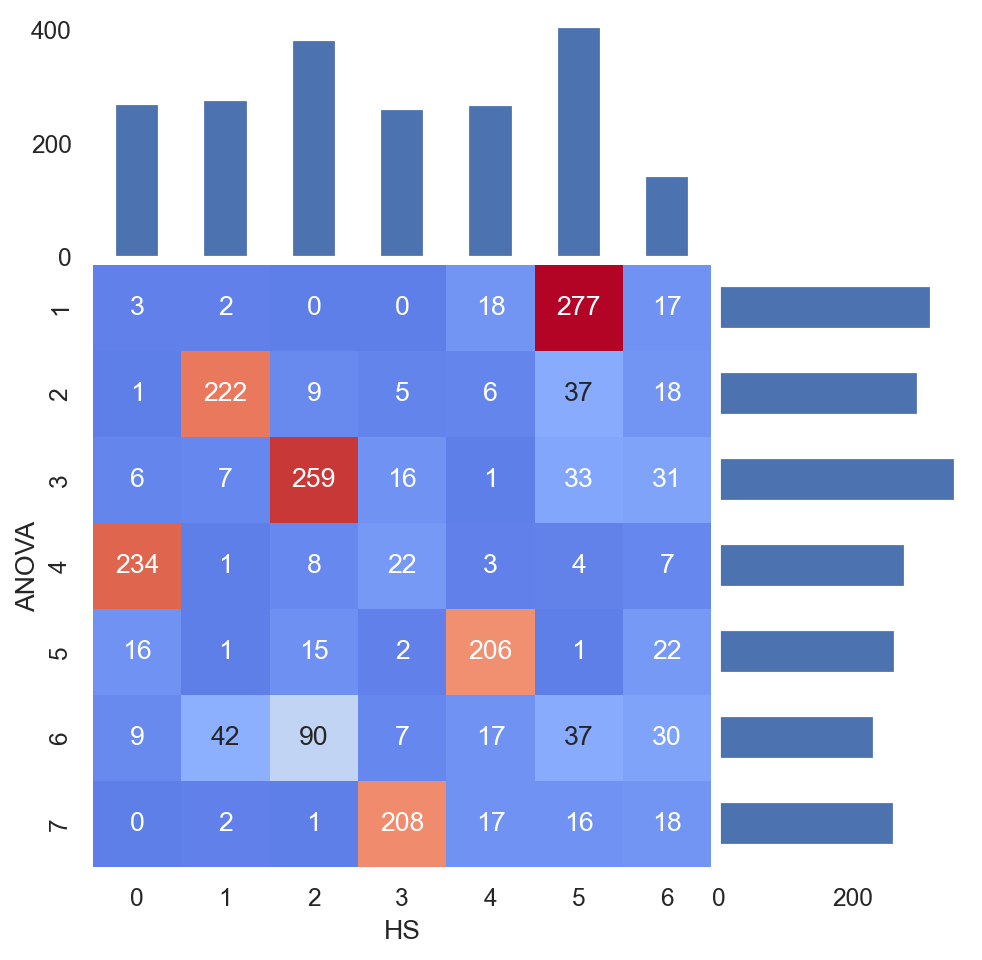

In [112]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter, annot=True, cmap = 'coolwarm', center=120, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum().plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.index[::-1]
pivot_labels_inter.T.sum().loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

## Intersection of ANOVA significant genes and genes with human-specific layer

In [113]:
hum_spec_anova_inter = hum_spec_onehot.columns.intersection(anova_genes)
hum_spec_anova_inter

Index(['AGRN', 'ANKRD65', 'TMEM240', 'NADK', 'GABRD', 'TP73', 'CHD5', 'GPR153',
       'PLEKHG5', 'CAMTA1',
       ...
       'DSCAM', 'BACE2', 'RSPH1', 'NDUFV3', 'RRP1', 'PFKL', 'COL18A1',
       'COL6A2', 'S100B', 'PRMT2'],
      dtype='object', length=2004)

### Visualization for layer freq

In [114]:
hum_spec_anova_onehot = hum_spec_onehot[hum_spec_anova_inter]

Text(0.5, 1.0, 'Number of human-specific genes for each layer')

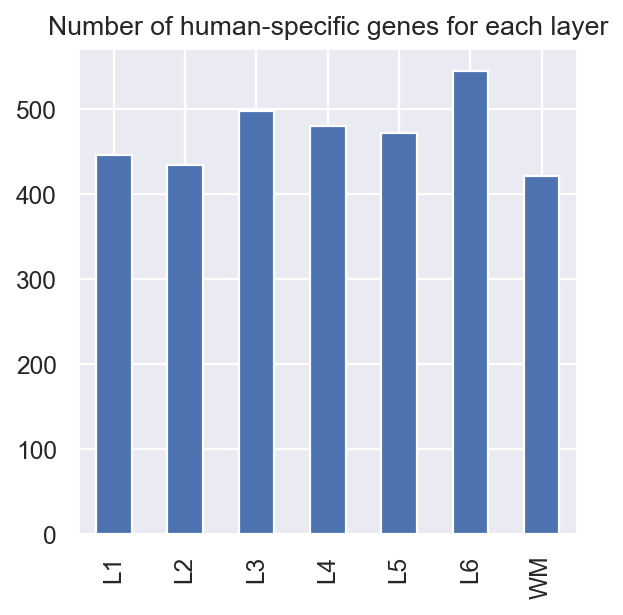

In [115]:
hum_spec_anova_onehot.sum(axis=1).plot.bar()
plt.title('Number of human-specific genes for each layer')

In [116]:
from itertools import combinations
count_df = pd.DataFrame(columns=hum_spec_anova_onehot.index, index=hum_spec_anova_onehot.index)
for lay1, lay2 in combinations(layers, 2):
    count_num = (hum_spec_anova_onehot.loc[lay1] * hum_spec_anova_onehot.loc[lay2]).sum()
    count_df.loc[[lay1, lay2], [lay1, lay2]] = count_num
    count_df.loc[lay1, lay1] = hum_spec_anova_onehot.loc[lay1].sum()
    count_df.loc[lay2, lay2] = hum_spec_anova_onehot.loc[lay2].sum()
count_df = count_df.astype(int)
count_df

,L1,L2,L3,L4,L5,L6,WM
L1,446,66,68,72,92,92,68
L2,66,435,76,80,86,96,72
L3,68,76,498,91,86,113,98
L4,72,80,91,480,85,88,84
L5,92,86,86,85,472,114,76
L6,92,96,113,88,114,545,82
WM,68,72,98,84,76,82,421


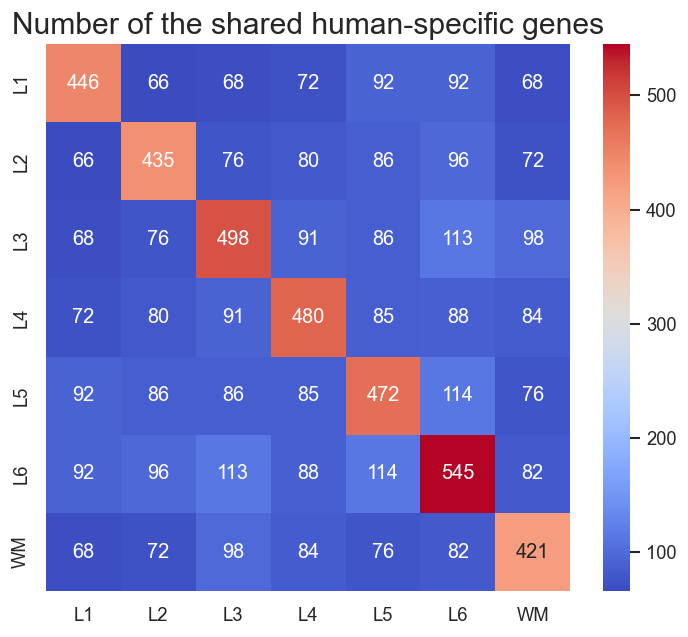

In [117]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(count_df, annot=True, cmap = 'coolwarm', fmt=".0f")
plt.title('Number of the shared human-specific genes', fontsize=18)
plt.grid(False)

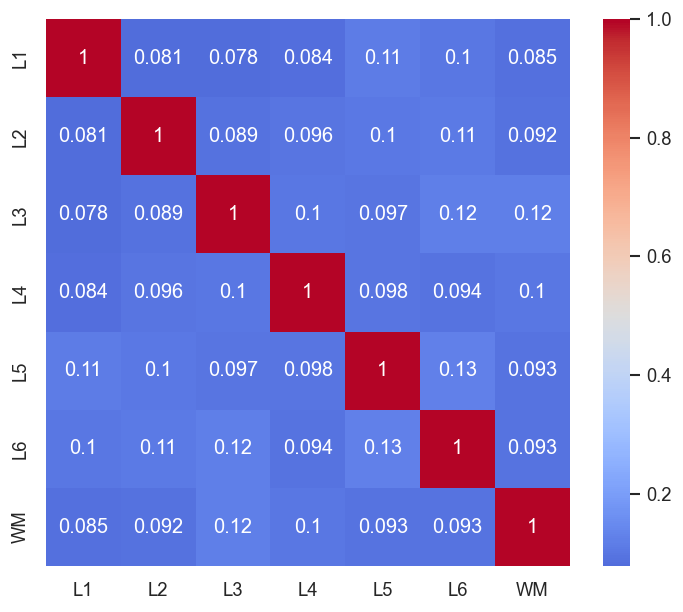

In [118]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(hum_spec_anova_onehot), columns=hum_spec_anova_onehot.index, index=hum_spec_anova_onehot.index)
pairwise_jaccard

plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(pairwise_jaccard, annot=True, cmap = 'coolwarm', center=0.5)
plt.grid(False)

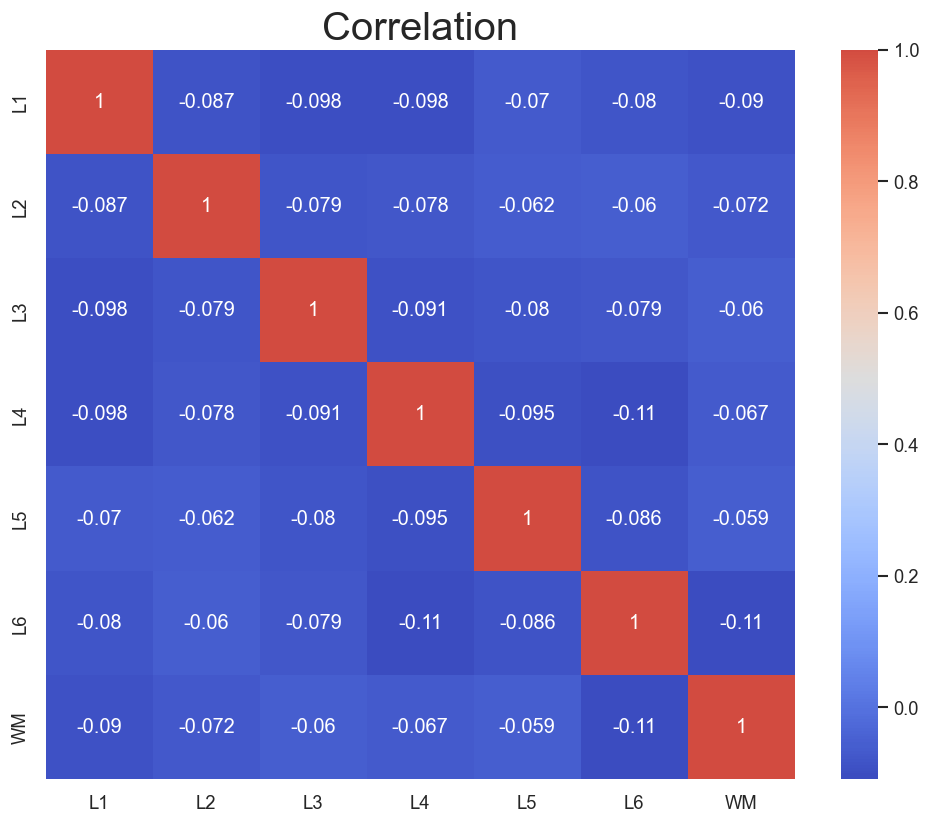

In [119]:
plt.figure(figsize=(10, 8), dpi=60)
sns.heatmap(hum_spec_onehot.T.corr(), annot=True, cmap = 'coolwarm', center=0.5, fmt='.2g')
plt.title('Correlation', fontsize=24)
plt.grid(False)

### ANOVA clusters visualization

In [51]:
pivot_labels = anova_labels.loc[hum_spec_anova_inter].to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='ANOVA_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
ANOVA_labels,,,,,,,
1,202,84,28,2,0,0,1
2,143,97,39,14,4,1,0
3,182,114,37,17,2,0,1
4,164,73,32,8,1,1,0
5,134,92,31,5,0,0,1
6,134,74,19,5,0,0,0
7,126,98,34,4,0,0,0


In [52]:
pivot_labels_fraction = pivot_labels / anova_labels.value_counts().sort_index().values.reshape(7, 1)

(0.0, 1.0)

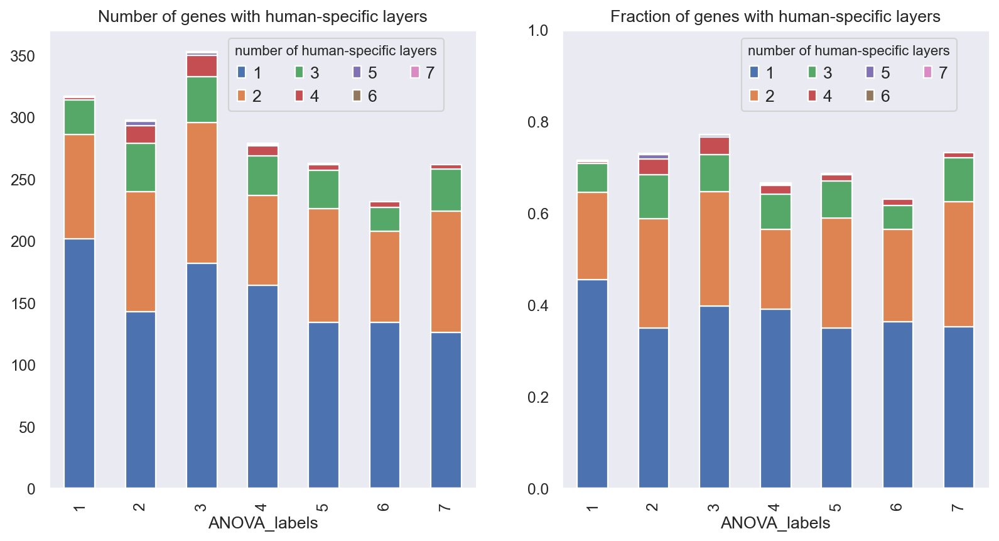

In [53]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[0], stacked=True)
ax[0].set_title('Number of genes with human-specific layers')
ax[0].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[0].grid(False)

pivot_labels_fraction.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Fraction of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)
ax[1].set_ylim(0, 1)

In [54]:
onehot_unstack = hum_spec_anova_onehot.unstack()
onehot_unstack.name = 'hum-spec & ANOVA'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['ANOVA cluster'] = anova_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ANOVA'] == 1].groupby(['ANOVA cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ANOVA']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
ANOVA cluster,,,,,,,
1,64,72,79,82,54,72,46
2,55,63,100,57,88,85,88
3,126,61,70,92,96,106,55
4,40,67,65,76,74,71,56
5,62,65,54,67,63,74,53
6,45,45,58,55,41,73,42
7,54,62,72,51,56,64,81


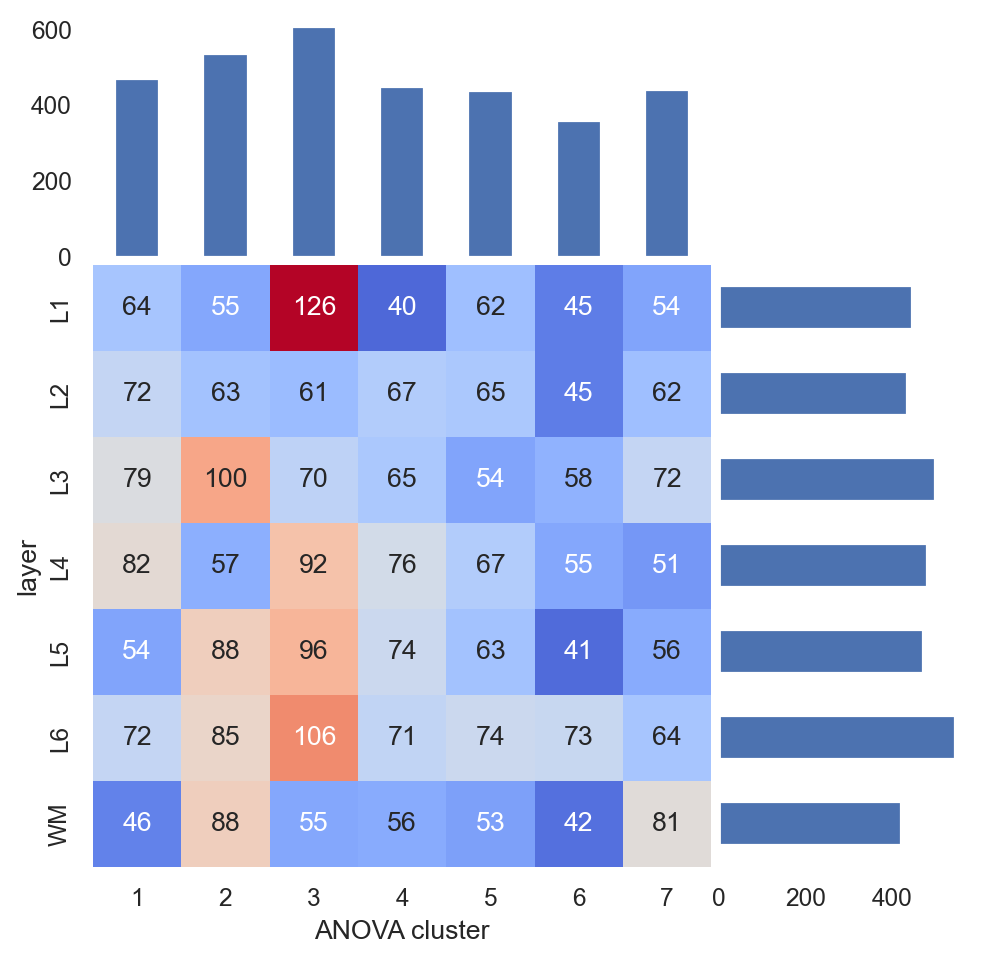

In [55]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=80, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

In [56]:
hum_spec_anova_onehot.sum(axis=1)

L1    446
L2    435
L3    498
L4    480
L5    472
L6    545
WM    421
dtype: int64

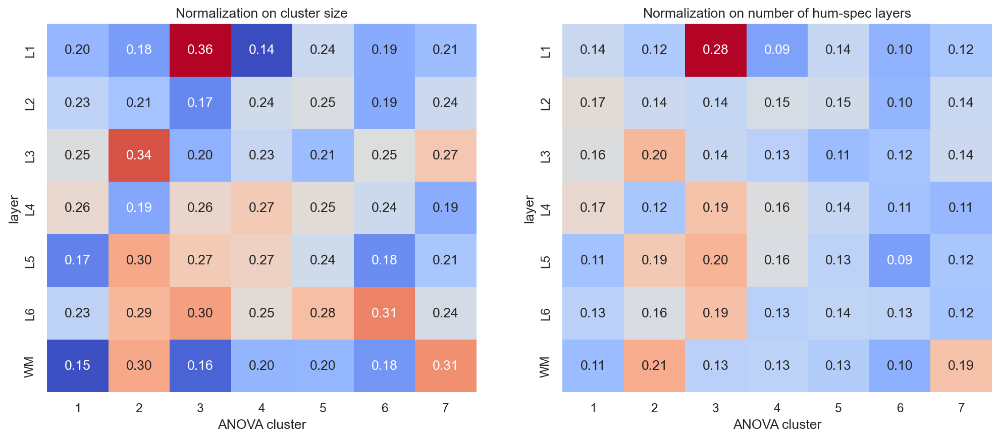

In [57]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size')

frac = layer_count.T / hum_spec_anova_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers')
plt.show()

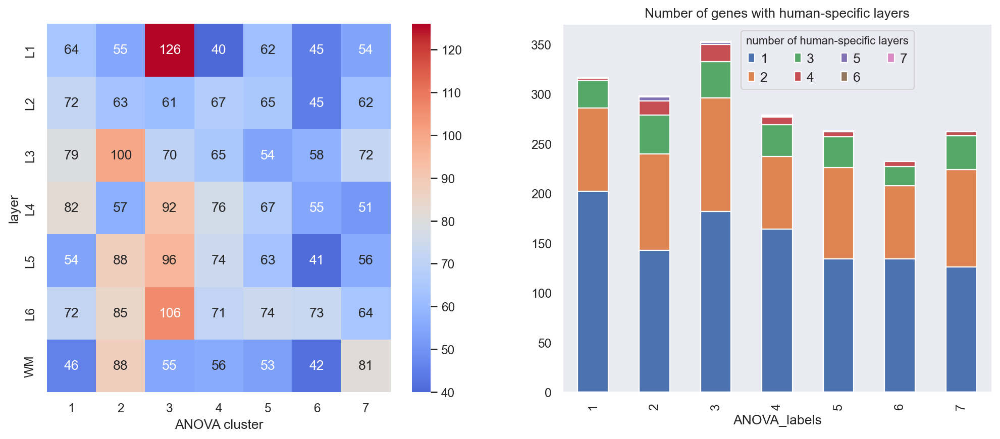

In [58]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=80, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [59]:
df_annotation = df[hum_spec_anova_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [60]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AGRN   ANKRD65   TMEM240      NADK     GABRD      TP73  \
condition layer                                                               
chimp     L1    -1.101722  0.000000 -1.858119  1.106832 -0.499093  2.032473   
          L2    -1.132527  0.000000 -0.140870 -1.020345 -0.836275 -0.622895   
          L3    -0.105615 -0.111803 -0.063043  0.254596  0.962491 -0.356624   
          L4     0.756912 -0.111803  0.526336 -0.128780  0.408388 -0.062404   
          L5     0.540320 -0.111803  0.404393 -0.061237 -0.165721 -0.118768   

                     CHD5    GPR153   PLEKHG5    CAMTA1  ...     DSCAM  \
condition layer                                          ...             
chimp     L1    -1.478046  1.388855 -0.667490 -0.597787  ... -1.434593   
          L2     0.448384  0.616995  0.239202 -0.490010  ... -0.392086   
          L3     0.505970  0.664780 -0.303065 -0.768648  ... -0.741910   
          L4     0.314730 -0.174142 -0.188922 -0.053649  ... -0.069347   
          L5     0.273499 -0.903416  0.494671  1.129864  ...  0.657609   

                    BACE2     RSPH1    NDUFV3      RRP1      PFKL   COL18A1  \
condition layer                                                               
chimp     L1     0.226531 -1.375371 -0.401580 -0.216324  0.719720  2.222227   
          L2    -1.081238  0.804240  0.416086  0.538423  0.215785 -0.142445   
          L3    -0.345270  0.710071 -0.698233 -0.288482 -0.170436 -0.192256   
          L4    -0.659923  0.783182 -0.449077  0.305487 -0.167374 -0.685670   
          L5    -0.034555 -0.470535  0.150024 -0.337838 -0.358772 -0.001051   

                   COL6A2     S100B     PRMT2  
condition layer                                
chimp     L1    -0.125988  1.888258 -0.855905  
          L2    -0.125988 -0.322056  0.744803  
          L3    -0.206295 -0.530394 -1.139188  
          L4    -0.206295 -0.601899 -0.362514  
          L5    -0.206295 -0.610796 -0.089211  

[5 rows x 2004 columns]

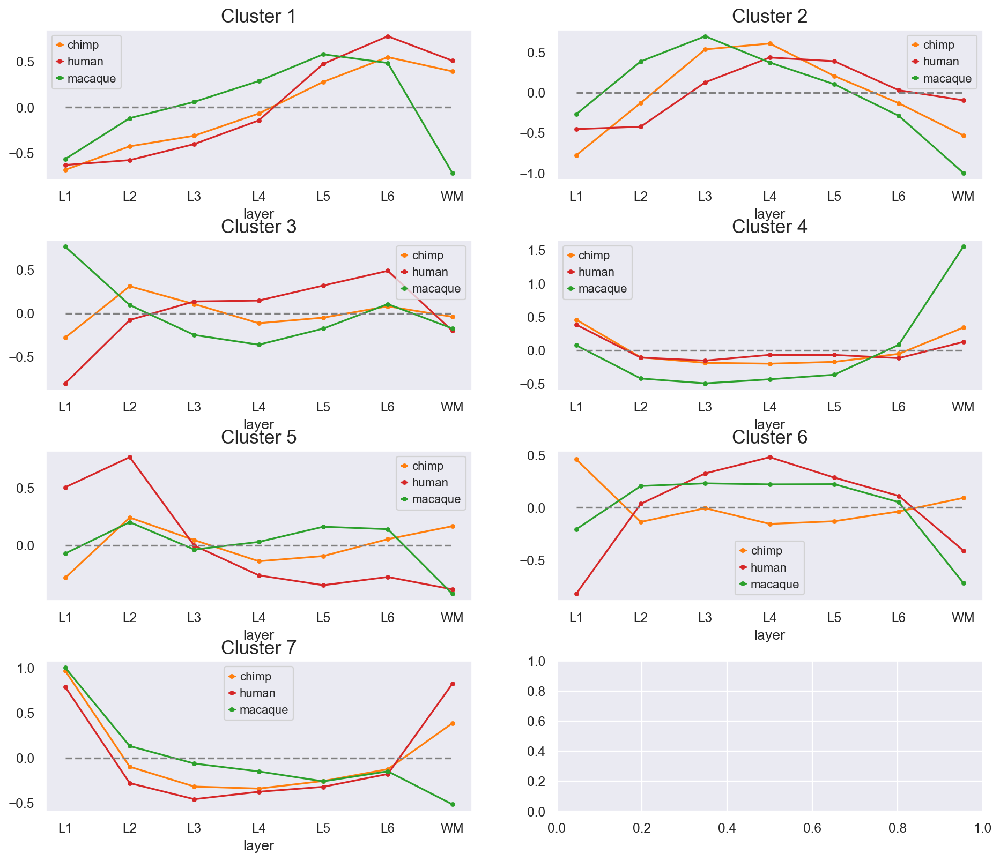

In [61]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(anova_labels.unique(), axes.flatten()):
    genes = anova_labels.loc[hum_spec_anova_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Human-specific clusters visualization

In [62]:
hs_labels.name = 'HS_labels'
pivot_labels = hs_labels.loc[hum_spec_anova_inter].to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
HS_labels,,,,,,,
0,157,71,30,9,1,1,0
1,134,97,33,10,2,1,0
2,189,128,43,20,1,0,1
3,130,93,33,4,0,0,0
4,139,92,29,7,0,0,1
5,255,108,37,3,1,0,1
6,81,43,15,2,2,0,0


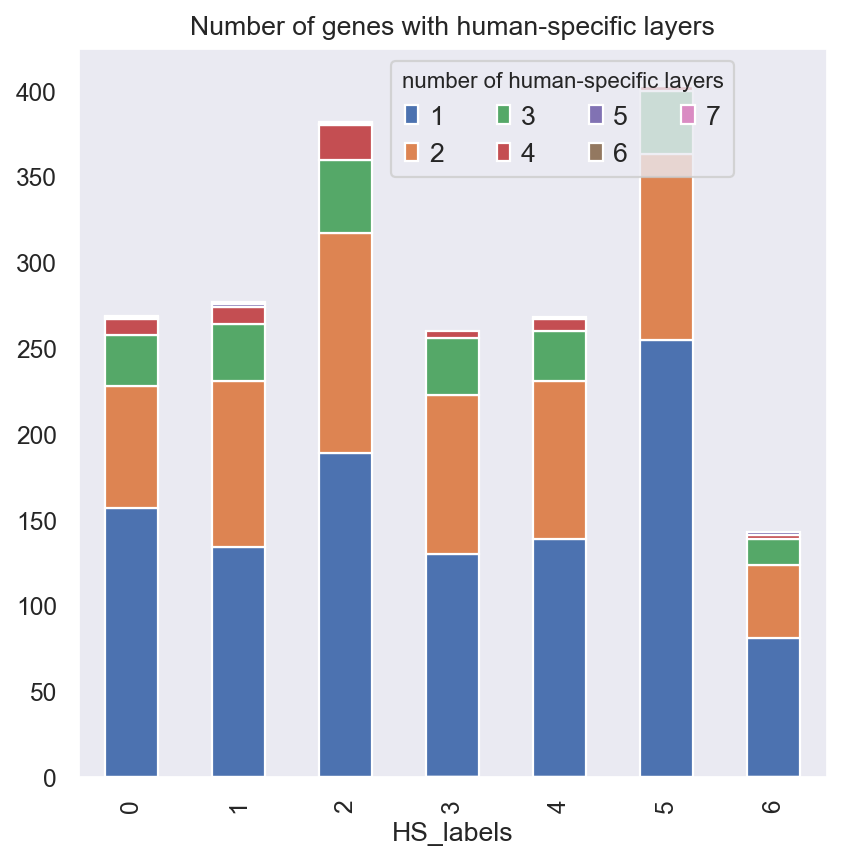

In [63]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [64]:
onehot_unstack = hum_spec_anova_onehot.unstack()
onehot_unstack.name = 'hum-spec & ANOVA'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS cluster'] = hs_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ANOVA'] == 1].groupby(['HS cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ANOVA']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS cluster,,,,,,,
0,36,70,67,64,64,68,67
1,50,60,80,61,81,78,73
2,142,61,93,104,106,99,61
3,50,60,65,55,54,73,74
4,68,58,63,64,70,75,47
5,70,94,103,98,69,106,66
6,30,32,27,34,28,46,33


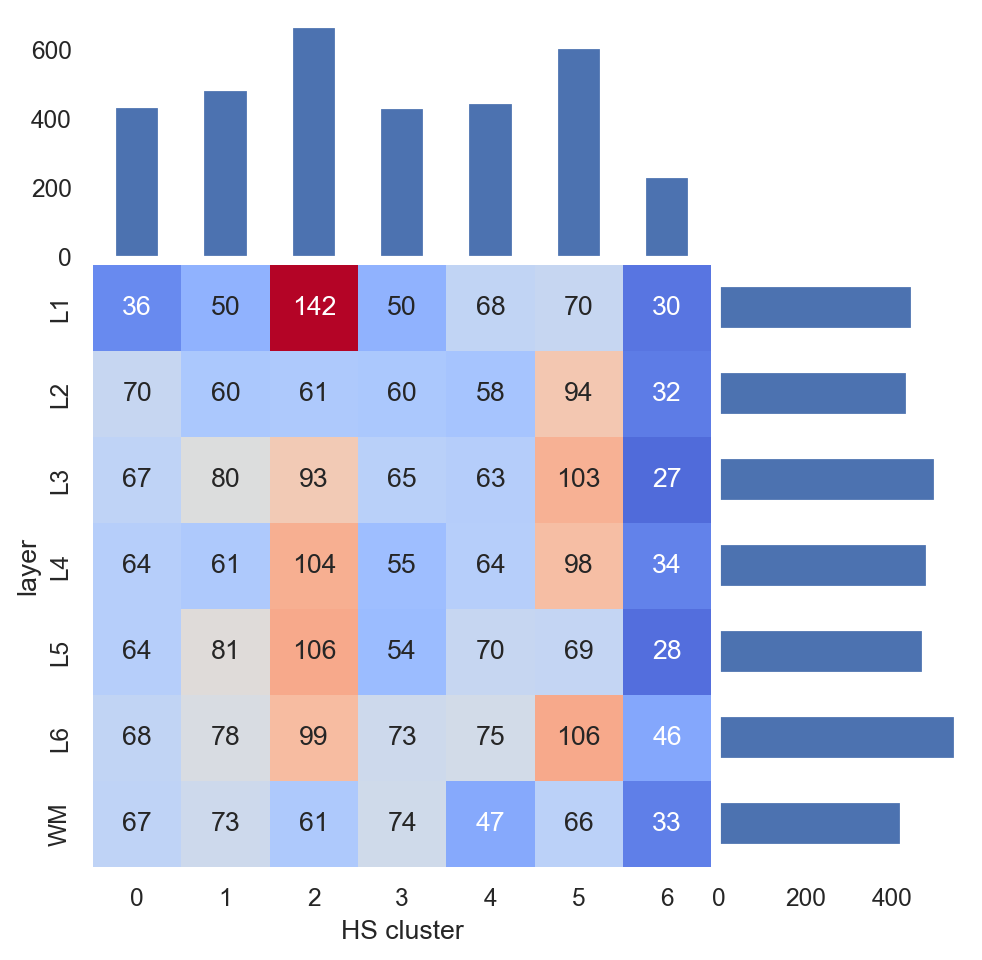

In [65]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=80, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

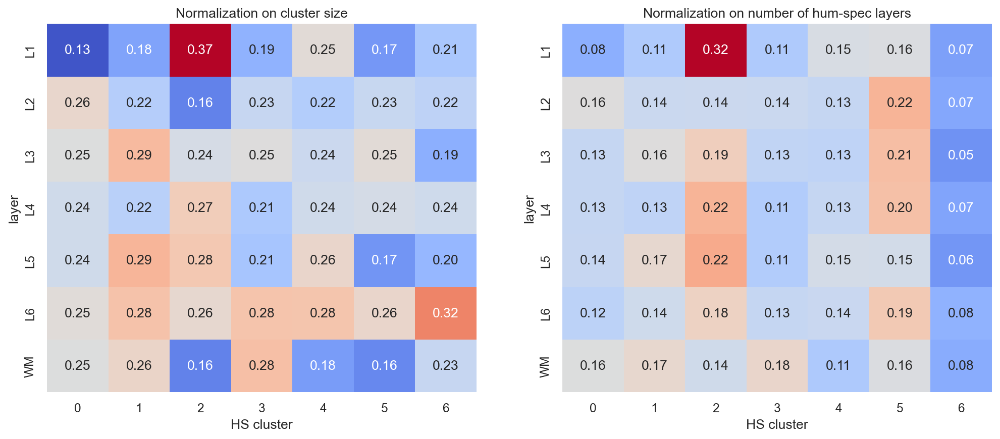

In [66]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size')

frac = layer_count.T / hum_spec_anova_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers')
plt.show()

<Axes: xlabel='HS_labels'>

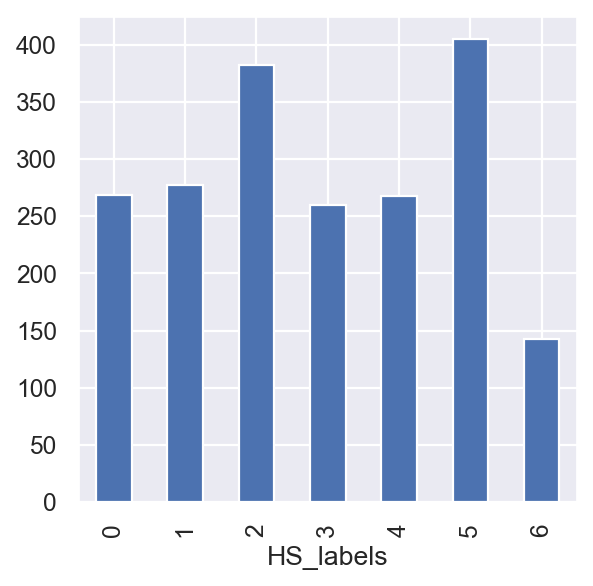

In [67]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

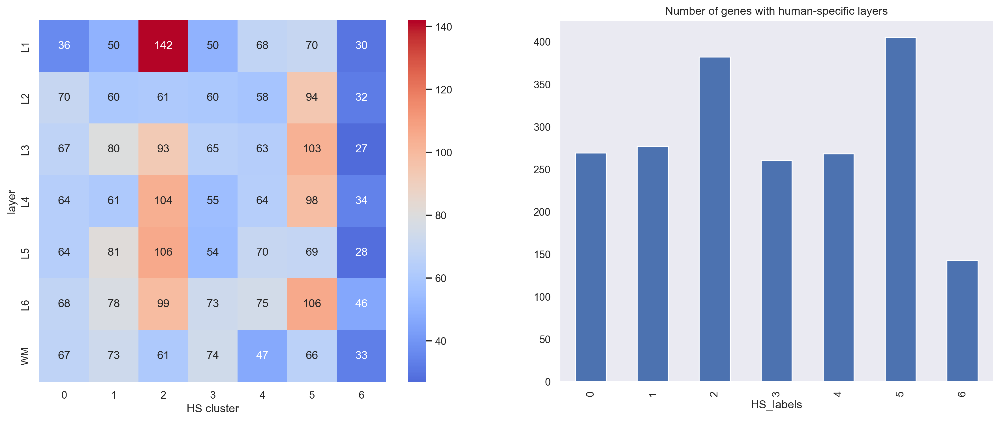

In [68]:
fig, ax = plt.subplots(1, 2, figsize=(18, 7), dpi=120)
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=80, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.sum(axis=1).plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
#ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [69]:
df_annotation = df[hum_spec_anova_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [70]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AGRN   ANKRD65   TMEM240      NADK     GABRD      TP73  \
condition layer                                                               
chimp     L1    -1.101722  0.000000 -1.858119  1.106832 -0.499093  2.032473   
          L2    -1.132527  0.000000 -0.140870 -1.020345 -0.836275 -0.622895   
          L3    -0.105615 -0.111803 -0.063043  0.254596  0.962491 -0.356624   
          L4     0.756912 -0.111803  0.526336 -0.128780  0.408388 -0.062404   
          L5     0.540320 -0.111803  0.404393 -0.061237 -0.165721 -0.118768   

                     CHD5    GPR153   PLEKHG5    CAMTA1  ...     DSCAM  \
condition layer                                          ...             
chimp     L1    -1.478046  1.388855 -0.667490 -0.597787  ... -1.434593   
          L2     0.448384  0.616995  0.239202 -0.490010  ... -0.392086   
          L3     0.505970  0.664780 -0.303065 -0.768648  ... -0.741910   
          L4     0.314730 -0.174142 -0.188922 -0.053649  ... -0.069347   
          L5     0.273499 -0.903416  0.494671  1.129864  ...  0.657609   

                    BACE2     RSPH1    NDUFV3      RRP1      PFKL   COL18A1  \
condition layer                                                               
chimp     L1     0.226531 -1.375371 -0.401580 -0.216324  0.719720  2.222227   
          L2    -1.081238  0.804240  0.416086  0.538423  0.215785 -0.142445   
          L3    -0.345270  0.710071 -0.698233 -0.288482 -0.170436 -0.192256   
          L4    -0.659923  0.783182 -0.449077  0.305487 -0.167374 -0.685670   
          L5    -0.034555 -0.470535  0.150024 -0.337838 -0.358772 -0.001051   

                   COL6A2     S100B     PRMT2  
condition layer                                
chimp     L1    -0.125988  1.888258 -0.855905  
          L2    -0.125988 -0.322056  0.744803  
          L3    -0.206295 -0.530394 -1.139188  
          L4    -0.206295 -0.601899 -0.362514  
          L5    -0.206295 -0.610796 -0.089211  

[5 rows x 2004 columns]

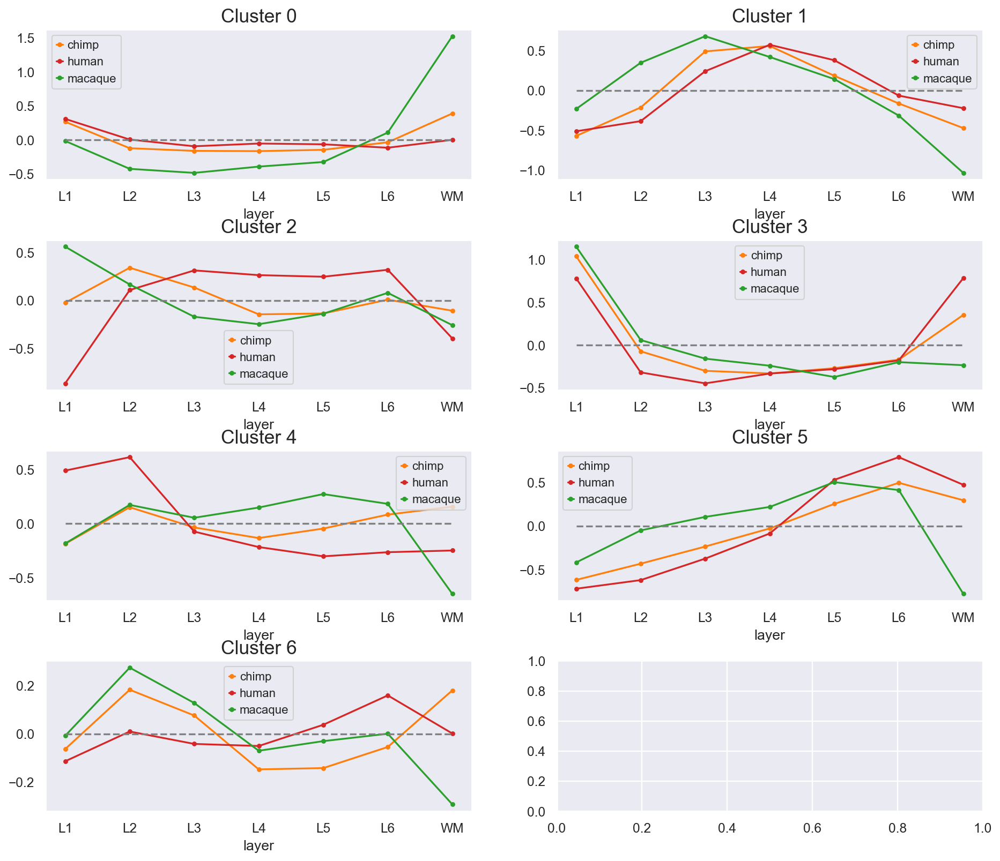

In [71]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(hs_labels.unique(), axes.flatten()):
    genes = hs_labels.loc[hum_spec_anova_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

## Clusterization of ANOVA sign and  hum-spec genes

### Hierarchial

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


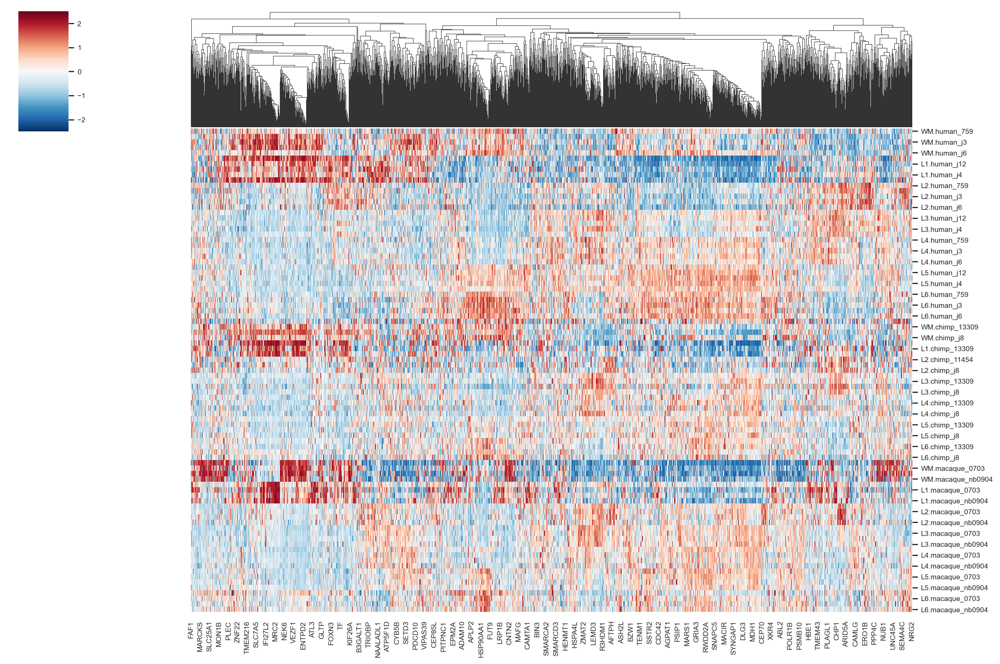

In [72]:
sns.set(font_scale=0.7)
sns.clustermap(df[hum_spec_anova_inter], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

### Spectral

In [73]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hum_spec_anova_inter].T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [74]:
labels = pd.Series(clustering.labels_, index=hum_spec_anova_inter).sort_values()
order = labels.sort_values().index
labels.to_csv('results/hs_anova_inter_clusters.csv')

<Axes: >

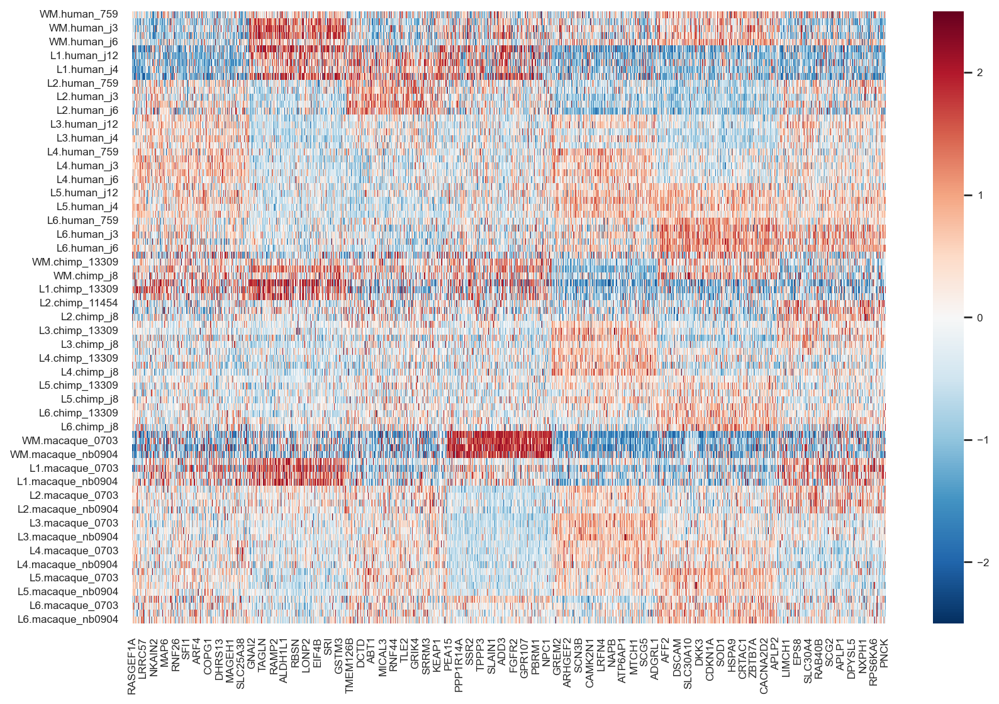

In [75]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
#plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

### Profiles

In [76]:
df_annotation = df[hum_spec_anova_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [77]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AGRN   ANKRD65   TMEM240      NADK     GABRD      TP73  \
condition layer                                                               
chimp     L1    -1.101722  0.000000 -1.858119  1.106832 -0.499093  2.032473   
          L2    -1.132527  0.000000 -0.140870 -1.020345 -0.836275 -0.622895   
          L3    -0.105615 -0.111803 -0.063043  0.254596  0.962491 -0.356624   
          L4     0.756912 -0.111803  0.526336 -0.128780  0.408388 -0.062404   
          L5     0.540320 -0.111803  0.404393 -0.061237 -0.165721 -0.118768   

                     CHD5    GPR153   PLEKHG5    CAMTA1  ...     DSCAM  \
condition layer                                          ...             
chimp     L1    -1.478046  1.388855 -0.667490 -0.597787  ... -1.434593   
          L2     0.448384  0.616995  0.239202 -0.490010  ... -0.392086   
          L3     0.505970  0.664780 -0.303065 -0.768648  ... -0.741910   
          L4     0.314730 -0.174142 -0.188922 -0.053649  ... -0.069347   
          L5     0.273499 -0.903416  0.494671  1.129864  ...  0.657609   

                    BACE2     RSPH1    NDUFV3      RRP1      PFKL   COL18A1  \
condition layer                                                               
chimp     L1     0.226531 -1.375371 -0.401580 -0.216324  0.719720  2.222227   
          L2    -1.081238  0.804240  0.416086  0.538423  0.215785 -0.142445   
          L3    -0.345270  0.710071 -0.698233 -0.288482 -0.170436 -0.192256   
          L4    -0.659923  0.783182 -0.449077  0.305487 -0.167374 -0.685670   
          L5    -0.034555 -0.470535  0.150024 -0.337838 -0.358772 -0.001051   

                   COL6A2     S100B     PRMT2  
condition layer                                
chimp     L1    -0.125988  1.888258 -0.855905  
          L2    -0.125988 -0.322056  0.744803  
          L3    -0.206295 -0.530394 -1.139188  
          L4    -0.206295 -0.601899 -0.362514  
          L5    -0.206295 -0.610796 -0.089211  

[5 rows x 2004 columns]

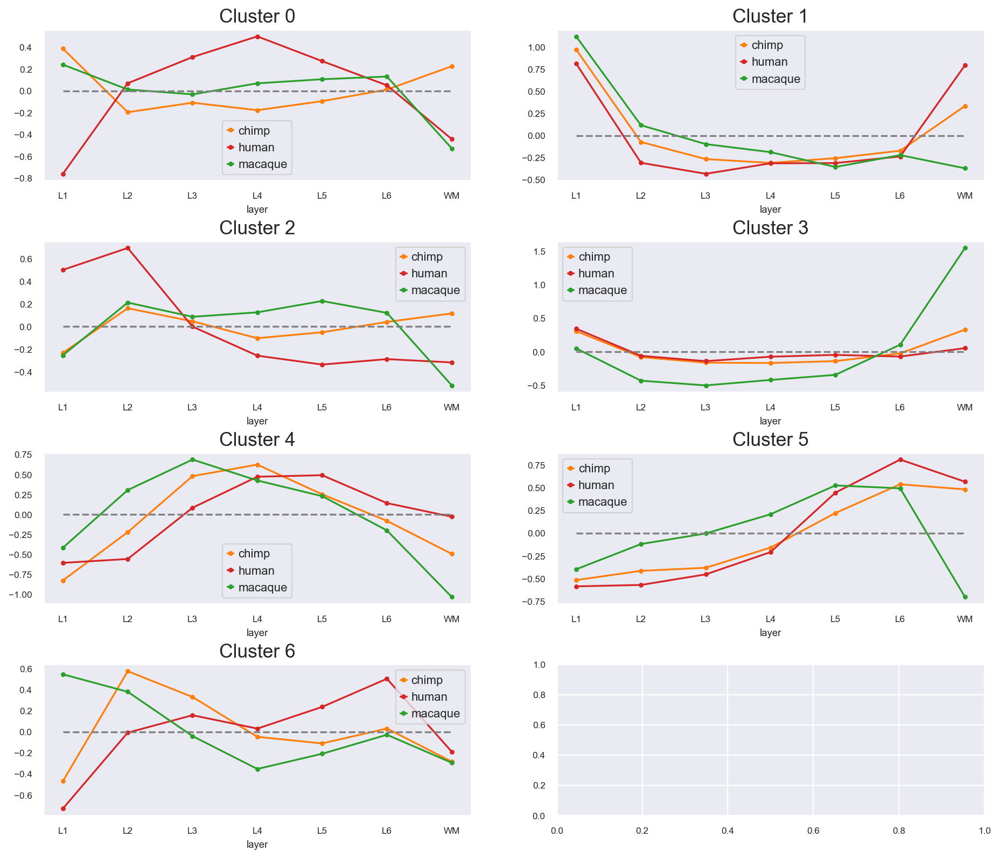

In [78]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels.loc[hum_spec_anova_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Describe clusters

In [79]:
labels.name = 'HS & ANOVA labels'
pivot_labels = labels.to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS & ANOVA labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
HS & ANOVA labels,,,,,,,
0,163,102,34,12,0,0,0
1,127,96,33,4,0,0,0
2,139,91,30,4,0,0,1
3,168,70,31,8,1,1,0
4,134,94,36,14,2,1,0
5,204,87,25,3,0,0,0
6,150,92,31,10,4,0,2


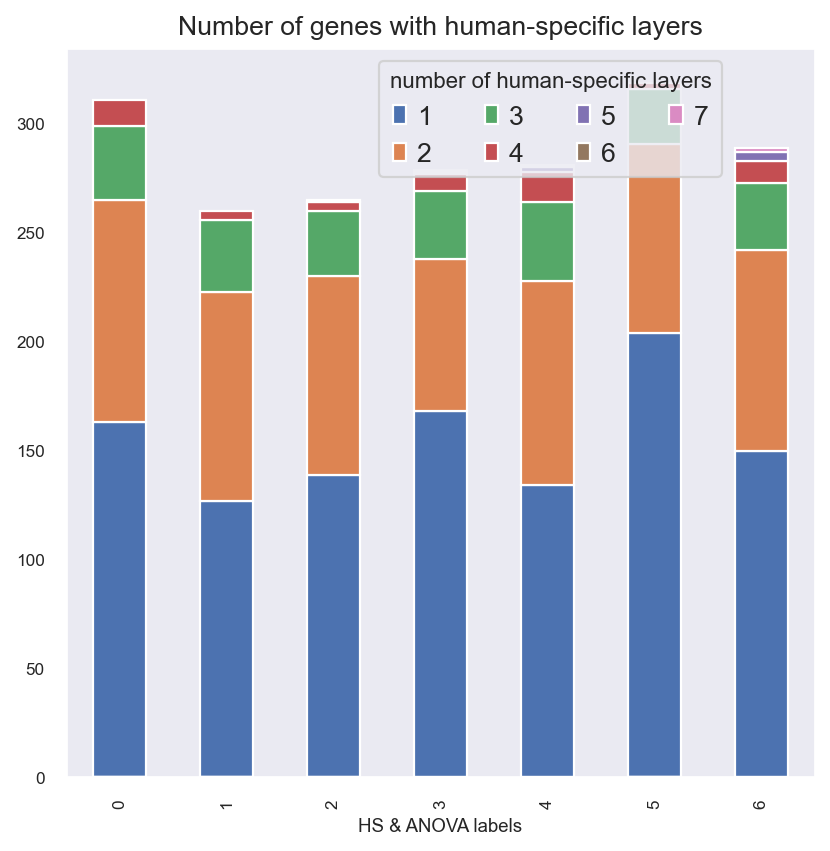

In [80]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [81]:
onehot_unstack = hum_spec_anova_onehot.unstack()
onehot_unstack.name = 'hum-spec & ANOVA'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS & ANOVA cluster'] = labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ANOVA'] == 1].groupby(['HS & ANOVA cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ANOVA']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS & ANOVA cluster,,,,,,,
0,106,55,75,82,67,83,49
1,51,60,69,56,52,66,80
2,67,56,64,60,67,68,52
3,39,68,68,73,68,68,60
4,50,68,93,55,79,75,82
5,61,70,73,81,52,85,43
6,72,58,56,73,87,100,55


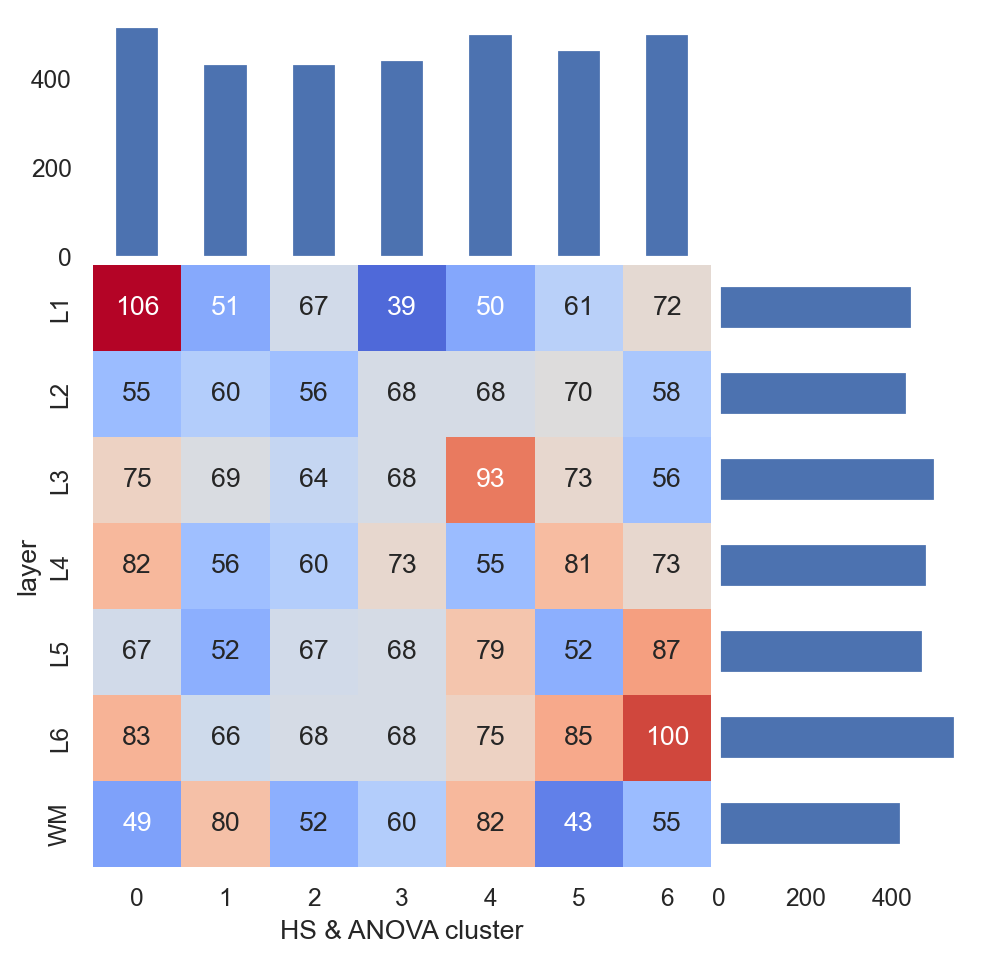

In [82]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=70, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

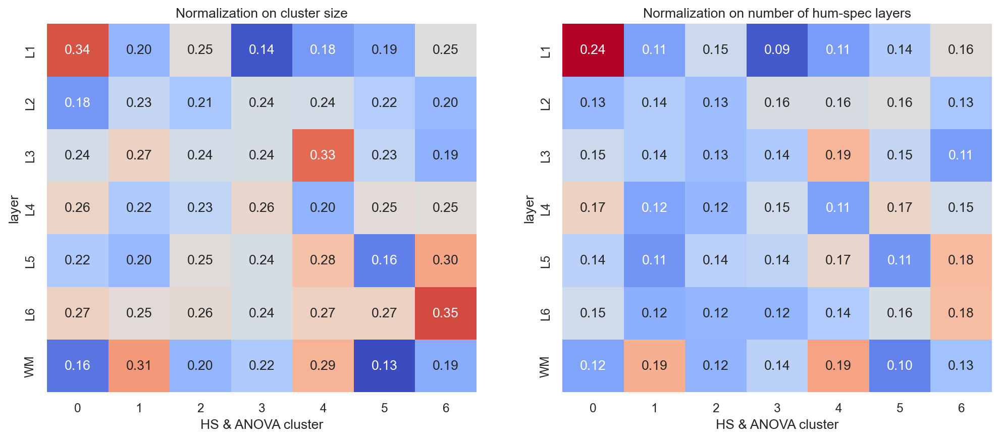

In [83]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=12)

frac = layer_count.T / hum_spec_anova_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=12)
plt.show()

<Axes: xlabel='HS & ANOVA labels'>

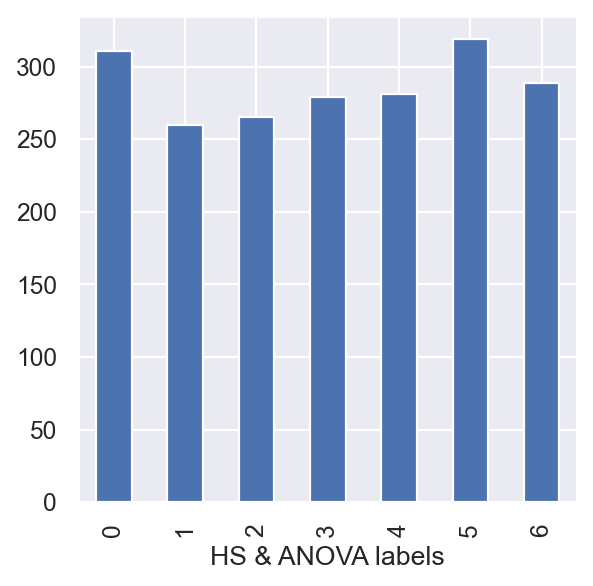

In [84]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

In [85]:
anova_dummies = anova_labels.astype(str).str.get_dummies()
anova_dummies.columns = 'ANOVA_' + anova_dummies.columns
anova_dummies.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7
PRMT2,1,0,0,0,0,0,0
CELF4,1,0,0,0,0,0,0
MRPL40,1,0,0,0,0,0,0
CDH2,1,0,0,0,0,0,0
BRINP2,1,0,0,0,0,0,0


In [86]:
hs_anova_dummies = labels.astype(str).str.get_dummies()
hs_anova_dummies.columns = 'HS & ANOVA' + hs_anova_dummies.columns
hs_anova_dummies.head()

,HS & ANOVA0,HS & ANOVA1,HS & ANOVA2,HS & ANOVA3,HS & ANOVA4,HS & ANOVA5,HS & ANOVA6
RASGEF1A,1,0,0,0,0,0,0
FBXL5,1,0,0,0,0,0,0
PSMB3,1,0,0,0,0,0,0
BDH1,1,0,0,0,0,0,0
KRT10,1,0,0,0,0,0,0


In [87]:
dummie_concat = pd.concat([anova_dummies, hs_anova_dummies], axis=1).fillna(0)
dummie_concat.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7,HS & ANOVA0,HS & ANOVA1,HS & ANOVA2,HS & ANOVA3,HS & ANOVA4,HS & ANOVA5,HS & ANOVA6
PRMT2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
CELF4,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
MRPL40,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
CDH2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
BRINP2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


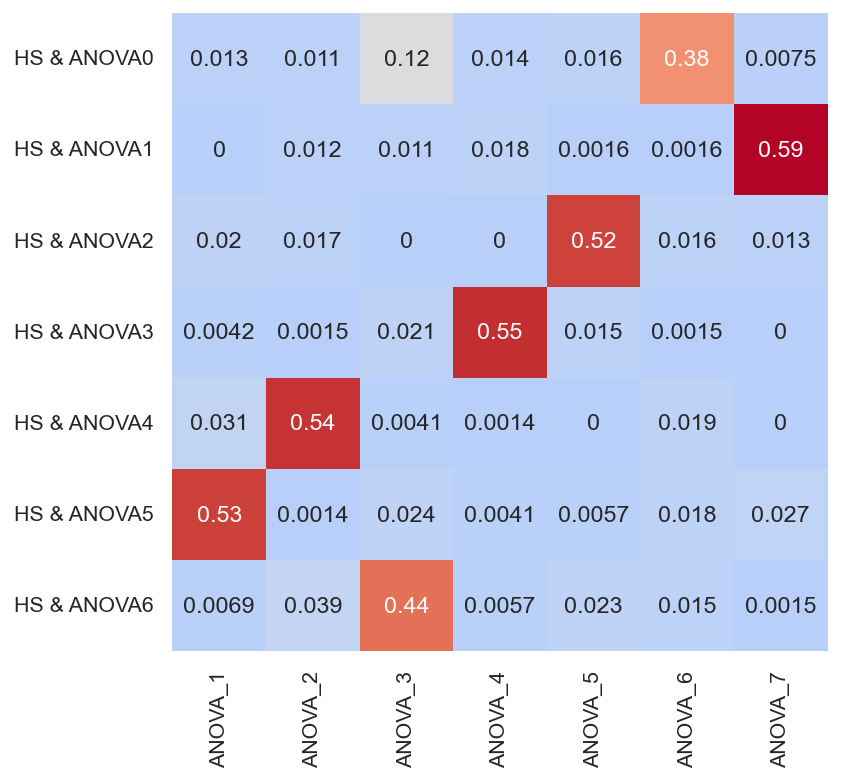

In [88]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_anova_dummies.columns, anova_dummies.columns], annot=True, cmap = 'coolwarm', center=0.12, cbar=False)
plt.grid(False)

In [89]:
gene_inter = labels.index.intersection(anova_labels.index)
table_to_pivot = pd.concat([anova_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['ANOVA', 'HS & ANOVA']
pivot_labels_inter = table_to_pivot.groupby('ANOVA').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ANOVA,0,1,2,3,4,5,6
ANOVA,,,,,,,
1,10.0,0.0,14.0,3.0,22.0,263.0,5.0
2,8.0,8.0,11.0,1.0,243.0,1.0,26.0
3,81.0,8.0,0.0,15.0,3.0,18.0,228.0
4,10.0,12.0,0.0,249.0,1.0,3.0,4.0
5,11.0,1.0,222.0,10.0,0.0,4.0,15.0
6,186.0,1.0,10.0,1.0,12.0,12.0,10.0
7,5.0,230.0,8.0,0.0,0.0,18.0,1.0


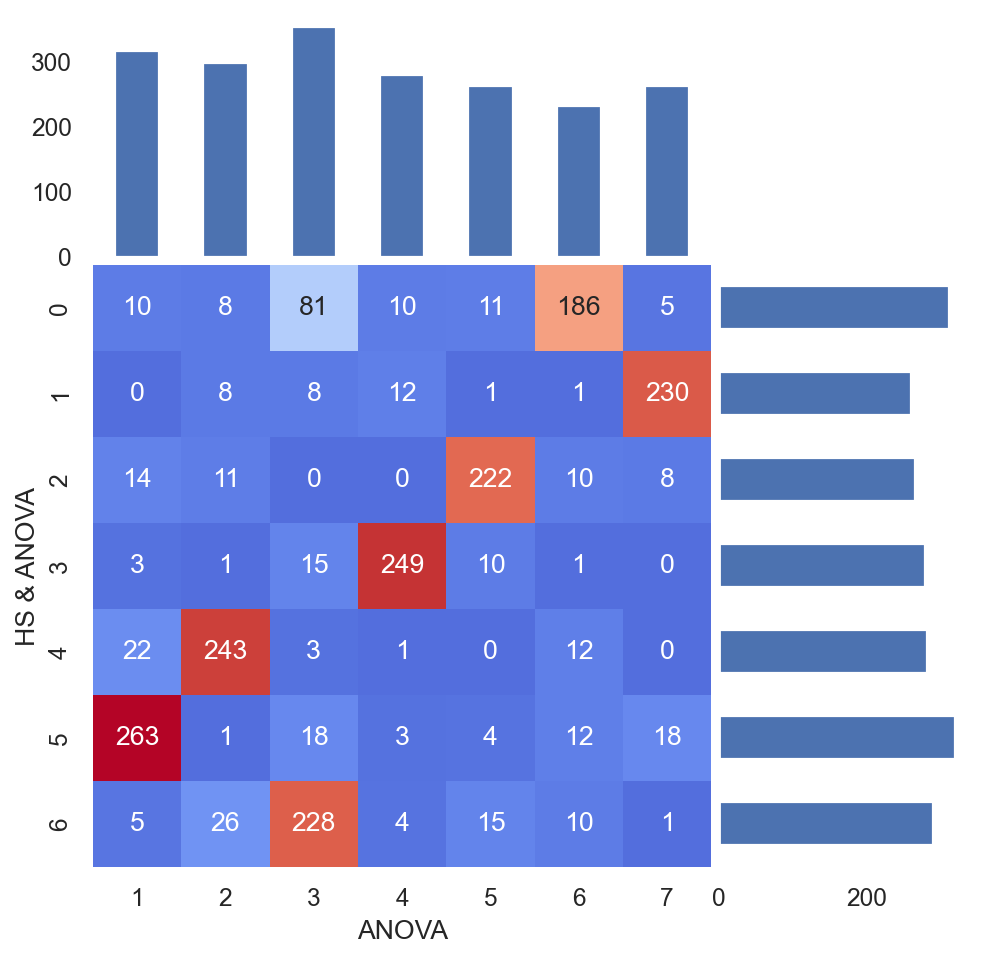

In [90]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=120, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

In [91]:
hs_dummies = hs_labels.astype(str).str.get_dummies()
hs_dummies.columns = 'HS' + hs_dummies.columns
hs_dummies.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6
CDK4,1,0,0,0,0,0,0
ANP32B,1,0,0,0,0,0,0
FBXL5,1,0,0,0,0,0,0
ASCC3,1,0,0,0,0,0,0
GPN1,1,0,0,0,0,0,0


In [92]:
hs_anova_dummies = labels.astype(str).str.get_dummies()
hs_anova_dummies.columns = 'HS & ANOVA' + hs_anova_dummies.columns
hs_anova_dummies.head()

,HS & ANOVA0,HS & ANOVA1,HS & ANOVA2,HS & ANOVA3,HS & ANOVA4,HS & ANOVA5,HS & ANOVA6
RASGEF1A,1,0,0,0,0,0,0
FBXL5,1,0,0,0,0,0,0
PSMB3,1,0,0,0,0,0,0
BDH1,1,0,0,0,0,0,0
KRT10,1,0,0,0,0,0,0


In [93]:
dummie_concat = pd.concat([hs_dummies, hs_anova_dummies], axis=1).fillna(0)
dummie_concat.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6,HS & ANOVA0,HS & ANOVA1,HS & ANOVA2,HS & ANOVA3,HS & ANOVA4,HS & ANOVA5,HS & ANOVA6
CDK4,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ANP32B,1,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
FBXL5,1,0,0,0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
ASCC3,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GPN1,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


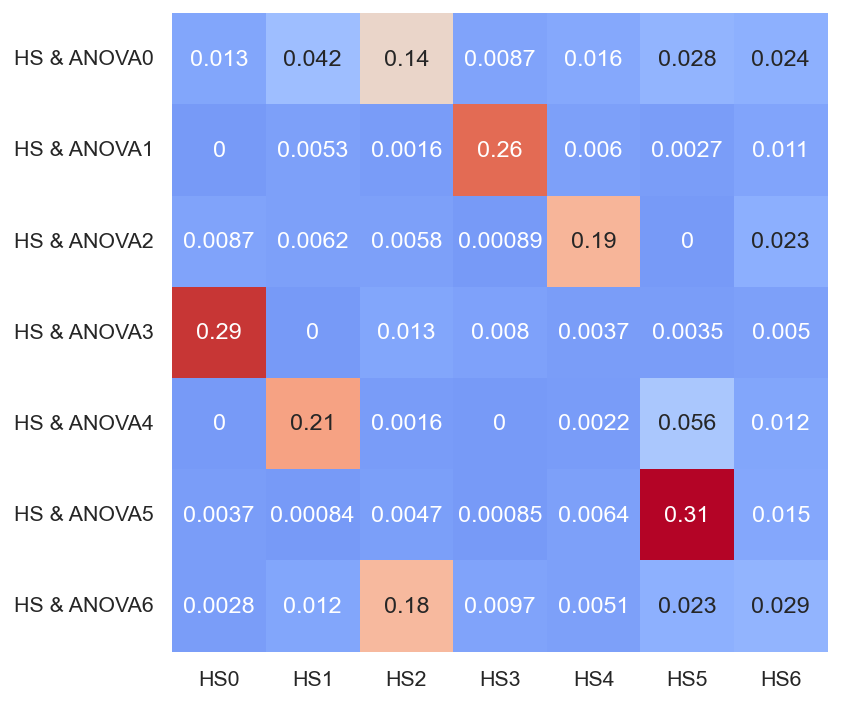

In [94]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_anova_dummies.columns, hs_dummies.columns], annot=True, cmap = 'coolwarm', center=0.12, cbar=False)
plt.grid(False)

In [95]:
gene_inter = labels.index.intersection(hs_labels.index)
table_to_pivot = pd.concat([hs_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['HS', 'HS & ANOVA']
pivot_labels_inter = table_to_pivot.groupby('HS').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ANOVA,0,1,2,3,4,5,6
HS,,,,,,,
0,14.0,0.0,9.0,239.0,0.0,4.0,3.0
1,48.0,6.0,7.0,0.0,201.0,1.0,14.0
2,156.0,2.0,7.0,16.0,2.0,6.0,193.0
3,10.0,228.0,1.0,9.0,0.0,1.0,11.0
4,22.0,8.0,214.0,5.0,3.0,9.0,7.0
5,32.0,3.0,0.0,4.0,60.0,280.0,26.0
6,29.0,13.0,27.0,6.0,15.0,18.0,35.0


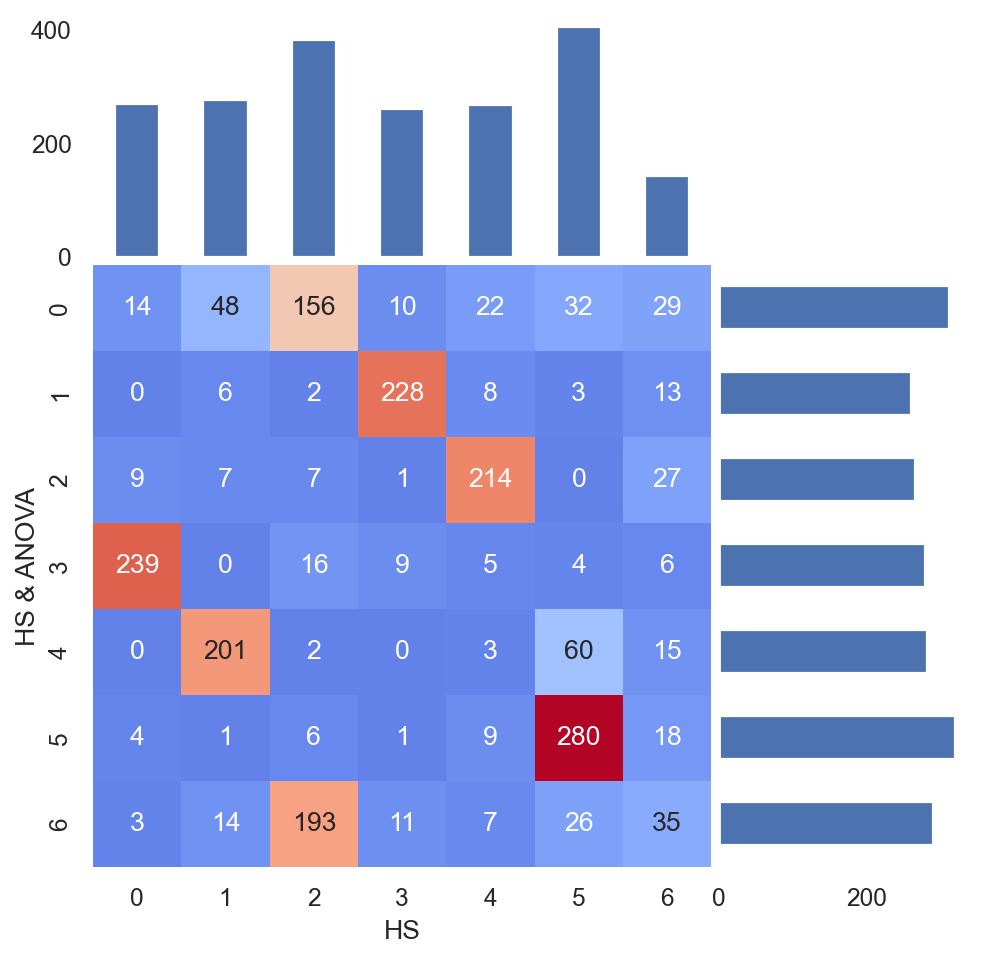

In [96]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=120, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

## Intersect with human-chimp significant

In [97]:
trs = [0.05, 0.1, 0.2]
hc_genes = {tr:ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'chimp') & (ttest_res.p_val_adj < tr)].gene.tolist() for tr in trs}

In [98]:
list(map(len, hc_genes.values()))

[426, 1082, 2797]

### P-value = 0.1

In [99]:
hum_spec_ttest_inter = hum_spec_onehot.columns.intersection(hc_genes[0.1])
hum_spec_ttest_inter

Index(['ANKRD65', 'NADK', 'RERE', 'IGSF21', 'C1QB', 'ARID1A', 'IFI6', 'SDC3',
       'MARCKSL1', 'AK2',
       ...
       'RTL6', 'KIAA0930', 'SHANK3', 'NRIP1', 'JAM2', 'PAXBP1', 'TMEM50B',
       'ITSN1', 'KCNJ6', 'BRWD1'],
      dtype='object', length=626)

### Visualization for layer freq

In [100]:
hum_spec_ttest_onehot = hum_spec_onehot[hum_spec_ttest_inter]

Text(0.5, 1.0, 'Number of human-specific genes for each layer')

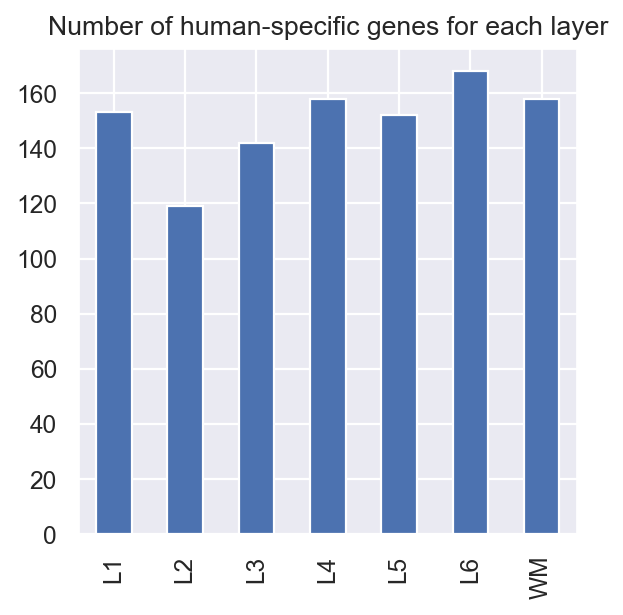

In [101]:
hum_spec_ttest_onehot.sum(axis=1).plot.bar()
plt.title('Number of human-specific genes for each layer')

In [102]:
from itertools import combinations
count_df = pd.DataFrame(columns=hum_spec_ttest_onehot.index, index=hum_spec_ttest_onehot.index)
for lay1, lay2 in combinations(layers, 2):
    count_num = (hum_spec_ttest_onehot.loc[lay1] * hum_spec_ttest_onehot.loc[lay2]).sum()
    count_df.loc[[lay1, lay2], [lay1, lay2]] = count_num
    count_df.loc[lay1, lay1] = hum_spec_ttest_onehot.loc[lay1].sum()
    count_df.loc[lay2, lay2] = hum_spec_ttest_onehot.loc[lay2].sum()
count_df = count_df.astype(int)
count_df

,L1,L2,L3,L4,L5,L6,WM
L1,153,23,21,23,36,39,25
L2,23,119,19,30,21,35,20
L3,21,19,142,26,34,30,32
L4,23,30,26,158,37,31,36
L5,36,21,34,37,152,35,25
L6,39,35,30,31,35,168,30
WM,25,20,32,36,25,30,158


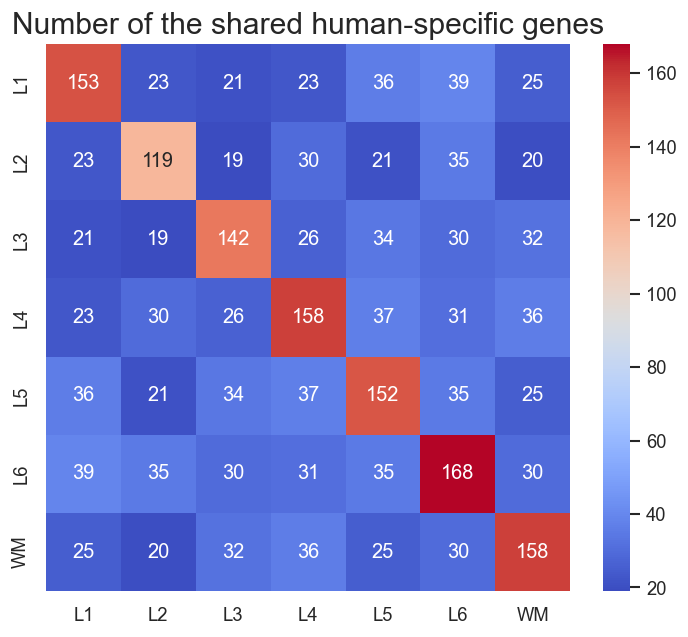

In [103]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(count_df, annot=True, cmap = 'coolwarm', fmt=".0f")
plt.title('Number of the shared human-specific genes', fontsize=18)
plt.grid(False)

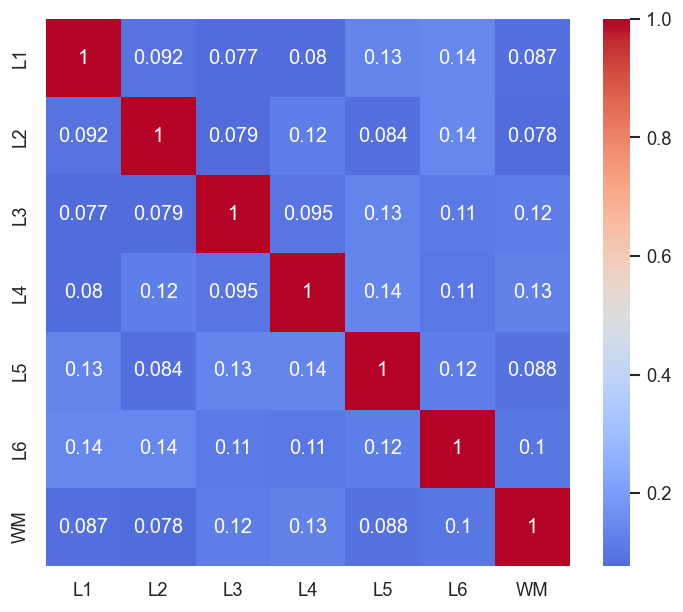

In [104]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(hum_spec_ttest_onehot), columns=hum_spec_ttest_onehot.index, index=hum_spec_ttest_onehot.index)
pairwise_jaccard

plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(pairwise_jaccard, annot=True, cmap = 'coolwarm', center=0.5)
plt.grid(False)

### ANOVA clusters visualization

In [105]:
pivot_labels = anova_labels.loc[hum_spec_ttest_inter].to_frame()
pivot_labels['count'] = hum_spec_ttest_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='ANOVA_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
ANOVA_labels,,,,,,,
1,46,20,4,0,0,0,1
2,35,24,16,4,0,1,0
3,57,42,16,7,1,0,0
4,49,18,14,3,0,1,0
5,64,29,9,2,0,0,1
6,56,40,6,2,0,0,0
7,26,23,9,0,0,0,0


In [106]:
pivot_labels_fraction = pivot_labels / anova_labels.value_counts().sort_index().values.reshape(7, 1)

(0.0, 0.4)

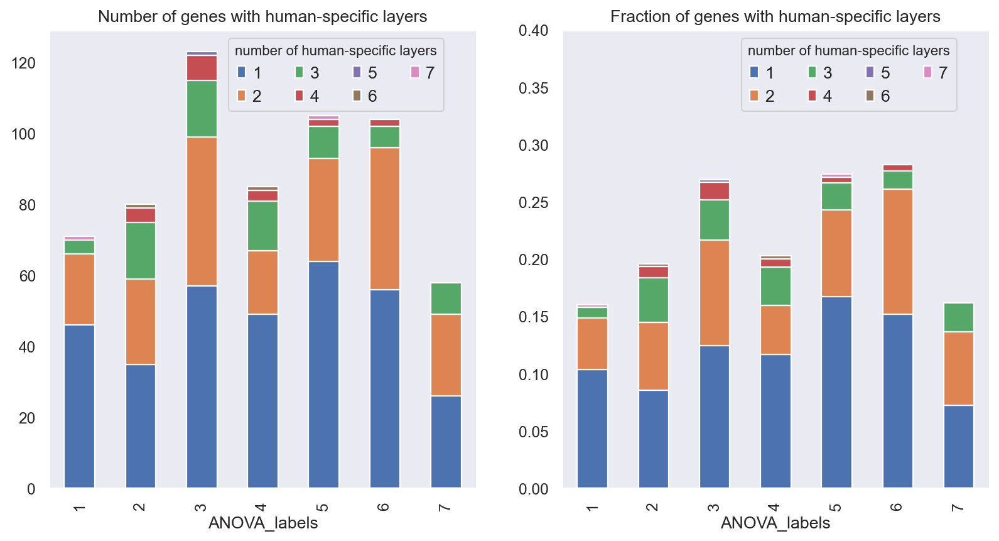

In [107]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[0], stacked=True)
ax[0].set_title('Number of genes with human-specific layers')
ax[0].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[0].grid(False)

pivot_labels_fraction.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Fraction of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)
ax[1].set_ylim(0, 0.4)

In [108]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['ANOVA cluster'] = anova_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['ANOVA cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
ANOVA cluster,,,,,,,
1,16,17,18,17,10,9,18
2,19,12,31,16,22,26,27
3,56,21,23,31,38,38,15
4,14,16,15,26,26,21,27
5,22,20,17,22,25,32,26
6,16,21,25,32,17,31,20
7,10,12,13,14,14,11,25


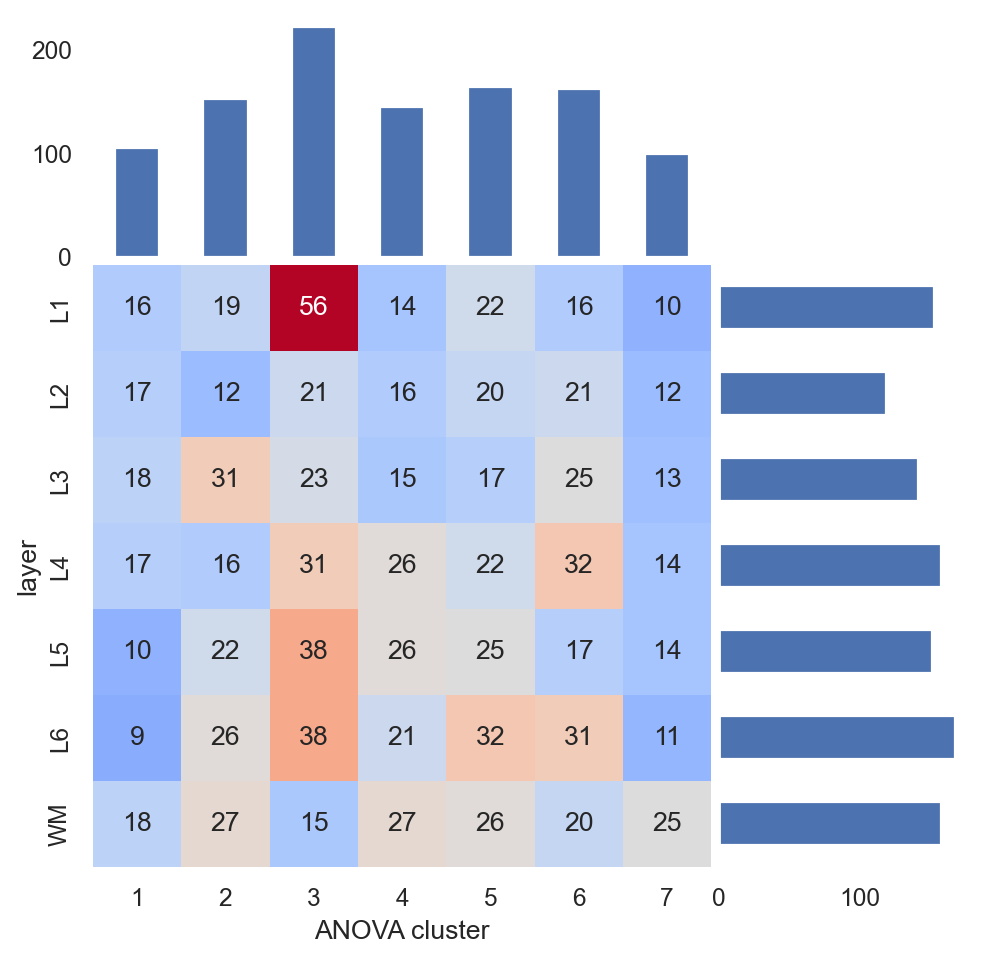

In [109]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

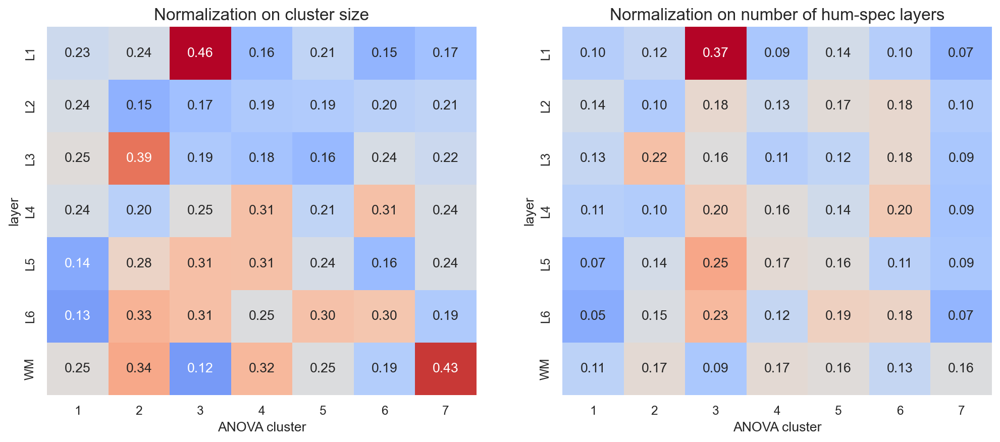

In [110]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=15)

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=15)
plt.show()

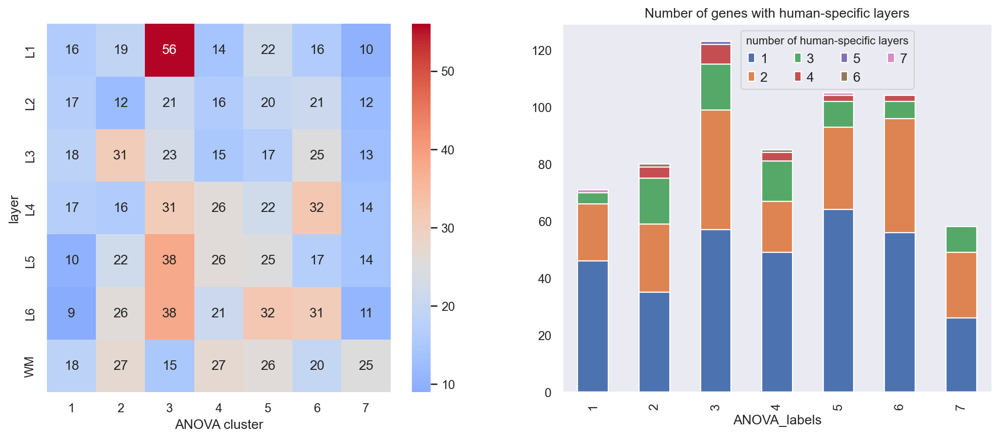

In [111]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [112]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [113]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ANKRD65      NADK      RERE    IGSF21      C1QB    ARID1A  \
condition layer                                                               
chimp     L1     0.000000  1.106832  0.518334 -1.144960  1.215197  0.053366   
          L2     0.000000 -1.020345  0.895420 -0.709974 -0.546718 -0.246298   
          L3    -0.111803  0.254596  0.701270 -0.060678 -0.260882 -0.190747   
          L4    -0.111803 -0.128780 -0.288065  0.881598 -0.500441 -0.741726   
          L5    -0.111803 -0.061237 -0.060713  0.973796 -0.587707 -0.288169   

                     IFI6      SDC3  MARCKSL1       AK2  ...      RTL6  \
condition layer                                          ...             
chimp     L1    -0.239759  0.207007 -0.317575  1.378845  ... -0.125988   
          L2     1.019848 -0.627710  1.771003 -0.250709  ... -0.125988   
          L3     0.259568 -0.124823  0.370587  0.696723  ...  0.455143   
          L4    -1.087213  0.461551  0.074850  0.230216  ... -0.206295   
          L5    -0.197306 -0.463564 -0.124499 -0.509850  ...  0.352722   

                 KIAA0930    SHANK3     NRIP1      JAM2    PAXBP1  TMEM50B  \
condition layer                                                              
chimp     L1    -0.120817 -0.150213 -0.566547  1.807398 -0.309253      0.0   
          L2    -0.077311 -0.150213 -0.373080 -0.764878 -0.309253      0.0   
          L3    -0.607820 -0.224463  0.005817 -0.576116  1.498797      0.0   
          L4     0.045618 -0.224463 -0.385707 -0.516873 -0.368866      0.0   
          L5    -0.123967 -0.106639 -0.356536 -0.560739  0.071680      0.0   

                    ITSN1     KCNJ6     BRWD1  
condition layer                                
chimp     L1     0.504915 -0.321016  0.838900  
          L2     0.097034 -0.321016  0.604044  
          L3    -0.448038  1.354088 -0.604273  
          L4    -0.081723 -0.378640 -0.653434  
          L5     0.069206  0.150416 -0.929530  

[5 rows x 626 columns]

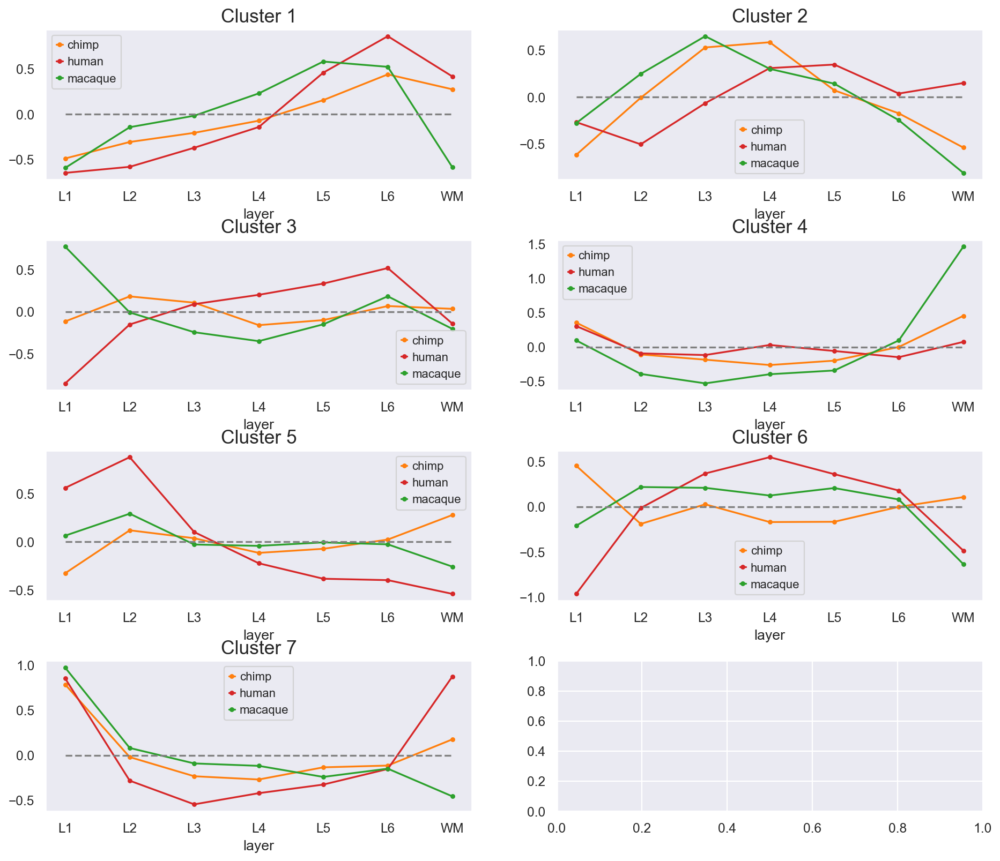

In [114]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(anova_labels.unique(), axes.flatten()):
    genes = anova_labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Human-specific clusters visualization

In [115]:
hs_labels.name = 'HS_labels'
pivot_labels = hs_labels.loc[hum_spec_ttest_inter].to_frame()
pivot_labels['count'] = hum_spec_ttest_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
HS_labels,,,,,,,
0,50,21,14,3,0,1,0
1,32,31,12,3,0,1,0
2,69,48,17,9,0,0,0
3,32,20,9,0,0,0,0
4,59,27,10,2,0,0,1
5,62,30,8,0,1,0,1
6,29,19,4,1,0,0,0


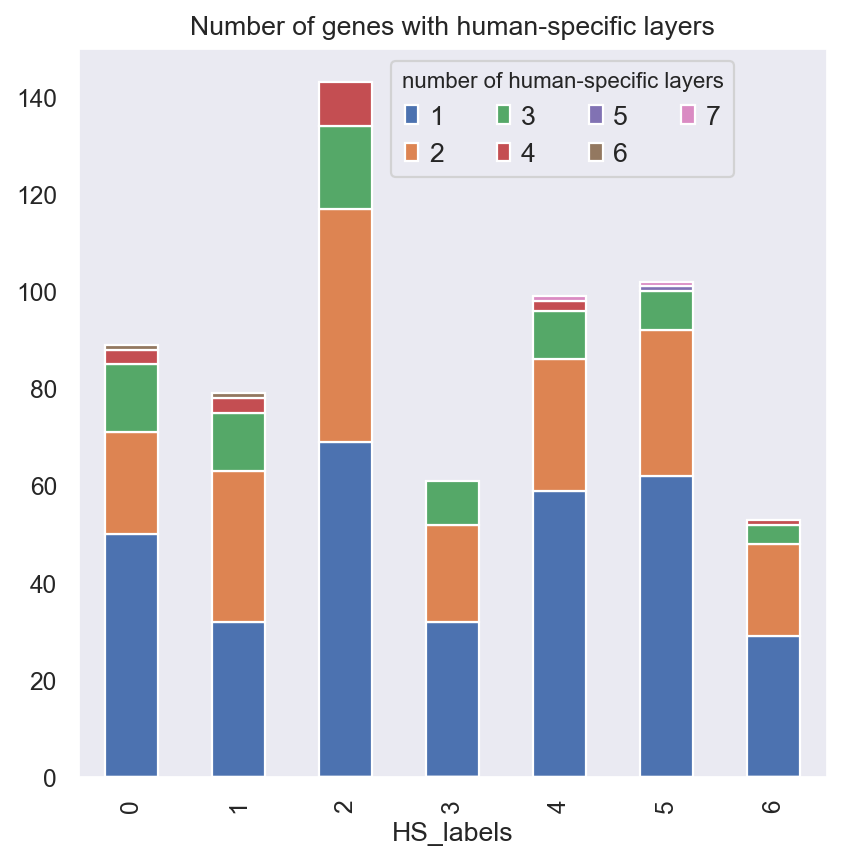

In [116]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [117]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS cluster'] = hs_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['HS cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS cluster,,,,,,,
0,14,18,20,22,23,24,31
1,22,14,21,20,25,25,21
2,53,24,37,43,43,36,16
3,11,11,10,16,13,15,23
4,23,15,19,22,26,32,21
5,20,25,25,23,14,21,30
6,10,12,10,12,8,15,16


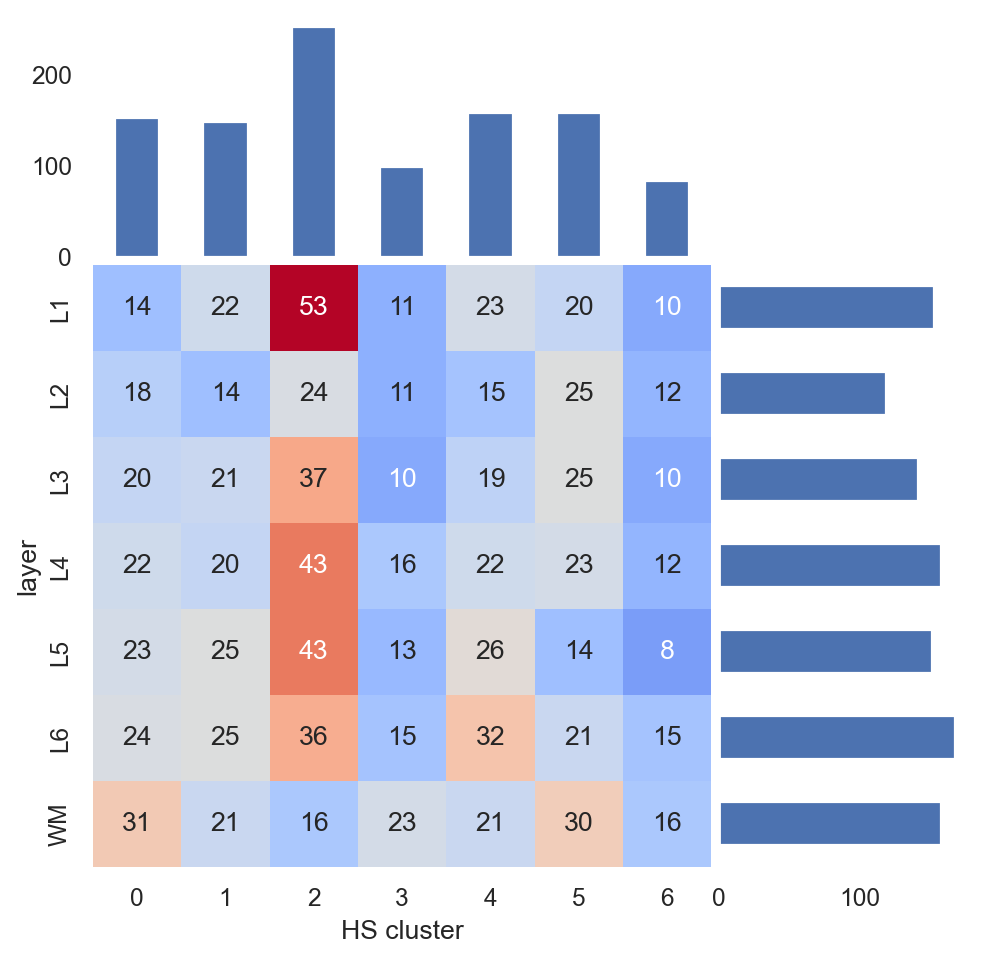

In [118]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

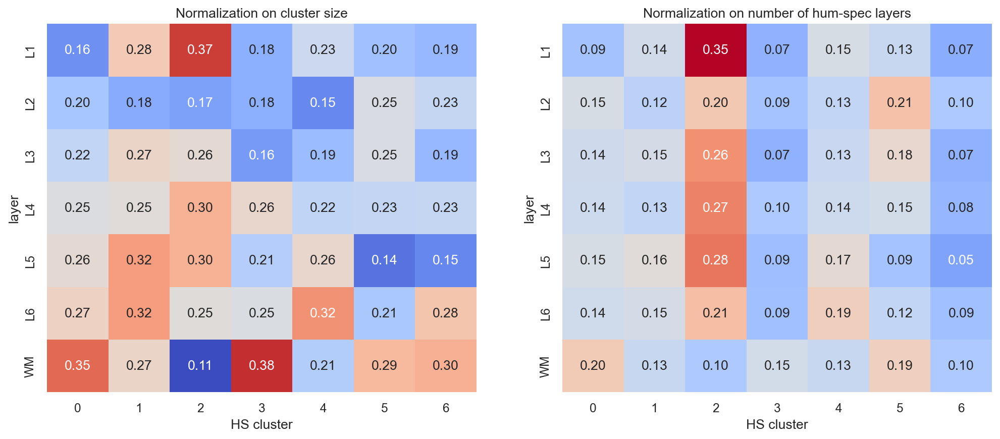

In [119]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size')

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers')
plt.show()

<Axes: xlabel='HS_labels'>

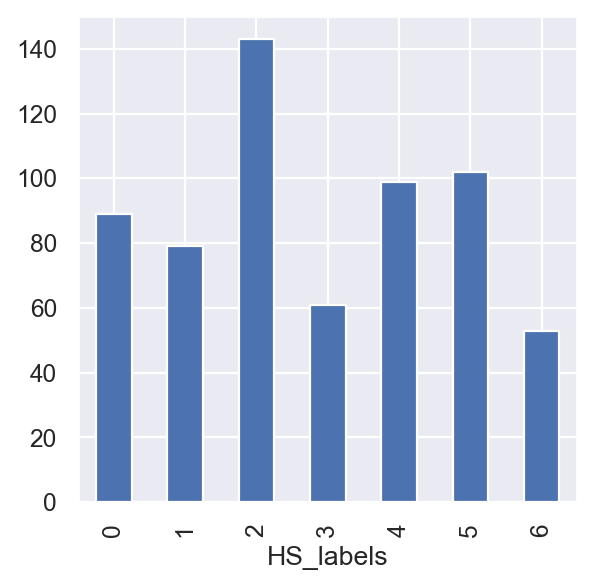

In [120]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

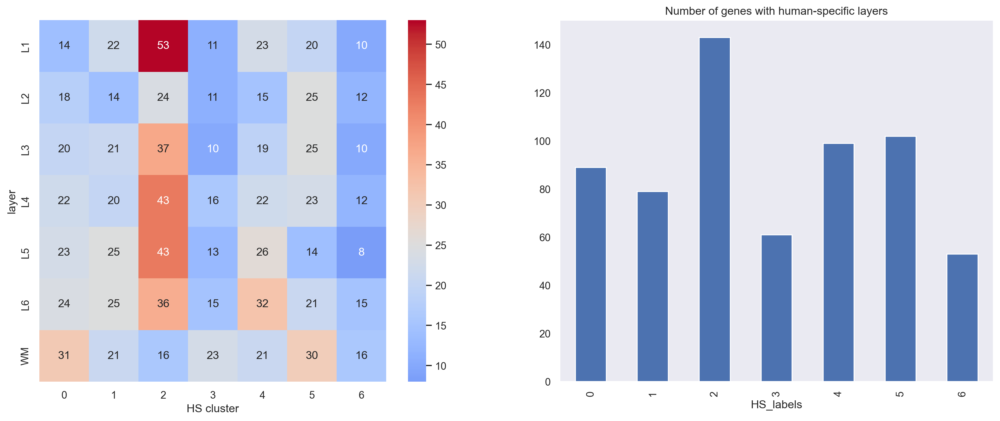

In [121]:
fig, ax = plt.subplots(1, 2, figsize=(18, 7), dpi=120)
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.sum(axis=1).plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
#ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [122]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [123]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ANKRD65      NADK      RERE    IGSF21      C1QB    ARID1A  \
condition layer                                                               
chimp     L1     0.000000  1.106832  0.518334 -1.144960  1.215197  0.053366   
          L2     0.000000 -1.020345  0.895420 -0.709974 -0.546718 -0.246298   
          L3    -0.111803  0.254596  0.701270 -0.060678 -0.260882 -0.190747   
          L4    -0.111803 -0.128780 -0.288065  0.881598 -0.500441 -0.741726   
          L5    -0.111803 -0.061237 -0.060713  0.973796 -0.587707 -0.288169   

                     IFI6      SDC3  MARCKSL1       AK2  ...      RTL6  \
condition layer                                          ...             
chimp     L1    -0.239759  0.207007 -0.317575  1.378845  ... -0.125988   
          L2     1.019848 -0.627710  1.771003 -0.250709  ... -0.125988   
          L3     0.259568 -0.124823  0.370587  0.696723  ...  0.455143   
          L4    -1.087213  0.461551  0.074850  0.230216  ... -0.206295   
          L5    -0.197306 -0.463564 -0.124499 -0.509850  ...  0.352722   

                 KIAA0930    SHANK3     NRIP1      JAM2    PAXBP1  TMEM50B  \
condition layer                                                              
chimp     L1    -0.120817 -0.150213 -0.566547  1.807398 -0.309253      0.0   
          L2    -0.077311 -0.150213 -0.373080 -0.764878 -0.309253      0.0   
          L3    -0.607820 -0.224463  0.005817 -0.576116  1.498797      0.0   
          L4     0.045618 -0.224463 -0.385707 -0.516873 -0.368866      0.0   
          L5    -0.123967 -0.106639 -0.356536 -0.560739  0.071680      0.0   

                    ITSN1     KCNJ6     BRWD1  
condition layer                                
chimp     L1     0.504915 -0.321016  0.838900  
          L2     0.097034 -0.321016  0.604044  
          L3    -0.448038  1.354088 -0.604273  
          L4    -0.081723 -0.378640 -0.653434  
          L5     0.069206  0.150416 -0.929530  

[5 rows x 626 columns]

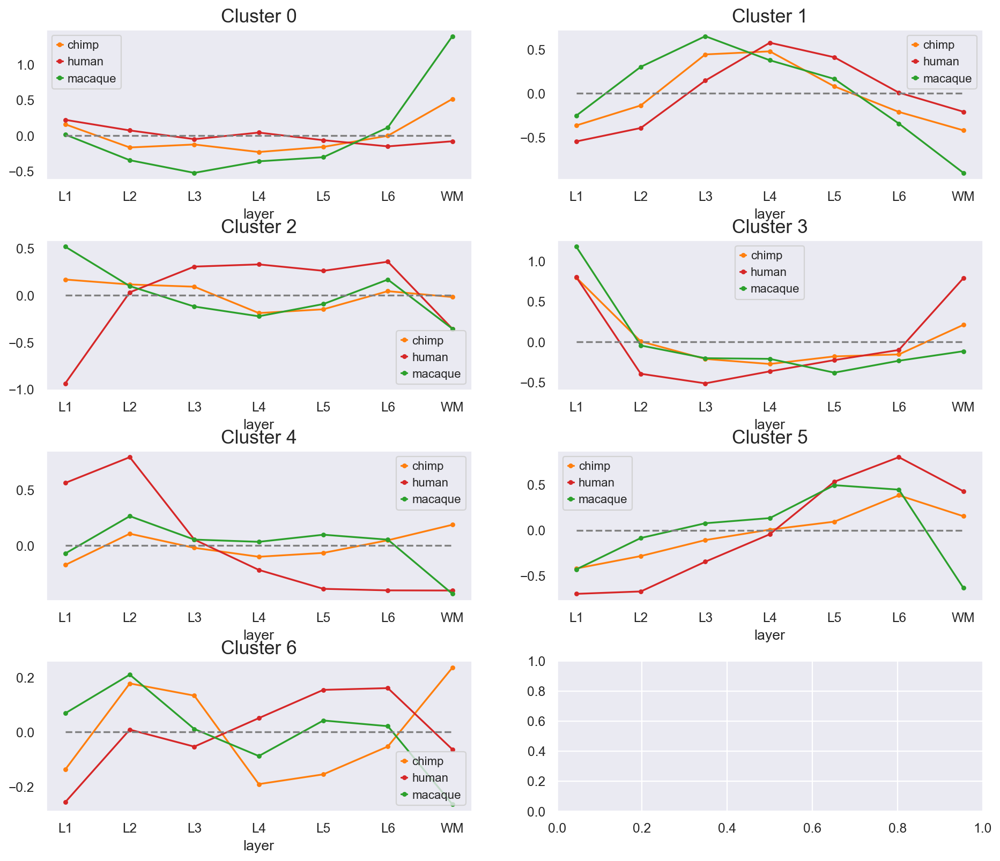

In [124]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(hs_labels.unique(), axes.flatten()):
    genes = hs_labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

## Clusterization of ttest sign and  hum-spec genes

### Hierarchial

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


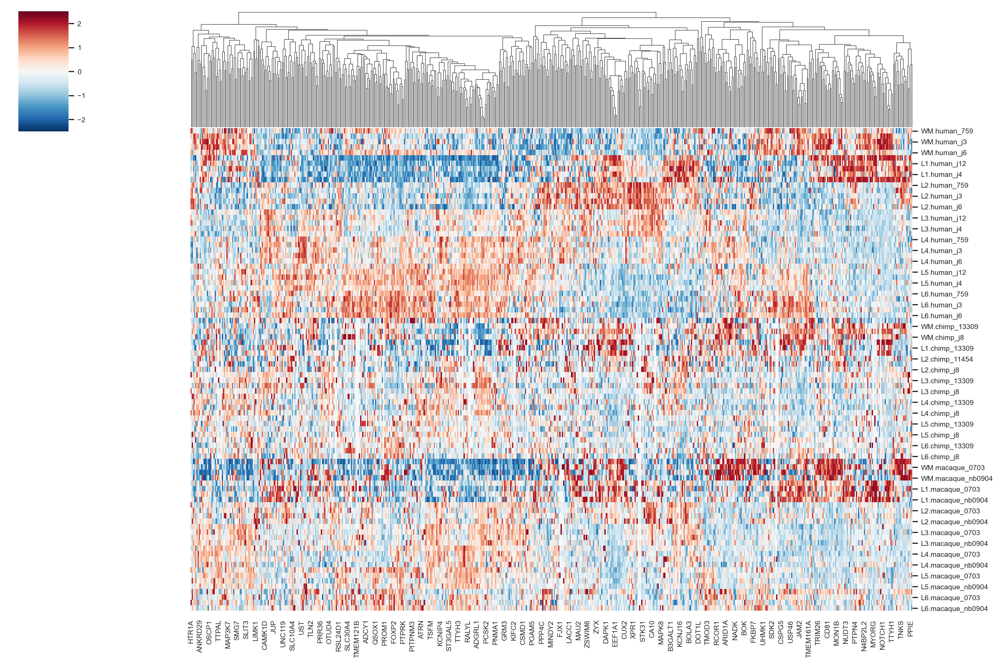

In [125]:
sns.set(font_scale=0.7)
sns.clustermap(df[hum_spec_ttest_inter], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

### Spectral

In [126]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hum_spec_ttest_inter].T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [127]:
labels = pd.Series(clustering.labels_, index=hum_spec_ttest_inter).sort_values()
order = labels.sort_values().index
labels.to_csv('results/hs_ttest_inter_clusters.csv')

<Axes: >

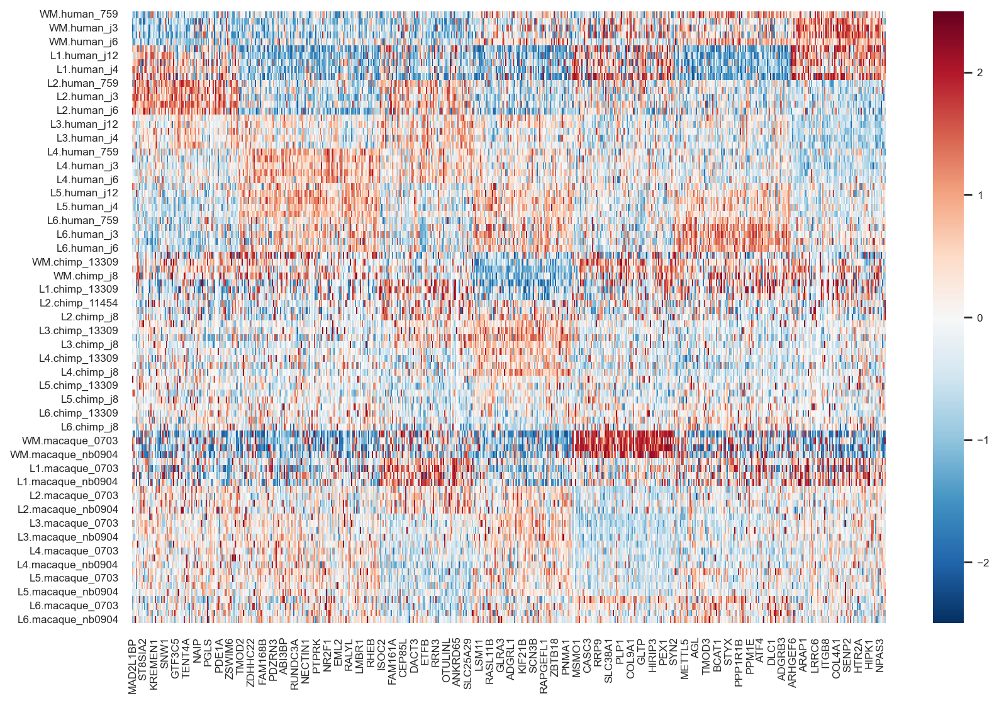

In [128]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
#plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

In [129]:
sns.set(font_scale=1)

### Profiles

In [130]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [131]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ANKRD65      NADK      RERE    IGSF21      C1QB    ARID1A  \
condition layer                                                               
chimp     L1     0.000000  1.106832  0.518334 -1.144960  1.215197  0.053366   
          L2     0.000000 -1.020345  0.895420 -0.709974 -0.546718 -0.246298   
          L3    -0.111803  0.254596  0.701270 -0.060678 -0.260882 -0.190747   
          L4    -0.111803 -0.128780 -0.288065  0.881598 -0.500441 -0.741726   
          L5    -0.111803 -0.061237 -0.060713  0.973796 -0.587707 -0.288169   

                     IFI6      SDC3  MARCKSL1       AK2  ...      RTL6  \
condition layer                                          ...             
chimp     L1    -0.239759  0.207007 -0.317575  1.378845  ... -0.125988   
          L2     1.019848 -0.627710  1.771003 -0.250709  ... -0.125988   
          L3     0.259568 -0.124823  0.370587  0.696723  ...  0.455143   
          L4    -1.087213  0.461551  0.074850  0.230216  ... -0.206295   
          L5    -0.197306 -0.463564 -0.124499 -0.509850  ...  0.352722   

                 KIAA0930    SHANK3     NRIP1      JAM2    PAXBP1  TMEM50B  \
condition layer                                                              
chimp     L1    -0.120817 -0.150213 -0.566547  1.807398 -0.309253      0.0   
          L2    -0.077311 -0.150213 -0.373080 -0.764878 -0.309253      0.0   
          L3    -0.607820 -0.224463  0.005817 -0.576116  1.498797      0.0   
          L4     0.045618 -0.224463 -0.385707 -0.516873 -0.368866      0.0   
          L5    -0.123967 -0.106639 -0.356536 -0.560739  0.071680      0.0   

                    ITSN1     KCNJ6     BRWD1  
condition layer                                
chimp     L1     0.504915 -0.321016  0.838900  
          L2     0.097034 -0.321016  0.604044  
          L3    -0.448038  1.354088 -0.604273  
          L4    -0.081723 -0.378640 -0.653434  
          L5     0.069206  0.150416 -0.929530  

[5 rows x 626 columns]

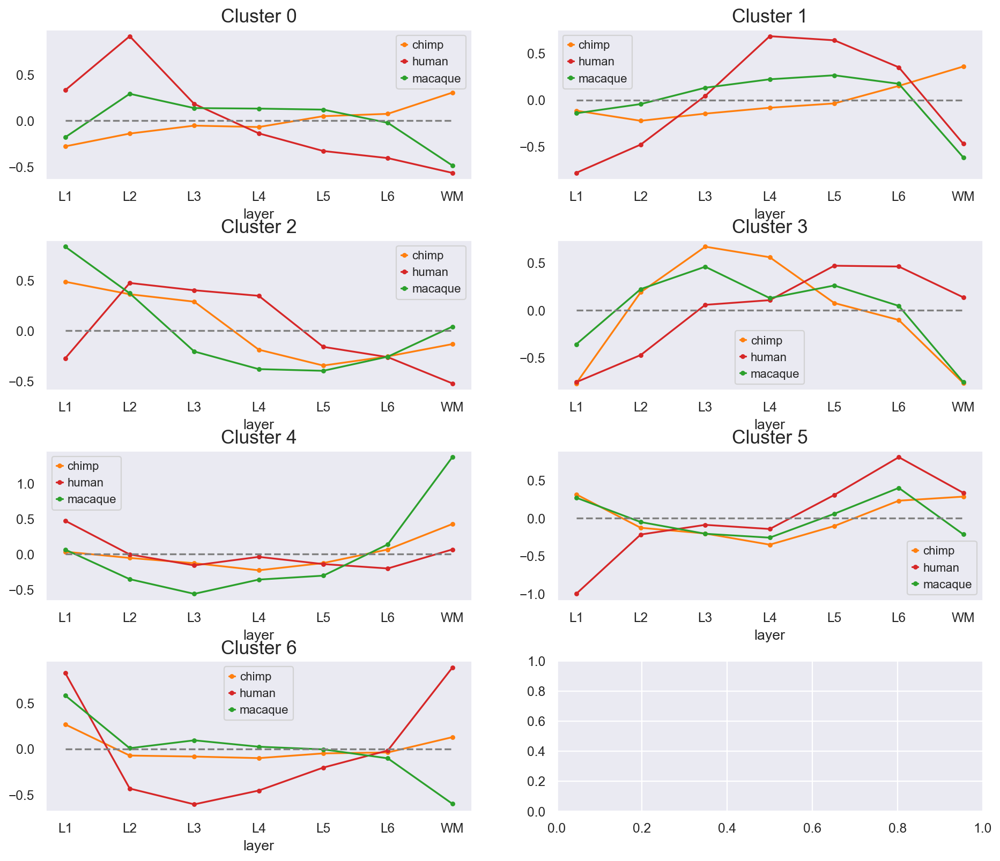

In [132]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Describe clusters

In [133]:
labels.name = 'HS & ttest labels'
pivot_labels = labels.to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS & ttest labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
HS & ttest labels,,,,,,,
0,50,23,12,2,0,0,1
1,62,37,14,4,0,1,0
2,40,24,9,4,0,0,0
3,43,27,9,3,0,0,0
4,49,21,12,2,0,1,0
5,51,33,9,2,1,0,1
6,38,31,9,1,0,0,0


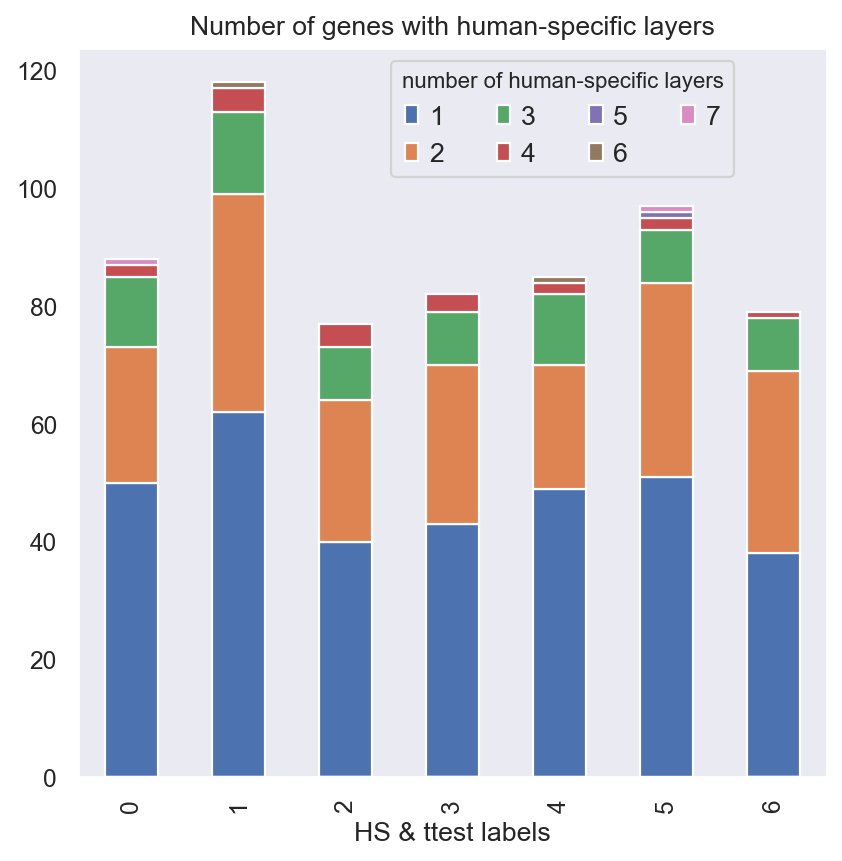

In [134]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [135]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS & ttest cluster'] = labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['HS & ttest cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS & ttest cluster,,,,,,,
0,19,17,19,20,24,29,19
1,31,30,25,32,29,39,14
2,22,13,16,29,16,16,19
3,22,15,22,12,21,20,24
4,16,17,15,22,20,25,26
5,32,16,23,24,24,24,21
6,11,11,22,19,18,15,35


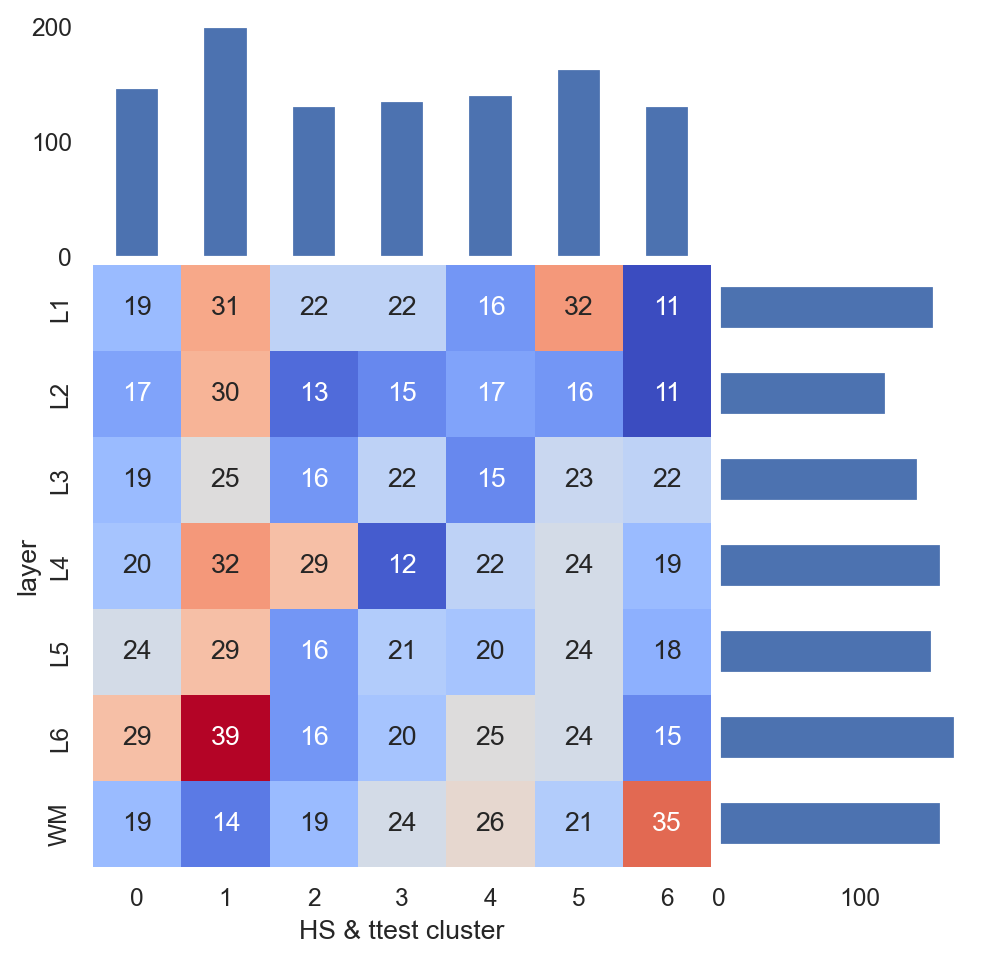

In [136]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

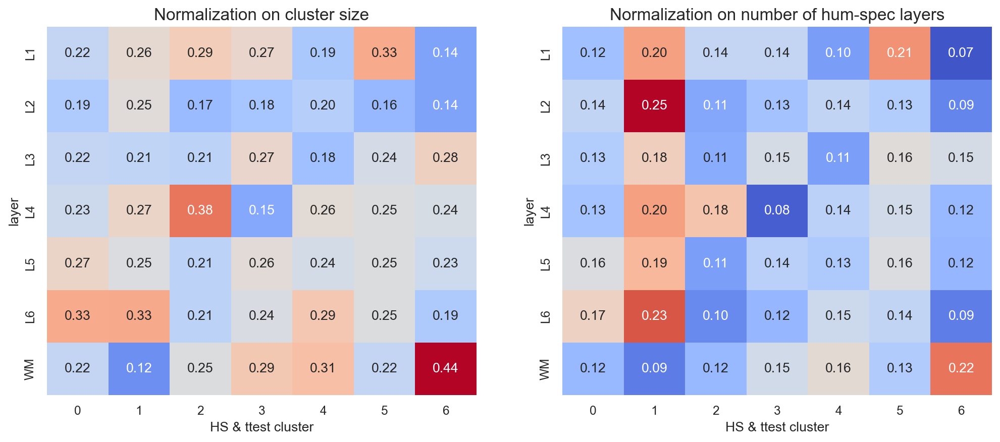

In [137]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=15)

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=15)
plt.show()

<Axes: xlabel='HS & ttest labels'>

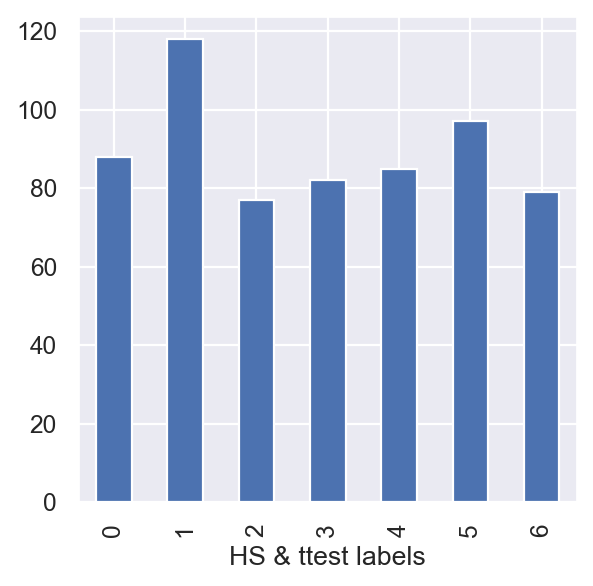

In [138]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

In [139]:
anova_dummies = anova_labels.astype(str).str.get_dummies()
anova_dummies.columns = 'ANOVA_' + anova_dummies.columns
anova_dummies.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7
PRMT2,1,0,0,0,0,0,0
CELF4,1,0,0,0,0,0,0
MRPL40,1,0,0,0,0,0,0
CDH2,1,0,0,0,0,0,0
BRINP2,1,0,0,0,0,0,0


In [140]:
hs_anova_dummies = labels.astype(str).str.get_dummies()
hs_anova_dummies.columns = 'HS & ttest' + hs_anova_dummies.columns
hs_anova_dummies.head()

,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
MAD2L1BP,1,0,0,0,0,0,0
ZNF529,1,0,0,0,0,0,0
ZNF333,1,0,0,0,0,0,0
APIP,1,0,0,0,0,0,0
BOLA3,1,0,0,0,0,0,0


In [141]:
dummie_concat = pd.concat([anova_dummies, hs_anova_dummies], axis=1).fillna(0)
dummie_concat.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
PRMT2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CELF4,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MRPL40,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CDH2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BRINP2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


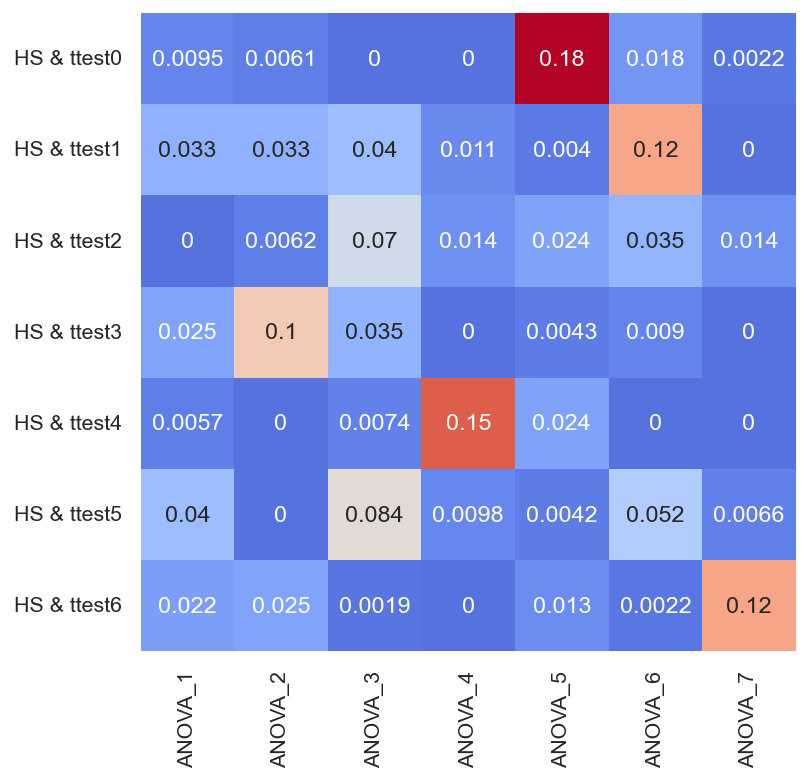

In [142]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_anova_dummies.columns, anova_dummies.columns], annot=True, cmap = 'coolwarm', center=0.08, cbar=False)
plt.grid(False)

In [143]:
gene_inter = labels.index.intersection(anova_labels.index)
table_to_pivot = pd.concat([anova_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['ANOVA', 'HS & ttest']
pivot_labels_inter = table_to_pivot.groupby('ANOVA').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ttest,0,1,2,3,4,5,6
ANOVA,,,,,,,
1,5.0,18.0,0.0,13.0,3.0,21.0,11.0
2,3.0,17.0,3.0,45.0,0.0,0.0,12.0
3,0.0,22.0,35.0,18.0,4.0,43.0,1.0
4,0.0,6.0,7.0,0.0,67.0,5.0,0.0
5,71.0,2.0,11.0,2.0,11.0,2.0,6.0
6,8.0,53.0,15.0,4.0,0.0,23.0,1.0
7,1.0,0.0,6.0,0.0,0.0,3.0,48.0


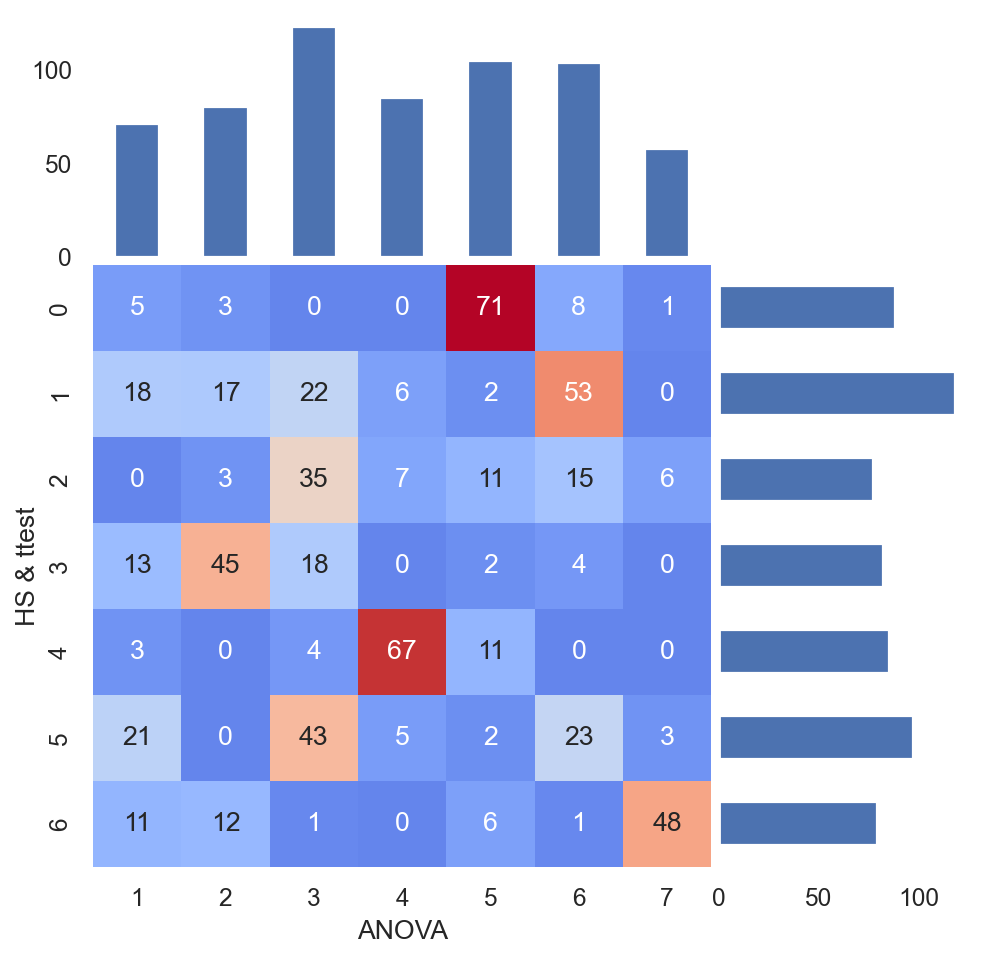

In [144]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=30, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

In [145]:
hs_dummies = hs_labels.astype(str).str.get_dummies()
hs_dummies.columns = 'HS' + hs_dummies.columns
hs_dummies.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6
CDK4,1,0,0,0,0,0,0
ANP32B,1,0,0,0,0,0,0
FBXL5,1,0,0,0,0,0,0
ASCC3,1,0,0,0,0,0,0
GPN1,1,0,0,0,0,0,0


In [146]:
hs_ttest_dummies = labels.astype(str).str.get_dummies()
hs_ttest_dummies.columns = 'HS & ttest' + hs_ttest_dummies.columns
hs_ttest_dummies.head()

,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
MAD2L1BP,1,0,0,0,0,0,0
ZNF529,1,0,0,0,0,0,0
ZNF333,1,0,0,0,0,0,0
APIP,1,0,0,0,0,0,0
BOLA3,1,0,0,0,0,0,0


In [147]:
dummie_concat = pd.concat([hs_dummies, hs_ttest_dummies], axis=1).fillna(0)
dummie_concat.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
CDK4,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ANP32B,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FBXL5,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
ASCC3,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GPN1,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


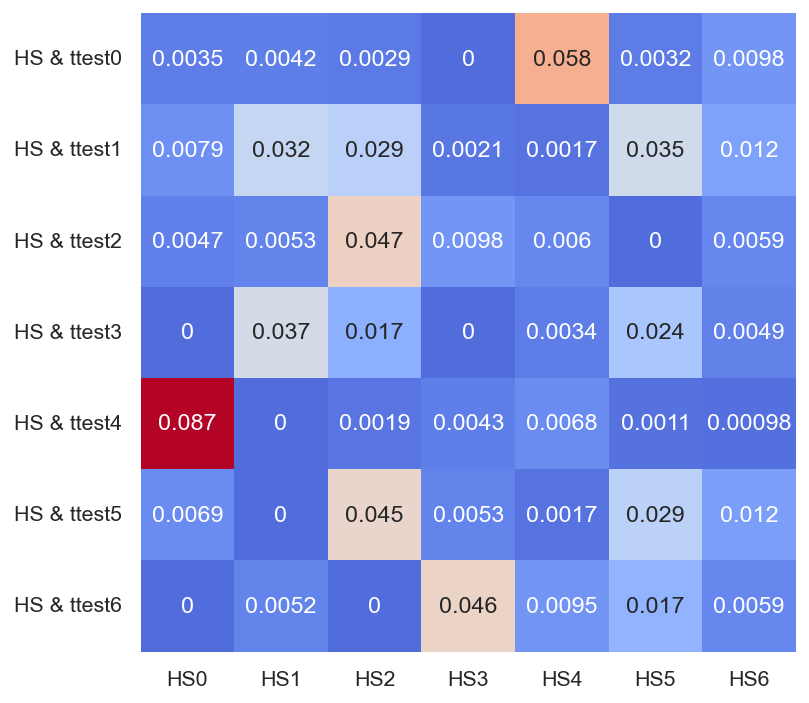

In [148]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_ttest_dummies.columns, hs_dummies.columns], annot=True, cmap = 'coolwarm', center=0.04, cbar=False)
plt.grid(False)

In [149]:
gene_inter = labels.index.intersection(hs_labels.index)
table_to_pivot = pd.concat([hs_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['HS', 'HS & ttest']
pivot_labels_inter = table_to_pivot.groupby('HS').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ttest,0,1,2,3,4,5,6
HS,,,,,,,
0,3.0,7.0,4.0,0.0,69.0,6.0,0.0
1,4.0,31.0,5.0,34.0,0.0,0.0,5.0
2,3.0,30.0,46.0,17.0,2.0,45.0,0.0
3,0.0,2.0,9.0,0.0,4.0,5.0,41.0
4,65.0,2.0,7.0,4.0,8.0,2.0,11.0
5,3.0,33.0,0.0,22.0,1.0,27.0,16.0
6,10.0,13.0,6.0,5.0,1.0,12.0,6.0


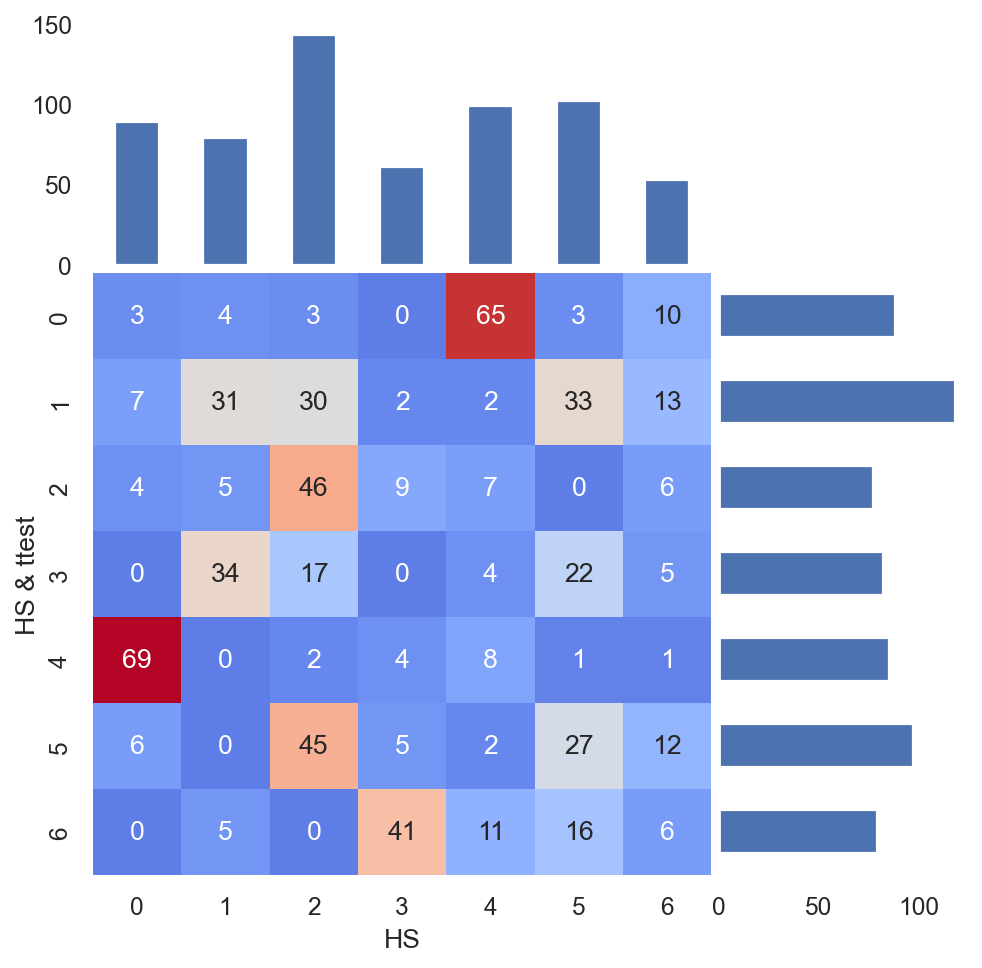

In [150]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=30, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

### P-value = 0.05

In [151]:
hum_spec_ttest_inter = hum_spec_onehot.columns.intersection(hc_genes[0.05])
hum_spec_ttest_inter

Index(['ANKRD65', 'NADK', 'IGSF21', 'ARID1A', 'MAP7D1', 'MEAF6', 'RIMS3',
       'PPCS', 'S1PR1', 'COL11A1',
       ...
       'ZNF579', 'TMEM121B', 'GNAZ', 'SMARCB1', 'KREMEN1', 'EMID1', 'KCNJ4',
       'NRIP1', 'JAM2', 'PAXBP1'],
      dtype='object', length=277)

### Visualization for layer freq

In [152]:
hum_spec_ttest_onehot = hum_spec_onehot[hum_spec_ttest_inter]

Text(0.5, 1.0, 'Number of human-specific genes for each layer')

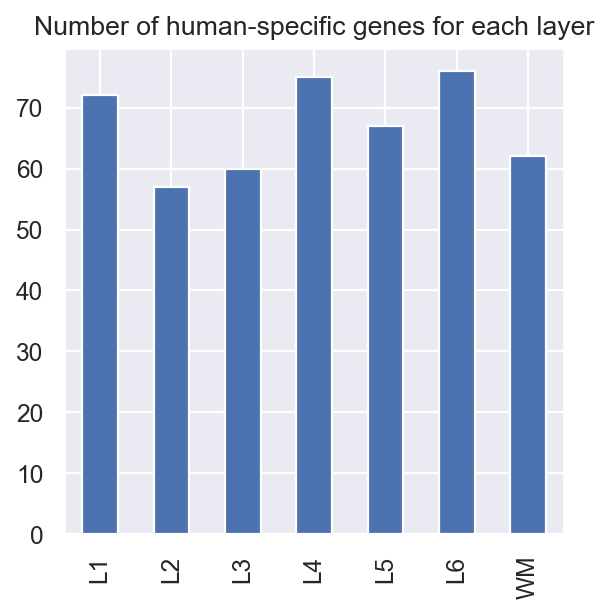

In [153]:
hum_spec_ttest_onehot.sum(axis=1).plot.bar()
plt.title('Number of human-specific genes for each layer')

In [154]:
from itertools import combinations
count_df = pd.DataFrame(columns=hum_spec_ttest_onehot.index, index=hum_spec_ttest_onehot.index)
for lay1, lay2 in combinations(layers, 2):
    count_num = (hum_spec_ttest_onehot.loc[lay1] * hum_spec_ttest_onehot.loc[lay2]).sum()
    count_df.loc[[lay1, lay2], [lay1, lay2]] = count_num
    count_df.loc[lay1, lay1] = hum_spec_ttest_onehot.loc[lay1].sum()
    count_df.loc[lay2, lay2] = hum_spec_ttest_onehot.loc[lay2].sum()
count_df = count_df.astype(int)
count_df

,L1,L2,L3,L4,L5,L6,WM
L1,72,12,11,15,18,20,10
L2,12,57,7,15,14,16,10
L3,11,7,60,9,13,15,15
L4,15,15,9,75,19,15,16
L5,18,14,13,19,67,18,10
L6,20,16,15,15,18,76,12
WM,10,10,15,16,10,12,62


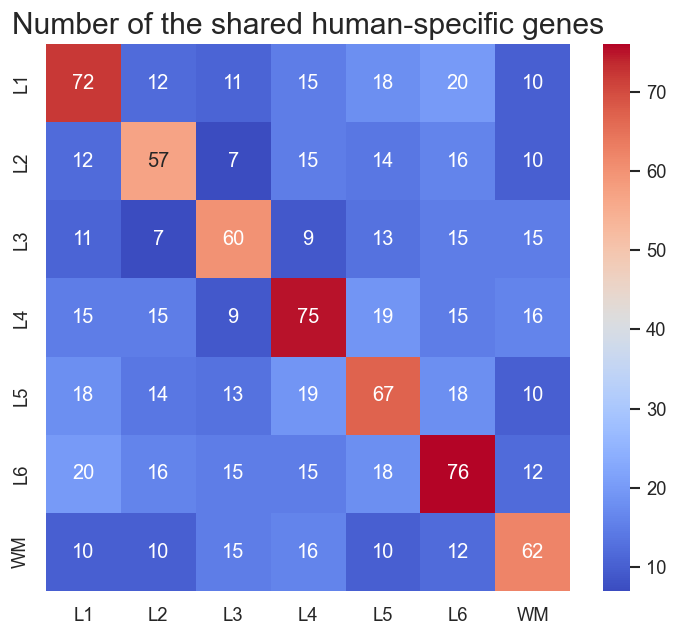

In [155]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(count_df, annot=True, cmap = 'coolwarm', fmt=".0f")
plt.title('Number of the shared human-specific genes', fontsize=18)
plt.grid(False)

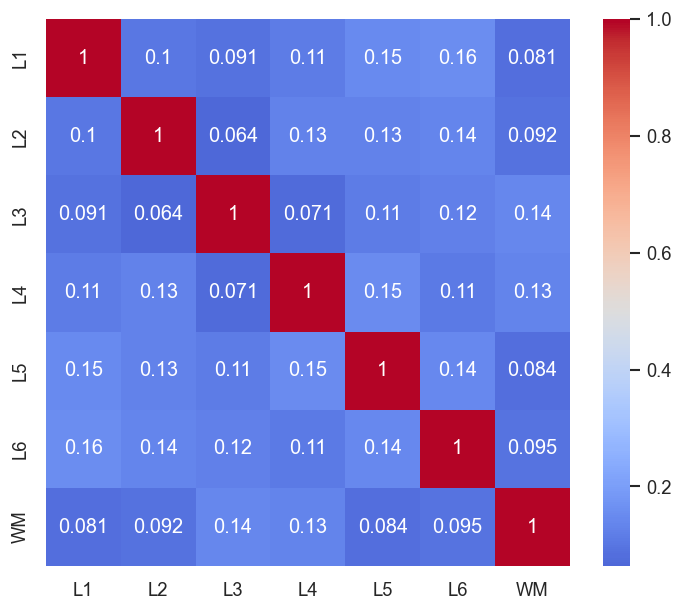

In [156]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(hum_spec_ttest_onehot), columns=hum_spec_ttest_onehot.index, index=hum_spec_ttest_onehot.index)
pairwise_jaccard

plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(pairwise_jaccard, annot=True, cmap = 'coolwarm', center=0.5)
plt.grid(False)

### ANOVA clusters visualization

In [157]:
pivot_labels = anova_labels.loc[hum_spec_ttest_inter].to_frame()
pivot_labels['count'] = hum_spec_ttest_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='ANOVA_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,6,7
ANOVA_labels,,,,,,
1,19,10,2,0,0,1
2,14,8,7,2,1,0
3,26,16,5,2,0,0
4,15,7,5,1,1,0
5,32,16,7,0,0,1
6,27,21,5,0,0,0
7,13,11,2,0,0,0


In [158]:
pivot_labels_fraction = pivot_labels / anova_labels.value_counts().sort_index().values.reshape(7, 1)

(0.0, 0.4)

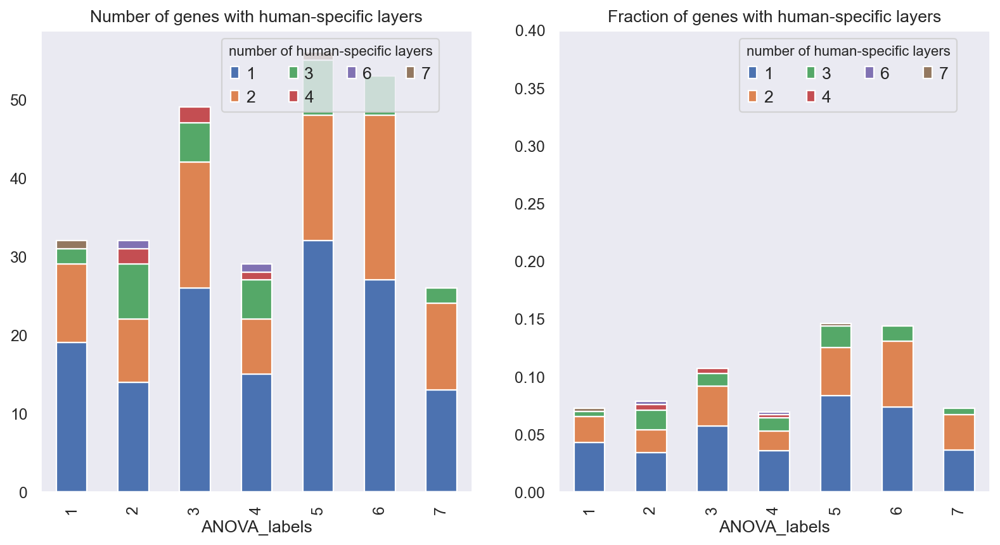

In [159]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[0], stacked=True)
ax[0].set_title('Number of genes with human-specific layers')
ax[0].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[0].grid(False)

pivot_labels_fraction.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Fraction of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)
ax[1].set_ylim(0, 0.4)

In [160]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['ANOVA cluster'] = anova_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['ANOVA cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
ANOVA cluster,,,,,,,
1,7,9,7,9,5,4,11
2,10,5,11,7,11,12,9
3,20,8,7,13,13,17,3
4,7,8,6,6,9,11,7
5,13,13,10,16,12,14,14
6,11,11,12,19,10,14,7
7,4,3,7,5,7,4,11


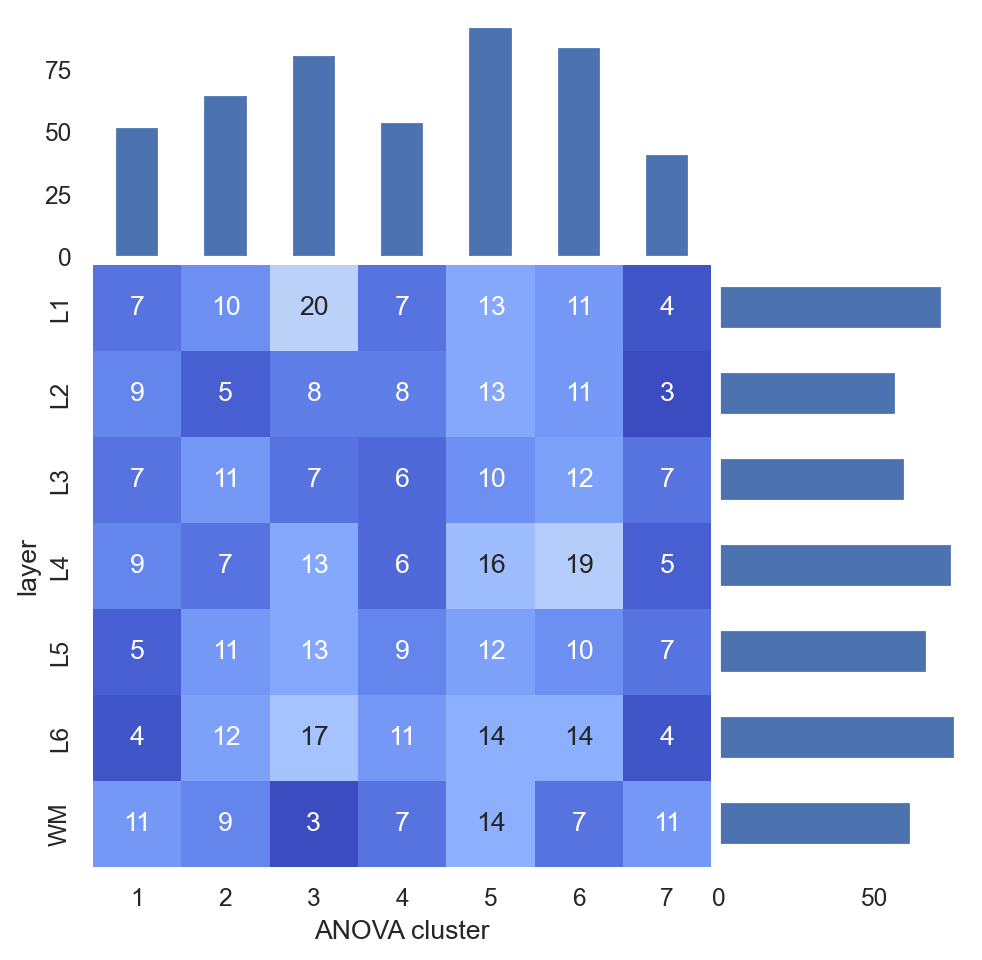

In [161]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

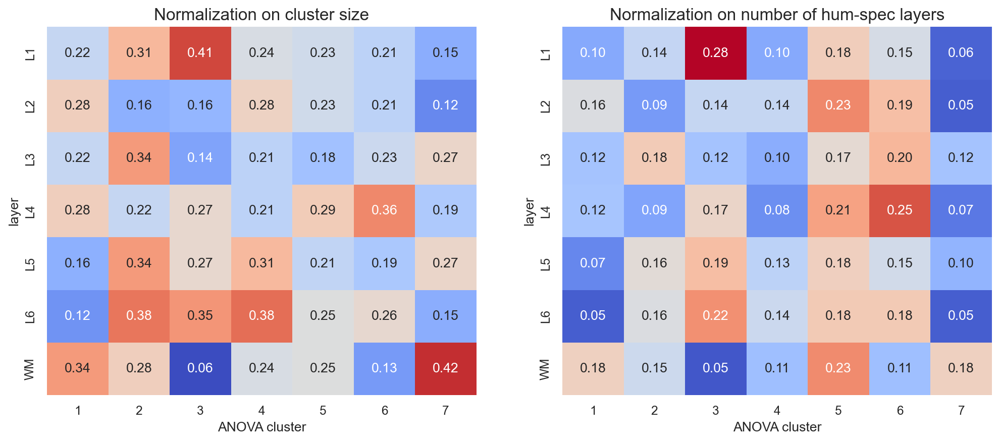

In [162]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=15)

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=15)
plt.show()

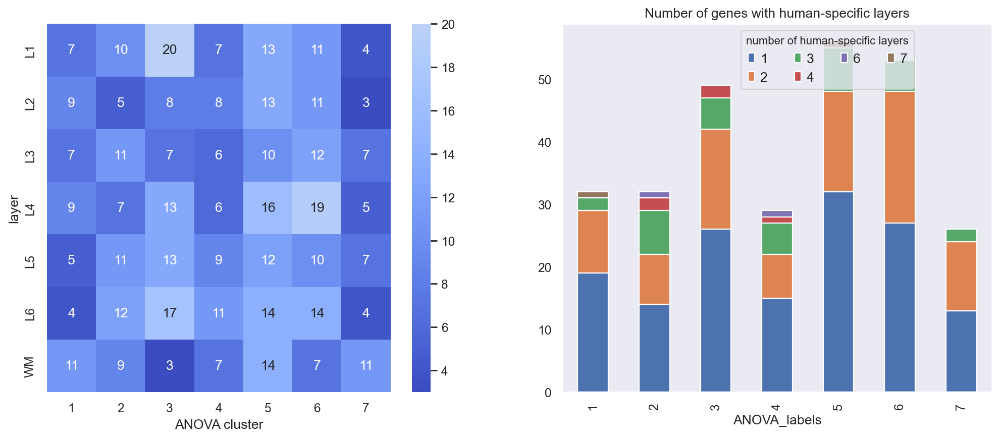

In [163]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [164]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [165]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ANKRD65      NADK    IGSF21    ARID1A    MAP7D1     MEAF6  \
condition layer                                                               
chimp     L1     0.000000  1.106832 -1.144960  0.053366  0.244616 -1.173535   
          L2     0.000000 -1.020345 -0.709974 -0.246298 -0.129422 -0.722553   
          L3    -0.111803  0.254596 -0.060678 -0.190747 -0.296408  0.342526   
          L4    -0.111803 -0.128780  0.881598 -0.741726 -0.912019  0.933547   
          L5    -0.111803 -0.061237  0.973796 -0.288169 -0.311996  0.993688   

                    RIMS3      PPCS     S1PR1   COL11A1  ...    ZNF579  \
condition layer                                          ...             
chimp     L1     0.378207  0.906215 -0.251976  1.658344  ... -0.807146   
          L2    -0.503711 -0.093807 -0.251976  0.507680  ... -0.023190   
          L3    -0.212455  0.313166 -0.430450 -1.110132  ...  0.859209   
          L4    -0.542110  0.198840 -0.430450 -0.617823  ... -0.529854   
          L5    -0.059982 -0.257897  1.178188 -0.334456  ...  0.223835   

                 TMEM121B      GNAZ   SMARCB1   KREMEN1     EMID1     KCNJ4  \
condition layer                                                               
chimp     L1          0.0 -0.686106 -0.410996 -0.404644 -0.751575 -0.716656   
          L2          0.0  1.093007  0.214845  0.489405  0.073887  0.193893   
          L3          0.0  0.875318 -0.576559  1.038559 -0.133647  0.781086   
          L4          0.0  0.742585 -0.508977 -0.415287 -0.098703 -0.162695   
          L5          0.0 -0.235886  0.247833 -0.415287 -0.005457  0.473958   

                    NRIP1      JAM2    PAXBP1  
condition layer                                
chimp     L1    -0.566547  1.807398 -0.309253  
          L2    -0.373080 -0.764878 -0.309253  
          L3     0.005817 -0.576116  1.498797  
          L4    -0.385707 -0.516873 -0.368866  
          L5    -0.356536 -0.560739  0.071680  

[5 rows x 277 columns]

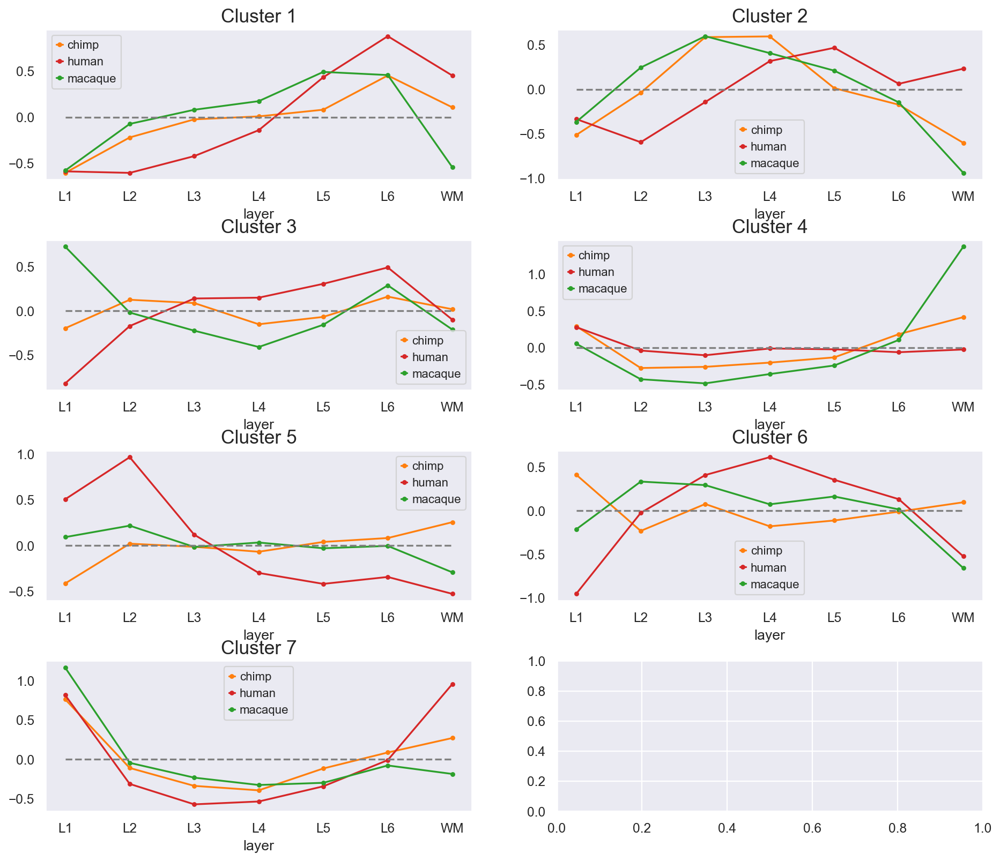

In [166]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(anova_labels.unique(), axes.flatten()):
    genes = anova_labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Human-specific clusters visualization

In [167]:
hs_labels.name = 'HS_labels'
pivot_labels = hs_labels.loc[hum_spec_ttest_inter].to_frame()
pivot_labels['count'] = hum_spec_ttest_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,6,7
HS_labels,,,,,,
0,15,8,6,1,1,0
1,15,14,6,1,1,0
2,31,21,7,2,0,0
3,13,9,3,0,0,0
4,32,15,6,1,0,1
5,28,14,4,0,0,1
6,12,8,1,0,0,0


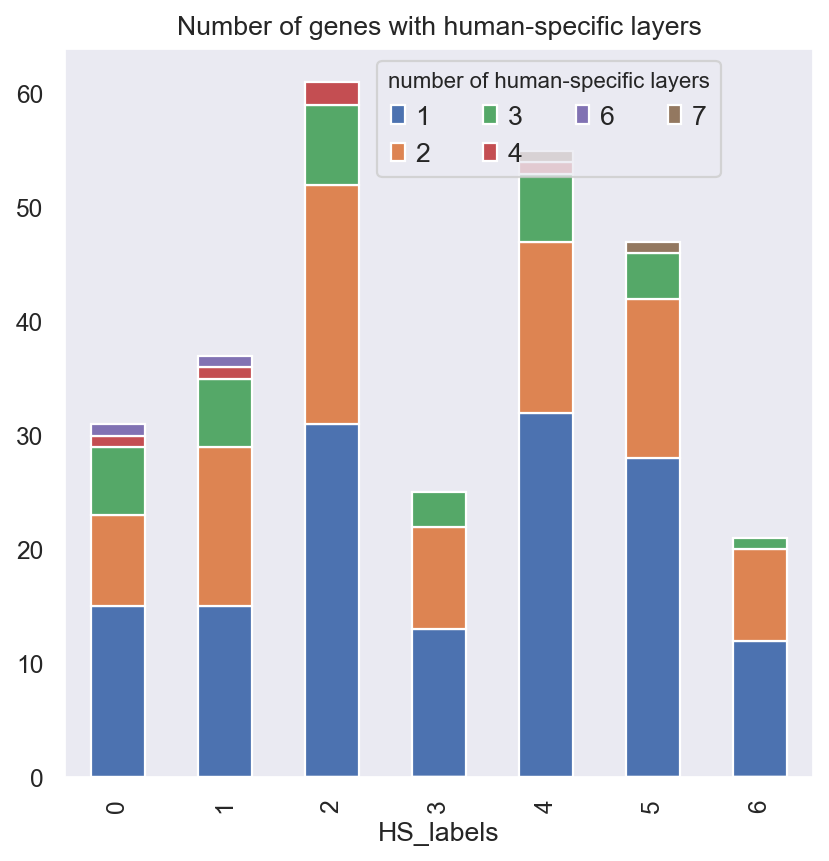

In [168]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [169]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS cluster'] = hs_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['HS cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS cluster,,,,,,,
0,8,9,9,4,8,11,10
1,13,7,8,10,13,12,8
2,20,8,15,21,17,18,3
3,5,4,3,5,5,8,10
4,13,9,11,18,15,14,11
5,9,14,10,11,7,10,14
6,4,6,4,6,2,3,6


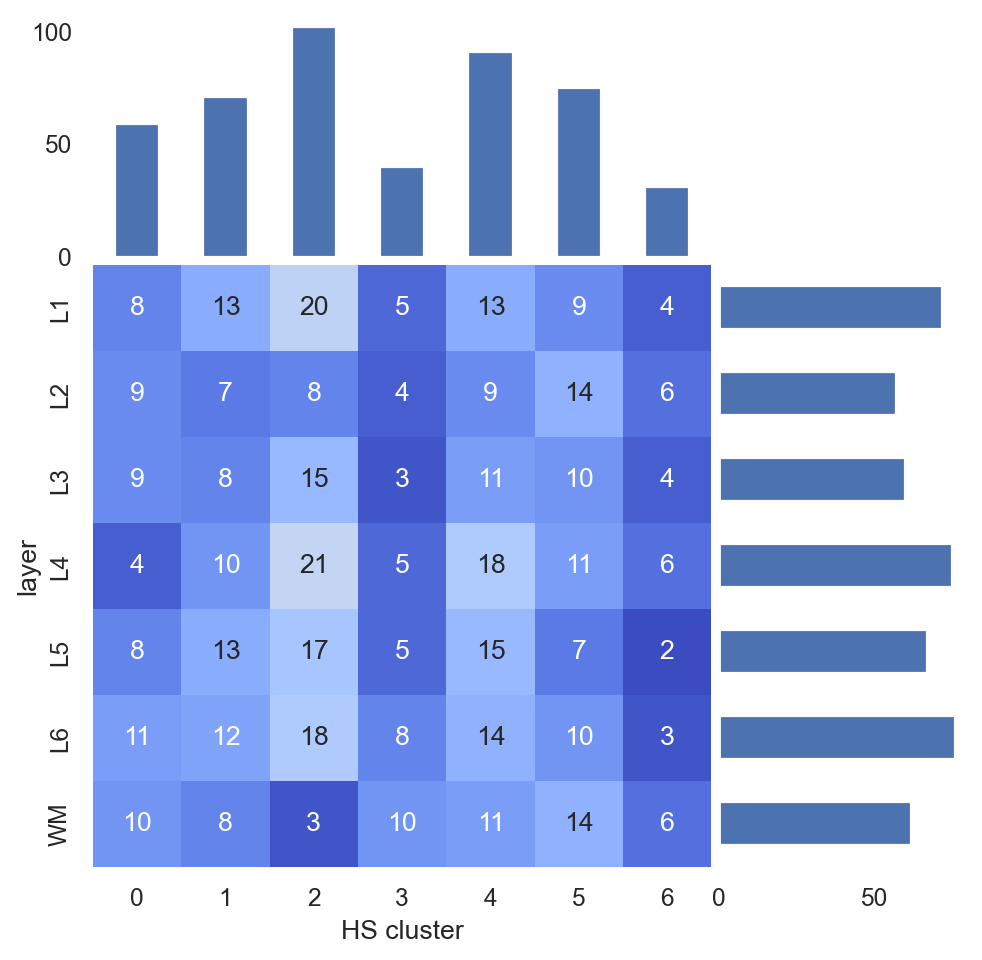

In [170]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

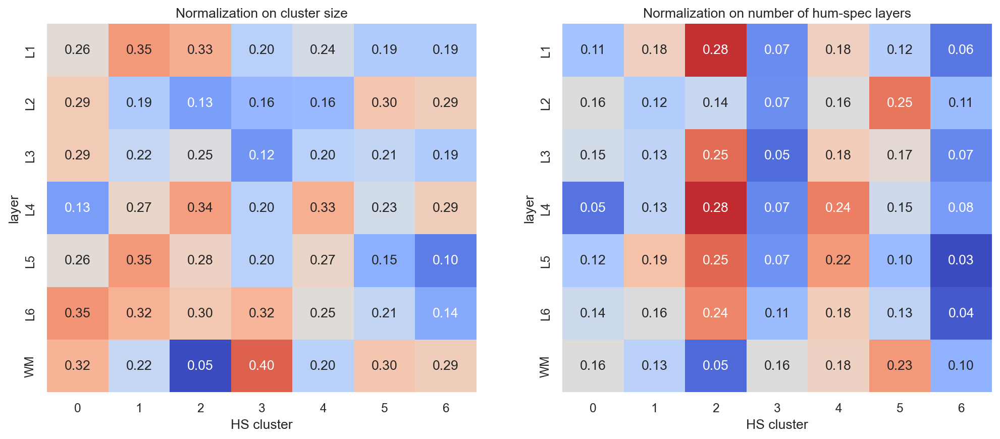

In [171]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size')

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers')
plt.show()

<Axes: xlabel='HS_labels'>

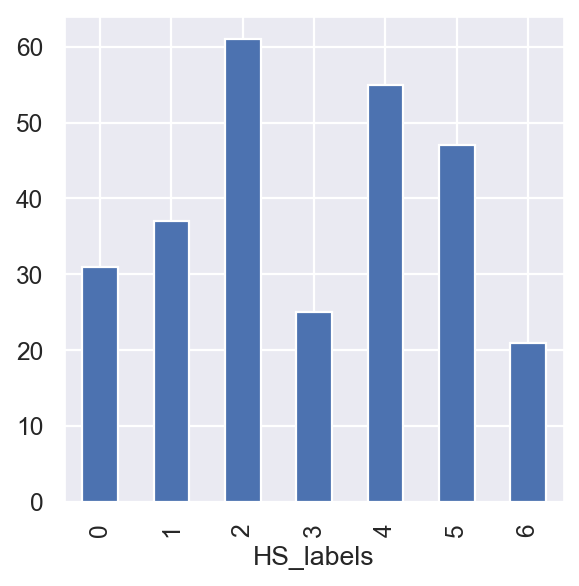

In [172]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

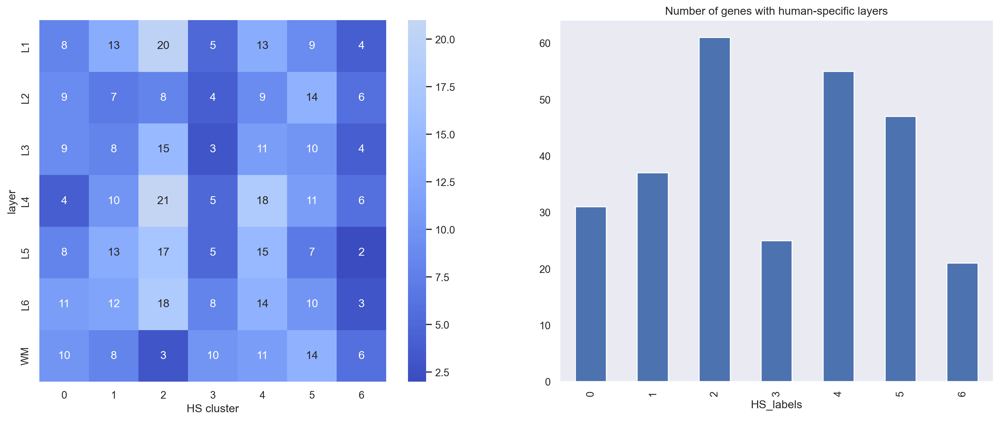

In [173]:
fig, ax = plt.subplots(1, 2, figsize=(18, 7), dpi=120)
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.sum(axis=1).plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
#ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [174]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [175]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ANKRD65      NADK    IGSF21    ARID1A    MAP7D1     MEAF6  \
condition layer                                                               
chimp     L1     0.000000  1.106832 -1.144960  0.053366  0.244616 -1.173535   
          L2     0.000000 -1.020345 -0.709974 -0.246298 -0.129422 -0.722553   
          L3    -0.111803  0.254596 -0.060678 -0.190747 -0.296408  0.342526   
          L4    -0.111803 -0.128780  0.881598 -0.741726 -0.912019  0.933547   
          L5    -0.111803 -0.061237  0.973796 -0.288169 -0.311996  0.993688   

                    RIMS3      PPCS     S1PR1   COL11A1  ...    ZNF579  \
condition layer                                          ...             
chimp     L1     0.378207  0.906215 -0.251976  1.658344  ... -0.807146   
          L2    -0.503711 -0.093807 -0.251976  0.507680  ... -0.023190   
          L3    -0.212455  0.313166 -0.430450 -1.110132  ...  0.859209   
          L4    -0.542110  0.198840 -0.430450 -0.617823  ... -0.529854   
          L5    -0.059982 -0.257897  1.178188 -0.334456  ...  0.223835   

                 TMEM121B      GNAZ   SMARCB1   KREMEN1     EMID1     KCNJ4  \
condition layer                                                               
chimp     L1          0.0 -0.686106 -0.410996 -0.404644 -0.751575 -0.716656   
          L2          0.0  1.093007  0.214845  0.489405  0.073887  0.193893   
          L3          0.0  0.875318 -0.576559  1.038559 -0.133647  0.781086   
          L4          0.0  0.742585 -0.508977 -0.415287 -0.098703 -0.162695   
          L5          0.0 -0.235886  0.247833 -0.415287 -0.005457  0.473958   

                    NRIP1      JAM2    PAXBP1  
condition layer                                
chimp     L1    -0.566547  1.807398 -0.309253  
          L2    -0.373080 -0.764878 -0.309253  
          L3     0.005817 -0.576116  1.498797  
          L4    -0.385707 -0.516873 -0.368866  
          L5    -0.356536 -0.560739  0.071680  

[5 rows x 277 columns]

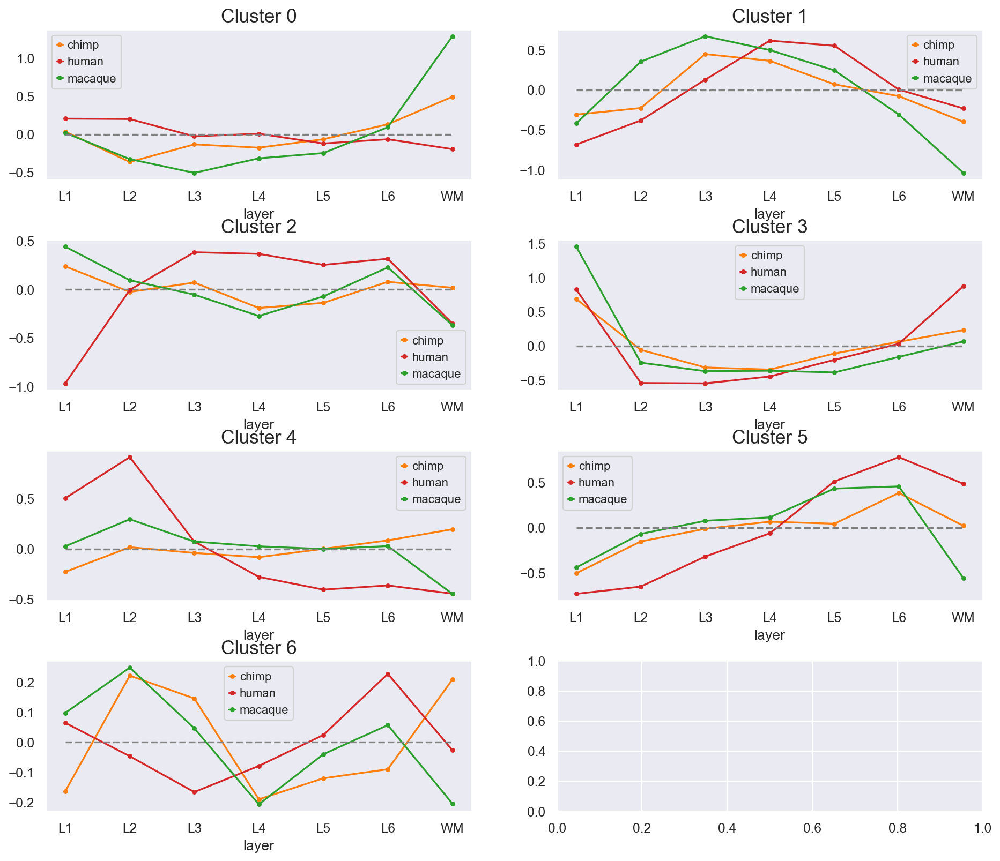

In [176]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(hs_labels.unique(), axes.flatten()):
    genes = hs_labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

## Clusterization of ttest sign and  hum-spec genes

### Hierarchial

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


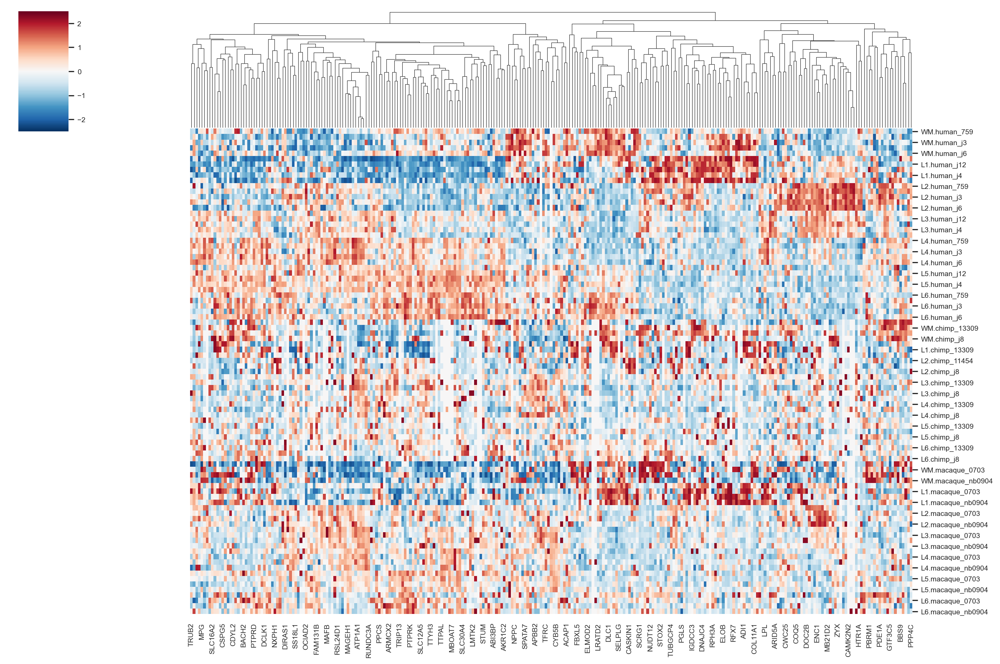

In [177]:
sns.set(font_scale=0.7)
sns.clustermap(df[hum_spec_ttest_inter], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

### Spectral

In [178]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hum_spec_ttest_inter].T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [179]:
labels = pd.Series(clustering.labels_, index=hum_spec_ttest_inter).sort_values()
order = labels.sort_values().index

<Axes: >

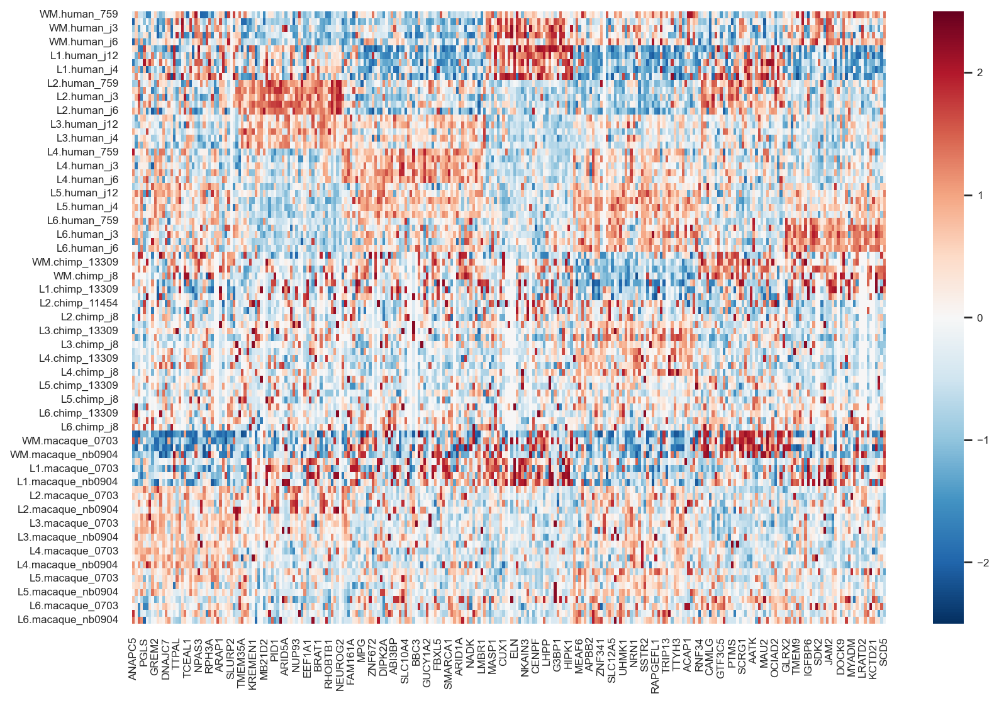

In [180]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
#plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

In [181]:
sns.set(font_scale=1)

### Profiles

In [182]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [183]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ANKRD65      NADK    IGSF21    ARID1A    MAP7D1     MEAF6  \
condition layer                                                               
chimp     L1     0.000000  1.106832 -1.144960  0.053366  0.244616 -1.173535   
          L2     0.000000 -1.020345 -0.709974 -0.246298 -0.129422 -0.722553   
          L3    -0.111803  0.254596 -0.060678 -0.190747 -0.296408  0.342526   
          L4    -0.111803 -0.128780  0.881598 -0.741726 -0.912019  0.933547   
          L5    -0.111803 -0.061237  0.973796 -0.288169 -0.311996  0.993688   

                    RIMS3      PPCS     S1PR1   COL11A1  ...    ZNF579  \
condition layer                                          ...             
chimp     L1     0.378207  0.906215 -0.251976  1.658344  ... -0.807146   
          L2    -0.503711 -0.093807 -0.251976  0.507680  ... -0.023190   
          L3    -0.212455  0.313166 -0.430450 -1.110132  ...  0.859209   
          L4    -0.542110  0.198840 -0.430450 -0.617823  ... -0.529854   
          L5    -0.059982 -0.257897  1.178188 -0.334456  ...  0.223835   

                 TMEM121B      GNAZ   SMARCB1   KREMEN1     EMID1     KCNJ4  \
condition layer                                                               
chimp     L1          0.0 -0.686106 -0.410996 -0.404644 -0.751575 -0.716656   
          L2          0.0  1.093007  0.214845  0.489405  0.073887  0.193893   
          L3          0.0  0.875318 -0.576559  1.038559 -0.133647  0.781086   
          L4          0.0  0.742585 -0.508977 -0.415287 -0.098703 -0.162695   
          L5          0.0 -0.235886  0.247833 -0.415287 -0.005457  0.473958   

                    NRIP1      JAM2    PAXBP1  
condition layer                                
chimp     L1    -0.566547  1.807398 -0.309253  
          L2    -0.373080 -0.764878 -0.309253  
          L3     0.005817 -0.576116  1.498797  
          L4    -0.385707 -0.516873 -0.368866  
          L5    -0.356536 -0.560739  0.071680  

[5 rows x 277 columns]

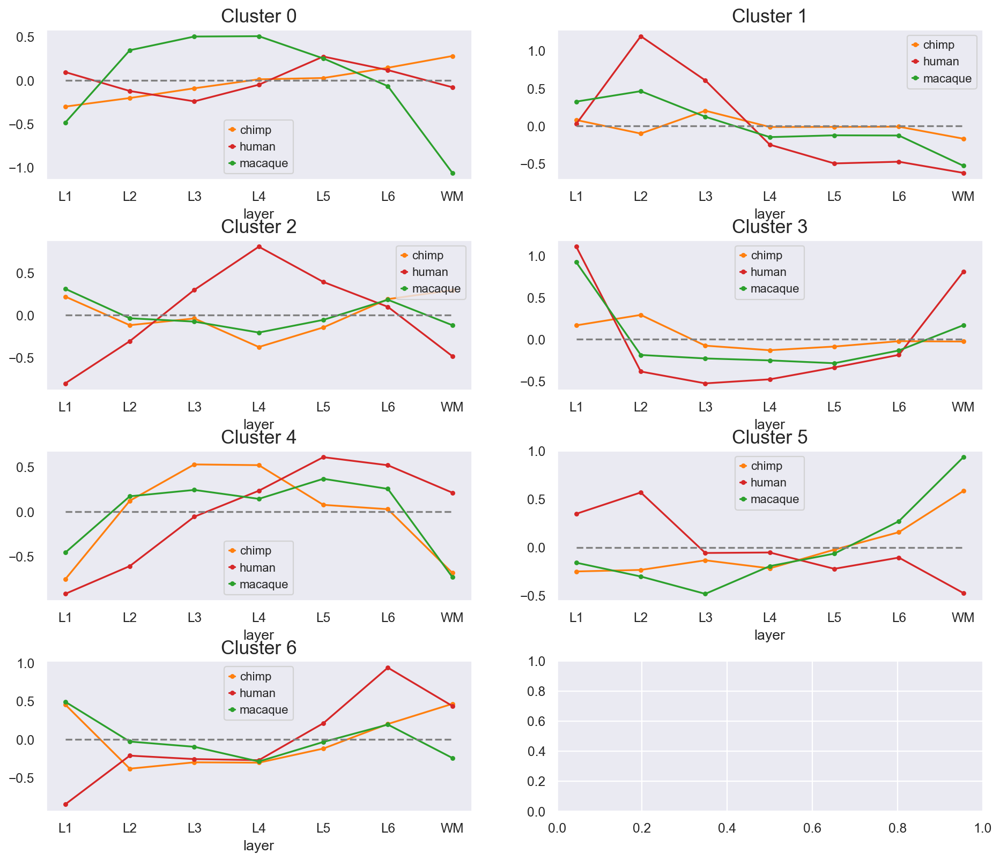

In [184]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Describe clusters

In [185]:
labels.name = 'HS & ttest labels'
pivot_labels = labels.to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS & ttest labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,6,7
HS & ttest labels,,,,,,
0,23,13,2,1,0,0
1,23,10,5,0,0,1
2,19,22,7,3,1,0
3,23,7,2,0,0,0
4,25,13,7,1,0,0
5,15,11,6,0,1,0
6,18,13,4,0,0,1


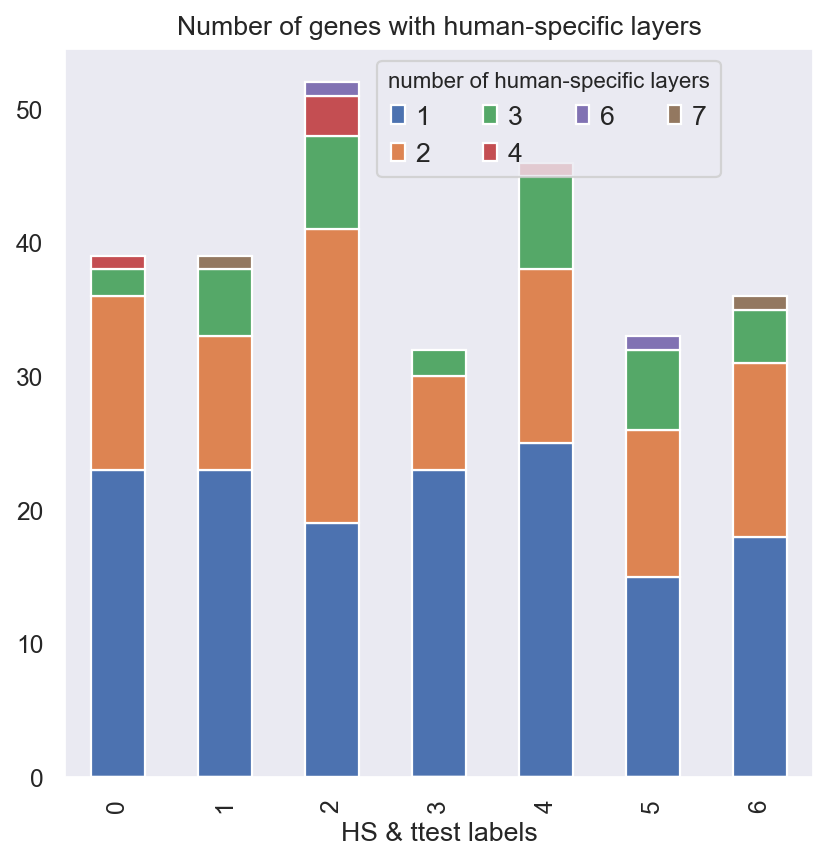

In [186]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [187]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS & ttest cluster'] = labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['HS & ttest cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS & ttest cluster,,,,,,,
0,7,6,14,7,11,8,6
1,10,8,8,12,7,9,11
2,18,8,13,23,16,18,6
3,4,4,3,10,4,9,9
4,13,13,8,11,11,9,11
5,7,10,7,6,8,11,12
6,13,8,7,6,10,12,7


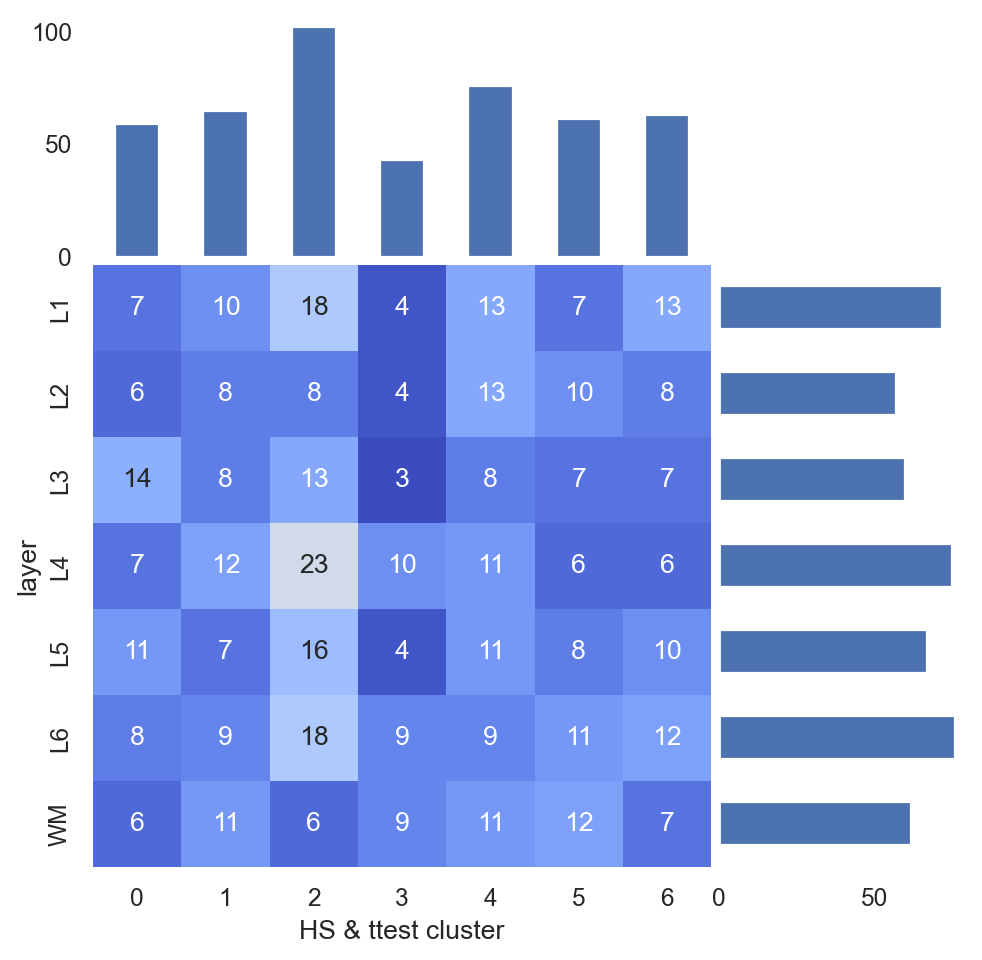

In [188]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

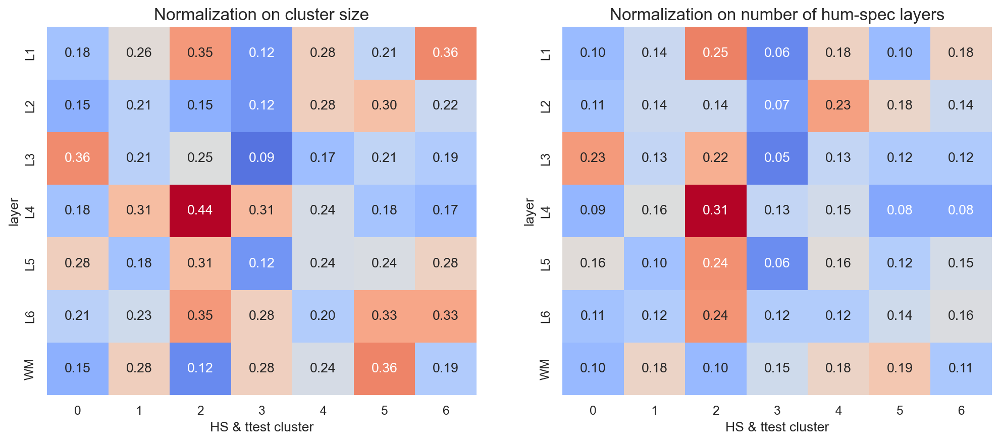

In [189]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=15)

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=15)
plt.show()

<Axes: xlabel='HS & ttest labels'>

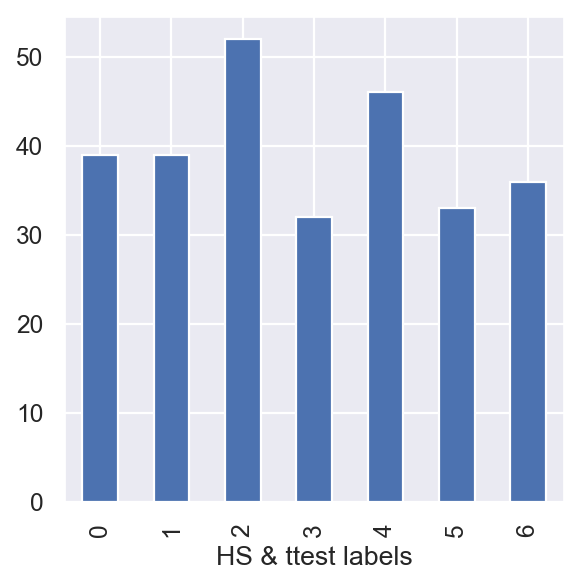

In [190]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

In [191]:
anova_dummies = anova_labels.astype(str).str.get_dummies()
anova_dummies.columns = 'ANOVA_' + anova_dummies.columns
anova_dummies.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7
PRMT2,1,0,0,0,0,0,0
CELF4,1,0,0,0,0,0,0
MRPL40,1,0,0,0,0,0,0
CDH2,1,0,0,0,0,0,0
BRINP2,1,0,0,0,0,0,0


In [192]:
hs_anova_dummies = labels.astype(str).str.get_dummies()
hs_anova_dummies.columns = 'HS & ttest' + hs_anova_dummies.columns
hs_anova_dummies.head()

,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
ANAPC5,1,0,0,0,0,0,0
RHEB,1,0,0,0,0,0,0
HAGHL,1,0,0,0,0,0,0
TOGARAM1,1,0,0,0,0,0,0
NPAS3,1,0,0,0,0,0,0


In [193]:
dummie_concat = pd.concat([anova_dummies, hs_anova_dummies], axis=1).fillna(0)
dummie_concat.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
PRMT2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CELF4,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MRPL40,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CDH2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BRINP2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


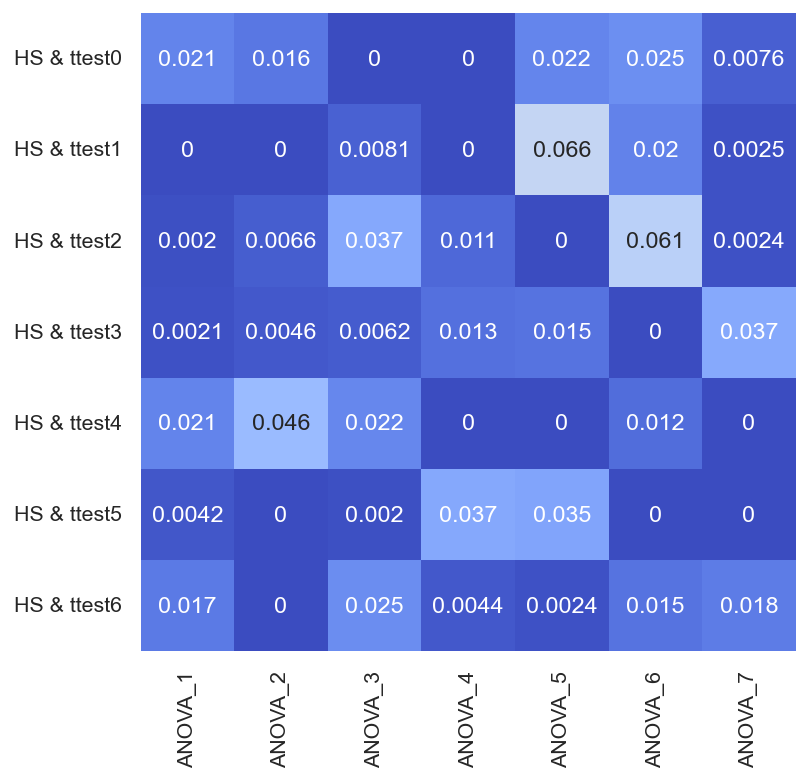

In [194]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_anova_dummies.columns, anova_dummies.columns], annot=True, cmap = 'coolwarm', center=0.08, cbar=False)
plt.grid(False)

In [195]:
gene_inter = labels.index.intersection(anova_labels.index)
table_to_pivot = pd.concat([anova_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['ANOVA', 'HS & ttest']
pivot_labels_inter = table_to_pivot.groupby('ANOVA').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ttest,0,1,2,3,4,5,6
ANOVA,,,,,,,
1,10.0,0.0,1.0,1.0,10.0,2.0,8.0
2,7.0,0.0,3.0,2.0,20.0,0.0,0.0
3,0.0,4.0,18.0,3.0,11.0,1.0,12.0
4,0.0,0.0,5.0,6.0,0.0,16.0,2.0
5,9.0,26.0,0.0,6.0,0.0,14.0,1.0
6,10.0,8.0,24.0,0.0,5.0,0.0,6.0
7,3.0,1.0,1.0,14.0,0.0,0.0,7.0


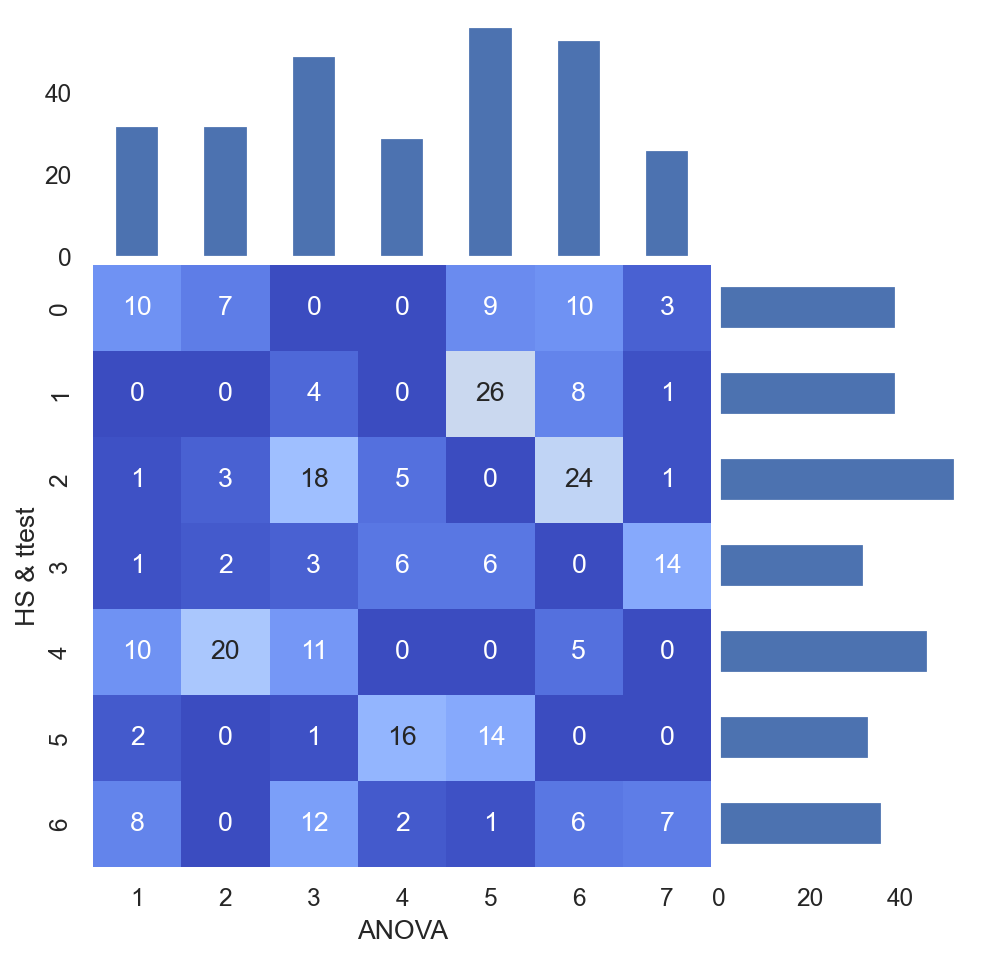

In [196]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=30, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

In [197]:
hs_dummies = hs_labels.astype(str).str.get_dummies()
hs_dummies.columns = 'HS' + hs_dummies.columns
hs_dummies.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6
CDK4,1,0,0,0,0,0,0
ANP32B,1,0,0,0,0,0,0
FBXL5,1,0,0,0,0,0,0
ASCC3,1,0,0,0,0,0,0
GPN1,1,0,0,0,0,0,0


In [198]:
hs_ttest_dummies = labels.astype(str).str.get_dummies()
hs_ttest_dummies.columns = 'HS & ttest' + hs_ttest_dummies.columns
hs_ttest_dummies.head()

,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
ANAPC5,1,0,0,0,0,0,0
RHEB,1,0,0,0,0,0,0
HAGHL,1,0,0,0,0,0,0
TOGARAM1,1,0,0,0,0,0,0
NPAS3,1,0,0,0,0,0,0


In [199]:
dummie_concat = pd.concat([hs_dummies, hs_ttest_dummies], axis=1).fillna(0)
dummie_concat.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
CDK4,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ANP32B,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FBXL5,1,0,0,0,0,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
ASCC3,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GPN1,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


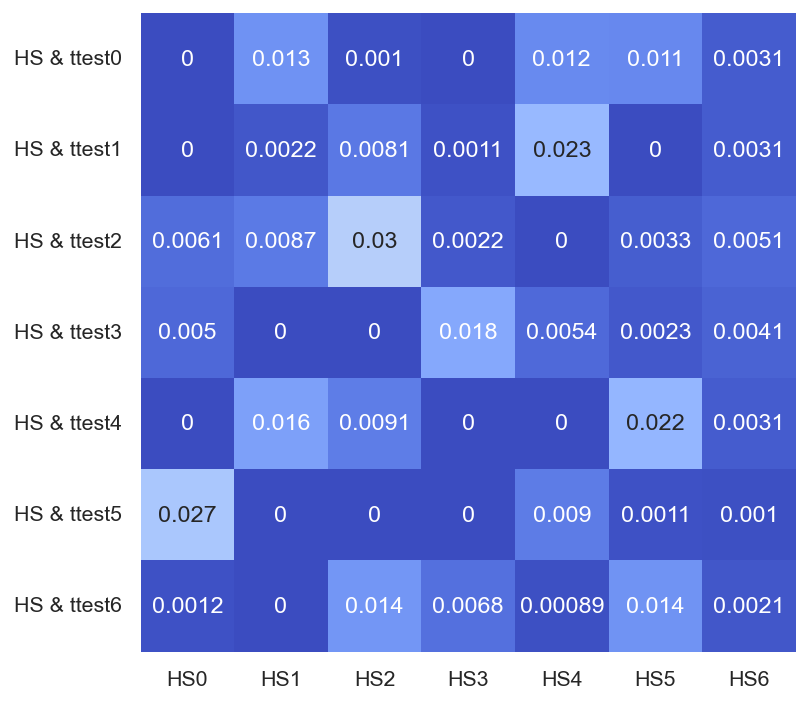

In [200]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_ttest_dummies.columns, hs_dummies.columns], annot=True, cmap = 'coolwarm', center=0.04, cbar=False)
plt.grid(False)

In [201]:
gene_inter = labels.index.intersection(hs_labels.index)
table_to_pivot = pd.concat([hs_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['HS', 'HS & ttest']
pivot_labels_inter = table_to_pivot.groupby('HS').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ttest,0,1,2,3,4,5,6
HS,,,,,,,
0,0.0,0.0,5.0,4.0,0.0,21.0,1.0
1,12.0,2.0,8.0,0.0,15.0,0.0,0.0
2,1.0,8.0,29.0,0.0,9.0,0.0,14.0
3,0.0,1.0,2.0,16.0,0.0,0.0,6.0
4,13.0,25.0,0.0,6.0,0.0,10.0,1.0
5,10.0,0.0,3.0,2.0,19.0,1.0,12.0
6,3.0,3.0,5.0,4.0,3.0,1.0,2.0


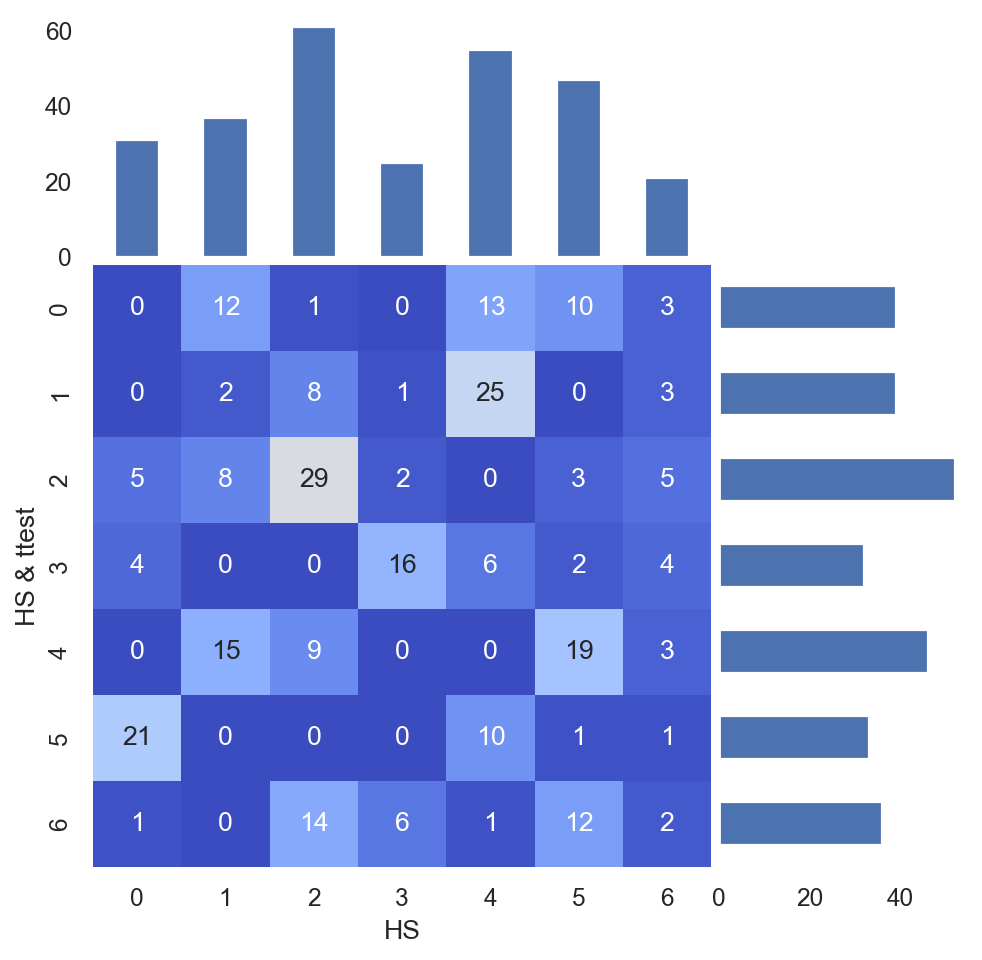

In [202]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=30, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)